## ⚙️ Import Libraries

In [1]:
import os
from datetime import datetime

import numpy as np
import pandas as pd

import tensorflow as tf
from tensorflow import keras as tfk
from tensorflow.keras import layers as tfkl

import matplotlib.pyplot as plt
%matplotlib inline

np.random.seed(42)
tf.random.set_seed(42)

print(f"TensorFlow version: {tf.__version__}")
print(f"Keras version: {tfk.__version__}")
print(f"GPU devices: {len(tf.config.list_physical_devices('GPU'))}")

TensorFlow version: 2.16.1
Keras version: 3.3.3
GPU devices: 2


## ⏳ Load the Data (no outlier)

In [2]:
from sklearn.model_selection import train_test_split
import numpy as np
data = np.load("/kaggle/input/cleeean-data/cleaned_data.npz")

X_train = data["training_set_filtered"]

y_train = data["masks_filtered"]

X_test = data["test_set"]
print(y_train[0].shape)
print(f"Test X shape: {X_test.shape}")

# Perform train-validation split (80-20 split)
X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.2, random_state=42
)

print(f"Train set: {X_train.shape}, {y_train.shape}")
print(f"Validation set: {X_val.shape}, {y_val.shape}")

(64, 128)
Test X shape: (10022, 64, 128)
Train set: (2004, 64, 128), (2004, 64, 128)
Validation set: (501, 64, 128), (501, 64, 128)


In [3]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

# Load data
data = np.load("/kaggle/input/cleeean-data/cleaned_data.npz")

X_train = data["training_set_filtered"]
y_train = data["masks_filtered"]
X_test = data["test_set"]

print(f"Original Train X shape: {X_train.shape}, Train y shape: {y_train.shape}")
print(f"Test X shape: {X_test.shape}")

# Perform train-validation split (80-20 split)
X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.2, random_state=42
)

print(f"Train set: {X_train.shape}, {y_train.shape}")
print(f"Validation set: {X_val.shape}, {y_val.shape}")

# Filter out images with single or empty class in y_train
multi_class_indices = [i for i in range(len(y_train)) if len(np.unique(y_train[i])) > 1]
X_train = X_train[multi_class_indices]
y_train = y_train[multi_class_indices]

print(f"Filtered Train X shape: {X_train.shape}, Train y shape: {y_train.shape}")

Original Train X shape: (2505, 64, 128), Train y shape: (2505, 64, 128)
Test X shape: (10022, 64, 128)
Train set: (2004, 64, 128), (2004, 64, 128)
Validation set: (501, 64, 128), (501, 64, 128)
Filtered Train X shape: (1675, 64, 128), Train y shape: (1675, 64, 128)


In [4]:

print(f"Train set: {X_train.shape}, {y_train.shape}")
print(f"Validation set: {X_val.shape}, {y_val.shape}")

Train set: (1675, 64, 128), (1675, 64, 128)
Validation set: (501, 64, 128), (501, 64, 128)


### Outliers removed

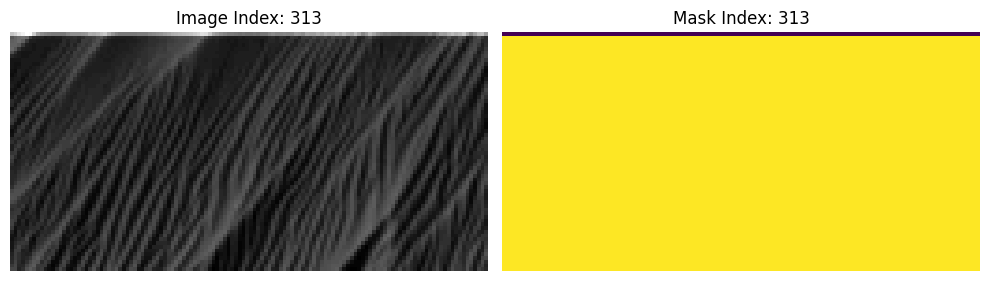

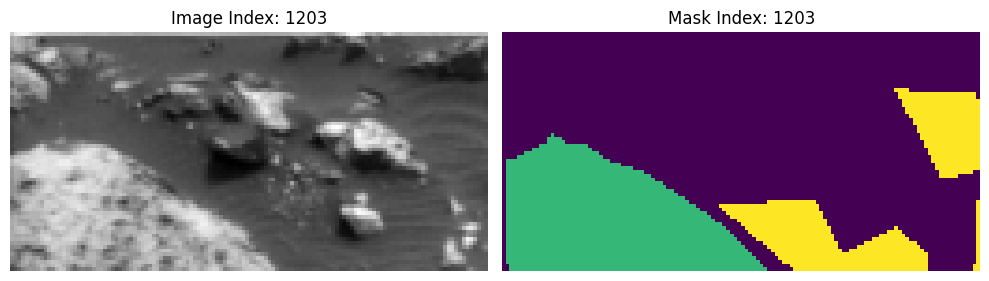

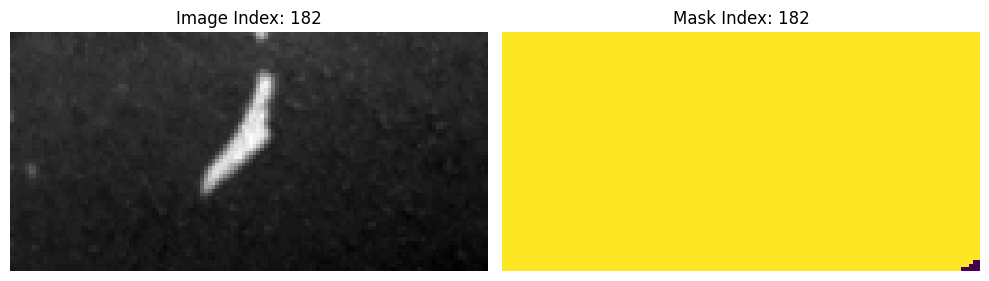

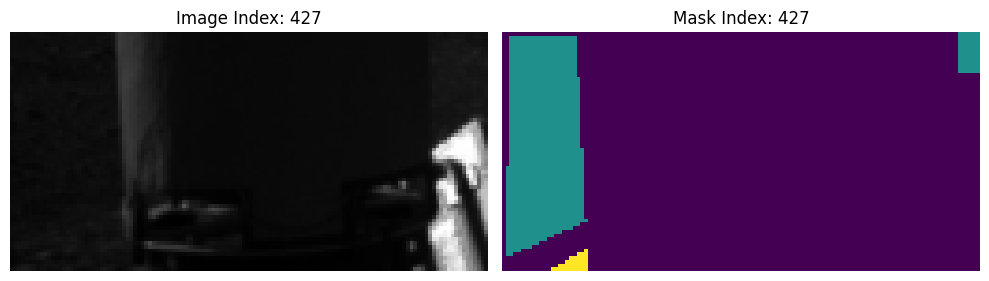

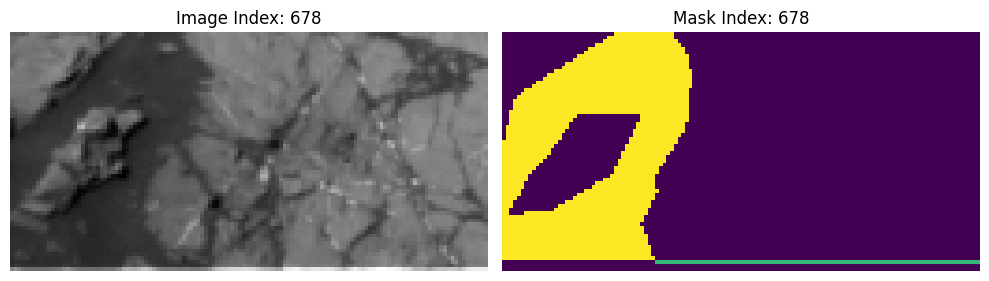

In [5]:
import random

# Visualize random image-mask pairs
for _ in range(5):
    idx = random.randint(0, len(X_train) - 1)
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))

    # Display input image
    ax[0].imshow(X_train[idx], cmap="gray")
    ax[0].set_title(f"Image Index: {idx}")
    ax[0].axis("off")

    # Display corresponding mask
    ax[1].imshow(y_train[idx], cmap="viridis")
    ax[1].set_title(f"Mask Index: {idx}")
    ax[1].axis("off")

    plt.tight_layout()
    plt.show()

## LETS DO SOME AUGMENTATION!!

## invert image and noise

/tmp/ipykernel_23/1632159539.py:66: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(len(images), 6, i * 6 + 3)
/tmp/ipykernel_23/1632159539.py:88: UserWarning: tight_layout not applied: number of columns in subplot specifications must be multiples of one another.
  plt.tight_layout()


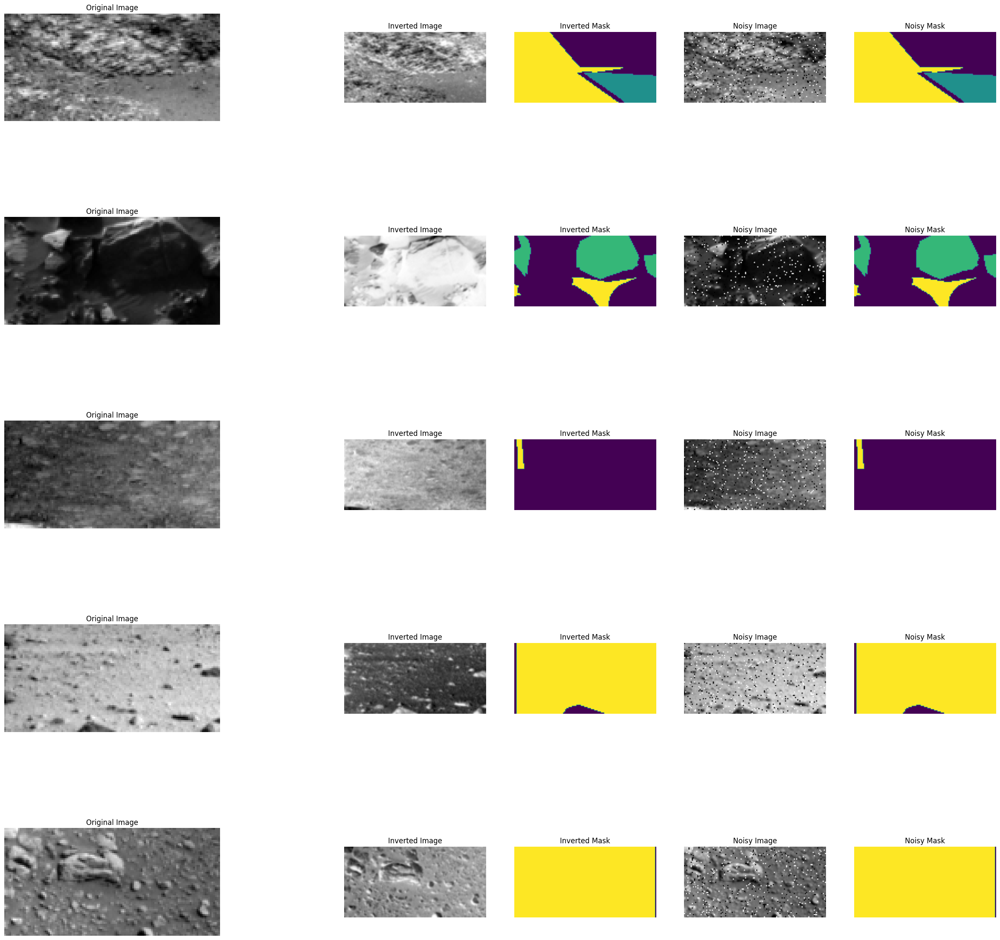

In [6]:


import numpy as np
from skimage.util import random_noise

# Define augmentation functions with mask handling
def invert_image(image, mask):
    return 255 - image, mask  # Mask remains unchanged

def add_salt_and_pepper_noise(image, mask, prob=0.03):
    """
    Add salt-and-pepper noise to an image while maintaining its original value range.

    Args:
        image (np.ndarray): Input image.
        mask (np.ndarray): Corresponding mask (unchanged).
        prob (float): Probability of noise per pixel.

    Returns:
        noisy_image (np.ndarray): Image with noise applied.
        mask (np.ndarray): Unchanged mask.
    """
    # Save the original range
    original_min = image.min()
    original_max = image.max()

    # Normalize the image to [0, 1]
    normalized_image = (image - original_min) / (original_max - original_min)

    # Generate random noise map
    random_map = np.random.random(image.shape)
    noisy_image = normalized_image.copy()
    noisy_image[random_map < prob] = 0  # Pepper
    noisy_image[random_map > (1 - prob)] = 1  # Salt

    # Rescale back to the original range
    noisy_image = noisy_image * (original_max - original_min) + original_min
    noisy_image = noisy_image.astype(image.dtype)  # Ensure the original data type is preserved

    return noisy_image, mask

"""def rotate_image(image, mask, angle):
    rotated_image = rotate(image, angle, reshape=False, mode='constant', cval=0)
    rotated_mask = rotate(mask, angle, reshape=False, mode='constant', order=0)
    return rotated_image, rotated_mask"""
"""
def adjust_brightness(image, mask, factor=1.2):
    brightened_image = np.clip(image * factor, 0, 255).astype(np.uint8)
    return brightened_image, mask  # Mask remains unchanged"""

# Visualize augmentations with masks
def visualize_all_augmentations(images, masks):
    plt.figure(figsize=(30, 30))
    for i, (image, mask) in enumerate(zip(images, masks)):
        # Original image and mask
        plt.subplot(len(images), 4, i * 4 + 1)
        plt.imshow(image, cmap="gray")
        plt.title("Original Image")
        plt.axis("off")

        plt.subplot(len(images), 4, i * 4 + 2)
        plt.imshow(mask, cmap="viridis")
        plt.title("Original Mask")
        plt.axis("off")

        # Inversion
        inverted_image, inverted_mask = invert_image(image, mask)
        plt.subplot(len(images), 6, i * 6 + 3)
        plt.imshow(inverted_image, cmap="gray")
        plt.title("Inverted Image")
        plt.axis("off")

        plt.subplot(len(images), 6, i * 6 + 4)
        plt.imshow(inverted_mask, cmap="viridis")
        plt.title("Inverted Mask")
        plt.axis("off")

        # Noise
        noisy_image, noisy_mask = add_salt_and_pepper_noise(image, mask)
        plt.subplot(len(images), 6, i * 6 + 5)
        plt.imshow(noisy_image, cmap="gray")
        plt.title("Noisy Image")
        plt.axis("off")

        plt.subplot(len(images), 6, i * 6 + 6)
        plt.imshow(noisy_mask, cmap="viridis")
        plt.title("Noisy Mask")
        plt.axis("off")

    plt.tight_layout()
    plt.show()


# Randomly select 5 samples from the dataset
random_indices = np.random.choice(len(X_train), size=5, replace=False)
sample_images = X_train[random_indices]
sample_masks = y_train[random_indices]

# Visualize augmentations
visualize_all_augmentations(sample_images, sample_masks)


### rotation

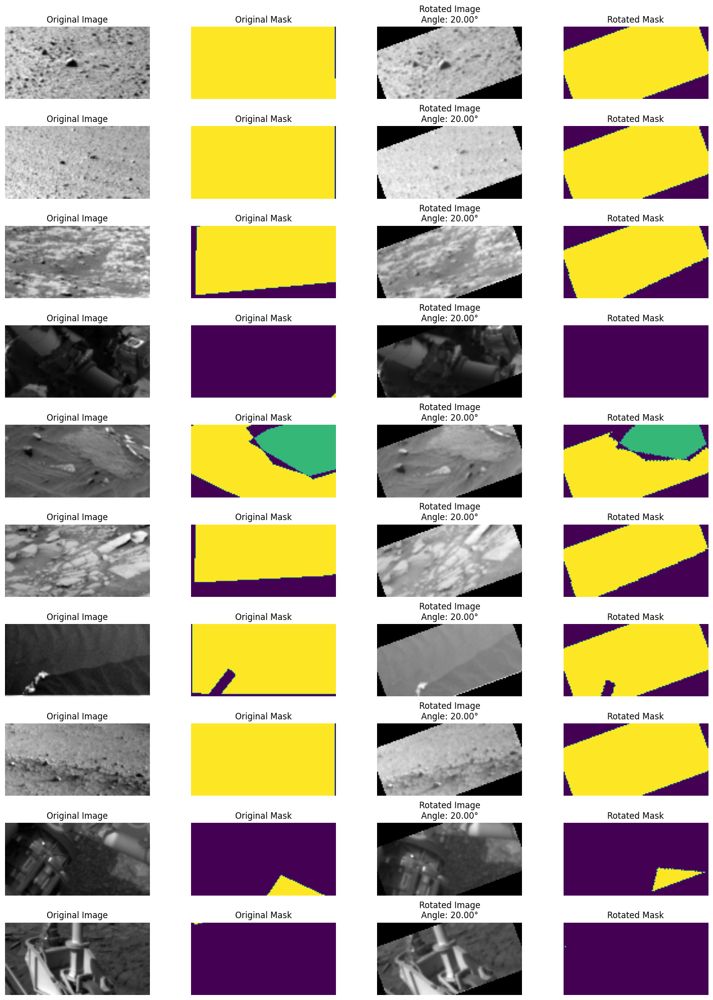

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import rotate

# Define the rotation function using scipy
def rotate_image_and_mask(image, mask, angle):
    """
    Rotate a grayscale image and its corresponding mask by a given angle.
    """
    # Rotate the grayscale image (bilinear interpolation)
    rotated_image = rotate(image, angle, reshape=False, mode="constant", order=1)

    # Rotate the mask (nearest-neighbor interpolation)
    rotated_mask = rotate(mask, angle, reshape=False, mode="constant", order=0)

    return rotated_image, rotated_mask

# Randomly select 10 images
random_indices = np.random.choice(len(X_train), size=10, replace=False)
selected_images = X_train[random_indices]
selected_masks = y_train[random_indices]

# Apply random rotation and visualize
plt.figure(figsize=(15, 20))
for i, (image, mask) in enumerate(zip(selected_images, selected_masks)):
    # Generate a random angle for rotation
    angle = np.random.uniform(20, 20)  # Random angle between -30° and 30°

    # Rotate the image and mask
    rotated_image, rotated_mask = rotate_image_and_mask(image, mask, angle)

    # Plot original and rotated images/masks
    plt.subplot(10, 4, i * 4 + 1)
    plt.imshow(image, cmap="gray")
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(10, 4, i * 4 + 2)
    plt.imshow(mask, cmap="viridis")
    plt.title("Original Mask")
    plt.axis("off")

    plt.subplot(10, 4, i * 4 + 3)
    plt.imshow(rotated_image, cmap="gray")
    plt.title(f"Rotated Image\nAngle: {angle:.2f}°")
    plt.axis("off")

    plt.subplot(10, 4, i * 4 + 4)
    plt.imshow(rotated_mask, cmap="viridis")
    plt.title("Rotated Mask")
    plt.axis("off")

plt.tight_layout()
plt.show()


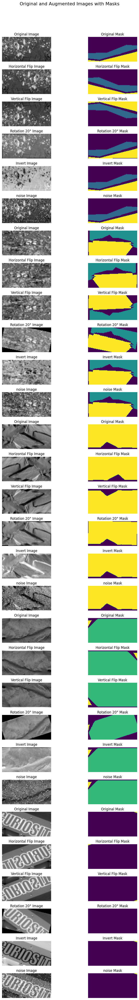

In [8]:
# Helper functions for applying augmentations
def augment_image_and_mask(image, mask, augment_type):
    if augment_type == "Horizontal Flip":
        return np.fliplr(image), np.fliplr(mask)
    elif augment_type == "Vertical Flip":
        return np.flipud(image), np.flipud(mask)
    elif augment_type == "Rotation 20°":
        angle = np.random.uniform(-20, 20)
        # Rotate the grayscale image (bilinear interpolation)
        rotated_image = rotate(image, angle, reshape=False, mode="constant", order=1)

        # Rotate the mask (nearest-neighbor interpolation)
        rotated_mask = rotate(mask, angle, reshape=False, mode="constant", order=0)

        return rotated_image, rotated_mask
    elif augment_type=="Invert":
        inverted_image, inverted_mask = invert_image(image, mask)
        return inverted_image,inverted_mask
    elif augment_type=="noise":
        noisy_image, noisy_mask = add_salt_and_pepper_noise(image, mask)
        return noisy_image,noisy_mask
        
    """elif augment_type == "Zoom (0.8-1.2)":
        zoom_factor = random.uniform(0.8, 1.2)
        zoom_image = np.clip(image * zoom_factor, 0, 255)
        return zoom_image, mask
    elif augment_type == "Shift (Width and Height)":
        shift_x, shift_y = random.uniform(-0.1, 0.1), random.uniform(-0.1, 0.1)
        return shift(image, [shift_x * image.shape[0], shift_y * image.shape[1]]), shift(mask, [shift_x * mask.shape[0], shift_y * mask.shape[1]], order=0)"""
    return image, mask

# Define augmentations
data_augmentations = {
    "Horizontal Flip": "Horizontal Flip",
    "Vertical Flip": "Vertical Flip",
    "Rotation 20°": "Rotation 20°",
    "Invert":"Invert",
    "noise":"noise"
    #"Zoom (0.8-1.2)": "Zoom (0.8-1.2)",
    #"Shift (Width and Height)": "Shift (Width and Height)",
}

# Visualize 5 random images and masks with augmentations
random_indices = np.random.choice(len(X_train), size=5, replace=False)
# Adjusting to display original image/mask with augmentations below each
fig, axes = plt.subplots(len(random_indices) * (1 + len(data_augmentations)), 2, figsize=(10, 50))
fig.suptitle("Original and Augmented Images with Masks", fontsize=16)

for idx, random_idx in enumerate(random_indices):
    original_image = X_train[random_idx]
    original_mask = y_train[random_idx]

    # Plot original image and mask
    row = idx * (1 + len(data_augmentations))  # Calculate starting row for each original image
    axes[row, 0].imshow(original_image, cmap='gray')
    axes[row, 0].set_title("Original Image")
    axes[row, 0].axis('off')

    axes[row, 1].imshow(original_mask)
    axes[row, 1].set_title("Original Mask")
    axes[row, 1].axis('off')

    # Apply augmentations and plot augmented images and masks
    for aug_idx, (augmentation_name, augment_type) in enumerate(data_augmentations.items()):
        augmented_image, augmented_mask = augment_image_and_mask(original_image, original_mask, augment_type)

        axes[row + aug_idx + 1, 0].imshow(augmented_image , cmap='gray' )
        axes[row + aug_idx + 1, 0].set_title(f"{augmentation_name} Image")
        axes[row + aug_idx + 1, 0].axis('off')

        axes[row + aug_idx + 1, 1].imshow(augmented_mask)
        axes[row + aug_idx + 1, 1].set_title(f"{augmentation_name} Mask")
        axes[row + aug_idx + 1, 1].axis('off')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

In [9]:
import os
import matplotlib.pyplot as plt

# Directory where augmented files are stored
output_dir = "augmented_data"
os.makedirs(output_dir, exist_ok=True)

# Re-save augmented datasets to the directory with structured filenames
for augmentation_name, augment_type in data_augmentations.items():
    augmented_images = []
    augmented_masks = []

    for image, mask in zip(X_train, y_train):
        aug_image, aug_mask = augment_image_and_mask(image, mask, augment_type)
        augmented_images.append(aug_image)
        augmented_masks.append(aug_mask)

    # Convert lists to numpy arrays
    augmented_images = np.array(augmented_images)
    augmented_masks = np.array(augmented_masks)

    # Save to npz file
    output_path = os.path.join(output_dir, f"{augmentation_name.replace(' ', '_').lower()}.npz")
    np.savez_compressed(output_path, augmented_images=augmented_images, augmented_masks=augmented_masks)


File: rotation_20°.npz
  Key: augmented_images, Shape: (1675, 64, 128)
  Key: augmented_masks, Shape: (1675, 64, 128)


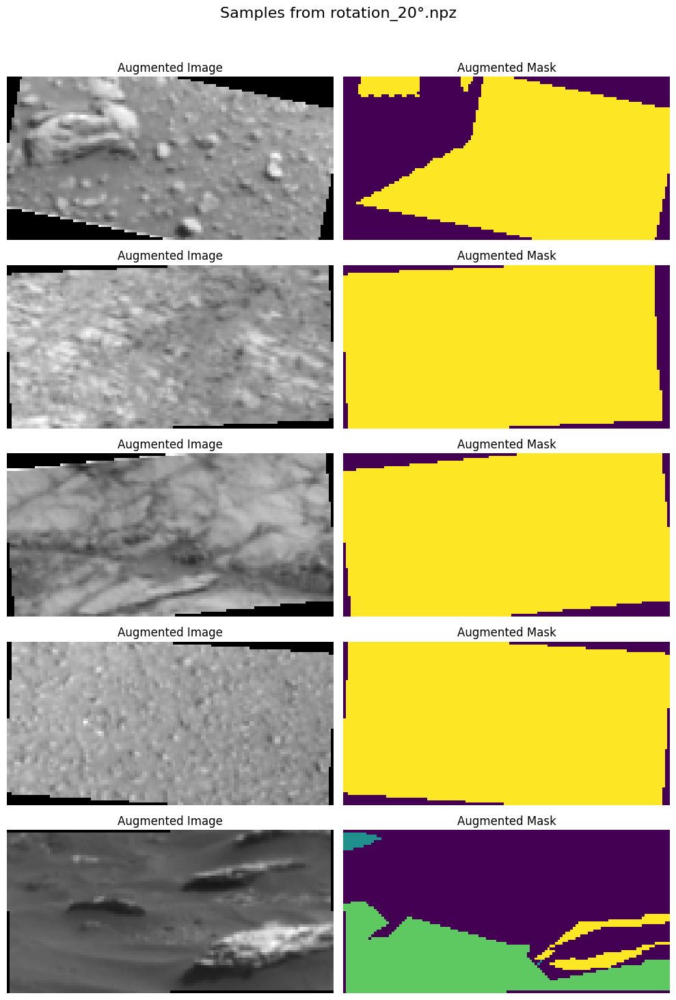

File: invert.npz
  Key: augmented_images, Shape: (1675, 64, 128)
  Key: augmented_masks, Shape: (1675, 64, 128)


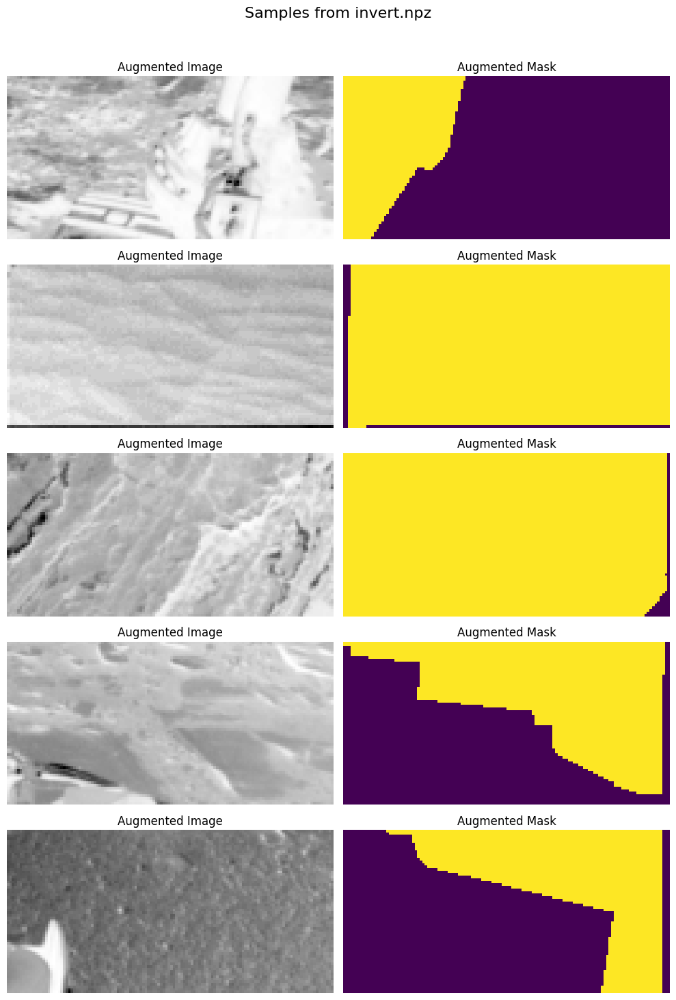

File: vertical_flip.npz
  Key: augmented_images, Shape: (1675, 64, 128)
  Key: augmented_masks, Shape: (1675, 64, 128)


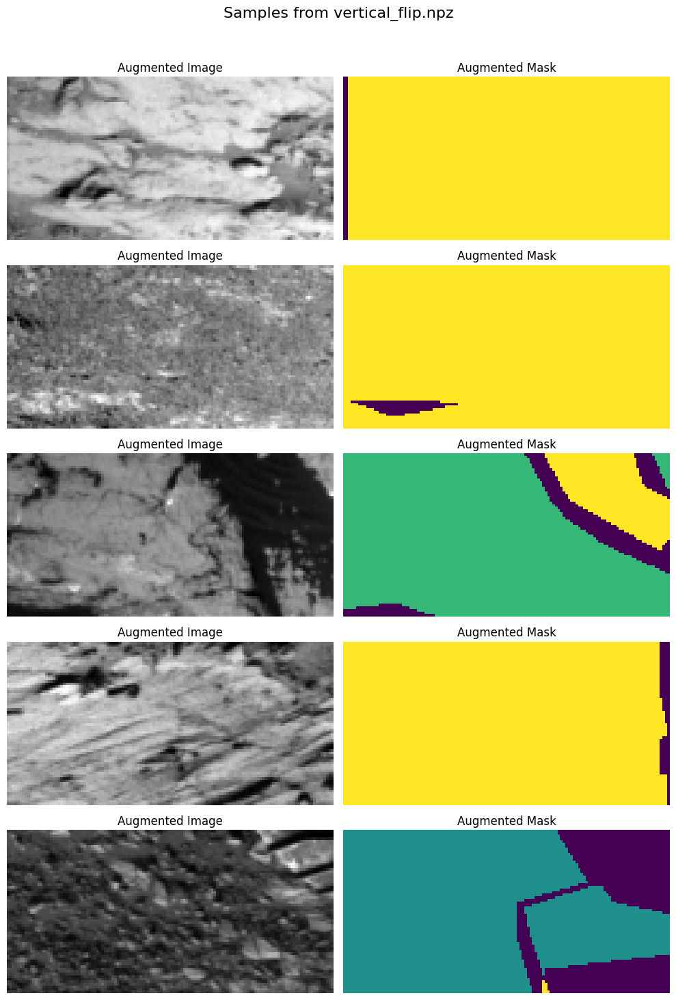

File: horizontal_flip.npz
  Key: augmented_images, Shape: (1675, 64, 128)
  Key: augmented_masks, Shape: (1675, 64, 128)


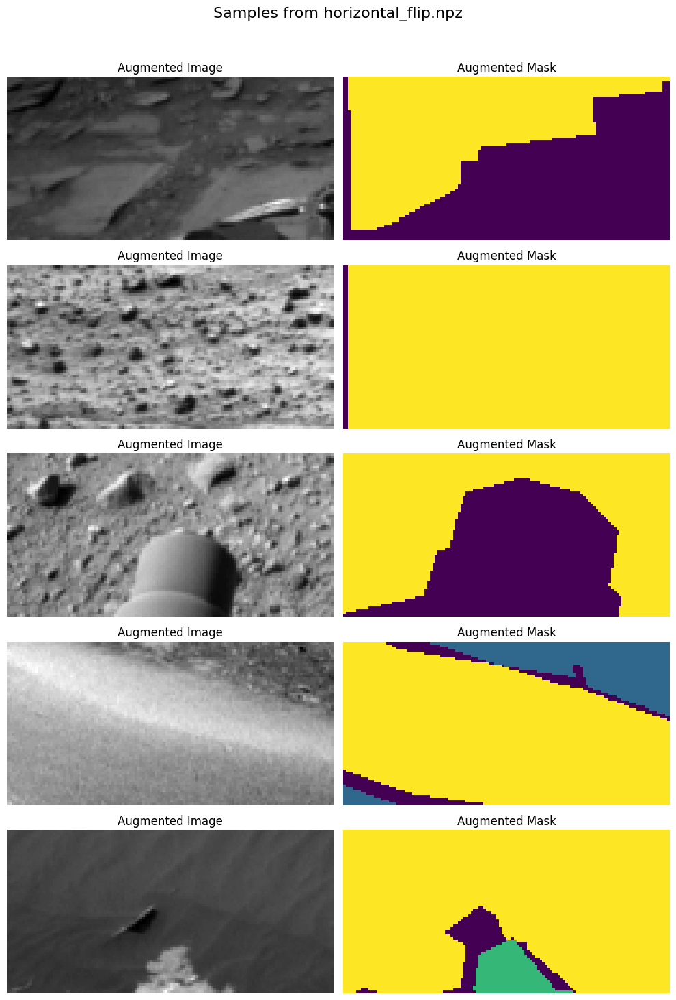

File: noise.npz
  Key: augmented_images, Shape: (1675, 64, 128)
  Key: augmented_masks, Shape: (1675, 64, 128)


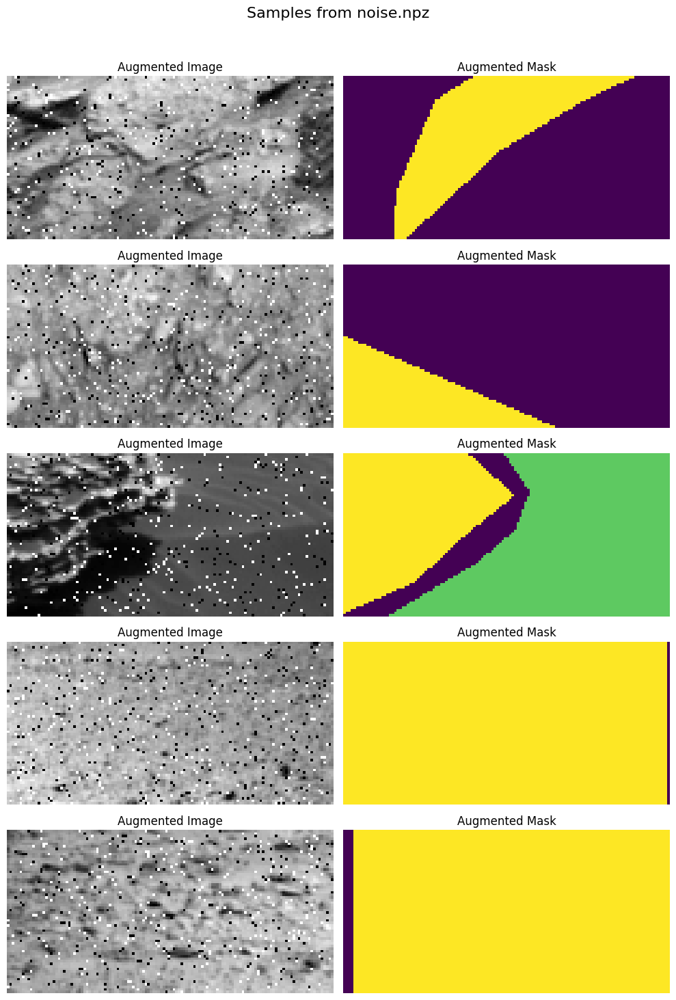

In [10]:
# Read the saved files and display details
output_dir="/kaggle/working/augmented_data"
for file_name in os.listdir(output_dir):
    if file_name.endswith(".npz"):
        file_path = os.path.join(output_dir, file_name)
        data = np.load(file_path)

        # Display keys and their shapes
        print(f"File: {file_name}")
        for key in data.keys():
            print(f"  Key: {key}, Shape: {data[key].shape}")

        # Plot 5 random images and masks
        fig, axes = plt.subplots(5, 2, figsize=(10, 15))
        fig.suptitle(f"Samples from {file_name}", fontsize=16)
        for i in range(5):
            random_idx = np.random.randint(data["augmented_images"].shape[0])
            axes[i, 0].imshow(data["augmented_images"][random_idx], cmap="gray")
            axes[i, 0].set_title("Augmented Image")
            axes[i, 0].axis("off")
            axes[i, 1].imshow(data["augmented_masks"][random_idx])
            axes[i, 1].set_title("Augmented Mask")
            axes[i, 1].axis("off")
        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.show()

## 🛠️ Train and Save the Model

In [11]:
# Load the rotation augmentation dataset
rotation_file_path = os.path.join("/kaggle/working/augmented_data/horizontal_flip.npz")
rotation_data = np.load(rotation_file_path)

# Extract augmented images and masks
augmented_images = rotation_data["augmented_images"]
augmented_masks = rotation_data["augmented_masks"]

# Merge with original X_train and y_train
X_train = np.concatenate([X_train, augmented_images], axis=0)
y_train = np.concatenate([y_train, augmented_masks], axis=0)

# Display the new shapes
print(f"New X_train shape: {X_train.shape}")
print(f"New y_train shape: {y_train.shape}")

New X_train shape: (3350, 64, 128)
New y_train shape: (3350, 64, 128)


In [12]:
# Load the rotation augmentation dataset
rotation_file_path = os.path.join("/kaggle/working/augmented_data/vertical_flip.npz")
rotation_data = np.load(rotation_file_path)

# Extract augmented images and masks
augmented_images = rotation_data["augmented_images"]
augmented_masks = rotation_data["augmented_masks"]

# Merge with original X_train and y_train
X_train = np.concatenate([X_train, augmented_images], axis=0)
y_train = np.concatenate([y_train, augmented_masks], axis=0)

# Display the new shapes
print(f"New X_train shape: {X_train.shape}")
print(f"New y_train shape: {y_train.shape}")

New X_train shape: (5025, 64, 128)
New y_train shape: (5025, 64, 128)


In [13]:
# Load the rotation augmentation dataset
rotation_file_path = os.path.join("/kaggle/working/augmented_data/rotation_20°.npz")
rotation_data = np.load(rotation_file_path)

# Extract augmented images and masks
augmented_images = rotation_data["augmented_images"]
augmented_masks = rotation_data["augmented_masks"]

# Merge with original X_train and y_train
X_train = np.concatenate([X_train, augmented_images], axis=0)
y_train = np.concatenate([y_train, augmented_masks], axis=0)

# Display the new shapes
print(f"New X_train shape: {X_train.shape}")
print(f"New y_train shape: {y_train.shape}")

New X_train shape: (6700, 64, 128)
New y_train shape: (6700, 64, 128)


In [14]:
# Load the rotation augmentation dataset
rotation_file_path = os.path.join("/kaggle/working/augmented_data/invert.npz")
rotation_data = np.load(rotation_file_path)

# Extract augmented images and masks
augmented_images = rotation_data["augmented_images"]
augmented_masks = rotation_data["augmented_masks"]

# Merge with original X_train and y_train
X_train = np.concatenate([X_train, augmented_images], axis=0)
y_train = np.concatenate([y_train, augmented_masks], axis=0)

# Display the new shapes
print(f"New X_train shape: {X_train.shape}")
print(f"New y_train shape: {y_train.shape}")

New X_train shape: (8375, 64, 128)
New y_train shape: (8375, 64, 128)


In [15]:
# Load the rotation augmentation dataset
rotation_file_path = os.path.join("/kaggle/working/augmented_data/noise.npz")
rotation_data = np.load(rotation_file_path)

# Extract augmented images and masks
augmented_images = rotation_data["augmented_images"]
augmented_masks = rotation_data["augmented_masks"]

# Merge with original X_train and y_train
X_train = np.concatenate([X_train, augmented_images], axis=0)
y_train = np.concatenate([y_train, augmented_masks], axis=0)

# Display the new shapes
print(f"New X_train shape: {X_train.shape}")
print(f"New y_train shape: {y_train.shape}")

New X_train shape: (10050, 64, 128)
New y_train shape: (10050, 64, 128)


## Let's find out about rare class!


total number of images 332 out of 10050 images: percentage 3.3034825870646767 %
Class Percentages in Rare Class Masks:
Class 0.0: 46.71%
Class 1.0: 16.03%
Class 2.0: 15.10%
Class 3.0: 17.54%
Class 4.0: 4.61%


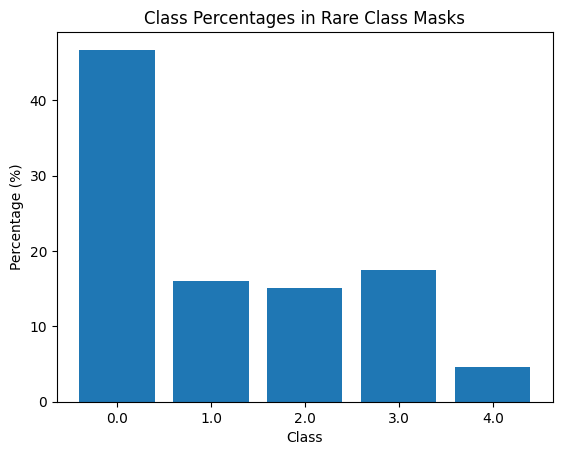

In [16]:
import numpy as np
import matplotlib.pyplot as plt



# Filter only the images with the rare class (class 4)
rare_class = 4
rare_class_indices = [i for i in range(len(y_train)) if rare_class in y_train[i]]
print("total number of images",len(rare_class_indices ),"out of",len(y_train),"images: percentage", 100*len(rare_class_indices )/len(y_train),"%")
# Extract images and masks containing the rare class
X_train_rare = X_train[rare_class_indices]
y_train_rare = y_train[rare_class_indices]

# Calculate the percentage of each class in the rare class masks
unique_classes, class_counts = np.unique(y_train_rare, return_counts=True)
total_pixels = np.sum(class_counts)
class_percentages = {cls: count / total_pixels * 100 for cls, count in zip(unique_classes, class_counts)}

# Print the percentages
print("Class Percentages in Rare Class Masks:")
for cls, pct in class_percentages.items():
    print(f"Class {cls}: {pct:.2f}%")

# Plot histogram of class percentages
plt.bar(class_percentages.keys(), class_percentages.values(), tick_label=list(class_percentages.keys()))
plt.xlabel("Class")
plt.ylabel("Percentage (%)")
plt.title("Class Percentages in Rare Class Masks")
plt.show()


Total images with rare class: 332
Minimum rare class percentage: 0.01%
Maximum rare class percentage: 33.34%
Average percentage in top 20% rare-class images: 14.59%


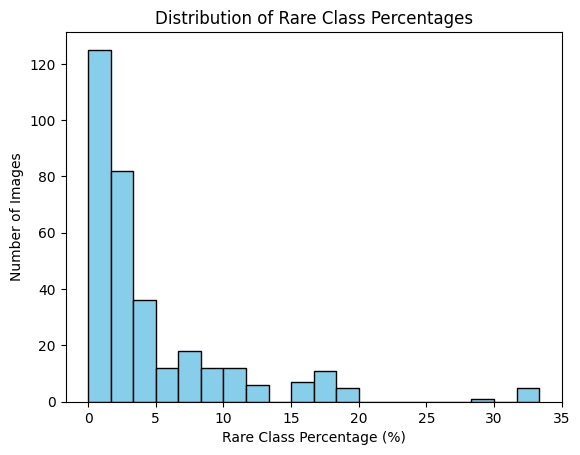

In [17]:
# Filter only the images with the rare class (class 4)
rare_class = 4
rare_class_indices = [i for i in range(len(y_train)) if rare_class in y_train[i]]

# Extract images and masks containing the rare class
X_train_rare = X_train[rare_class_indices]
y_train_rare = y_train[rare_class_indices]

# Calculate the percentage of the rare class in each mask
rare_class_percentages = [
    (np.sum(mask == rare_class) / mask.size) * 100 for mask in y_train_rare
]

# Identify images with the highest rare class percentages
sorted_indices = np.argsort(rare_class_percentages)[::-1]
top_20_percent_indices = sorted_indices[: len(sorted_indices) // 5]
top_20_percent_average = np.mean([rare_class_percentages[i] for i in top_20_percent_indices])

# Calculate min and max percentages
min_percentage = np.min(rare_class_percentages)
max_percentage = np.max(rare_class_percentages)

# Print results
print(f"Total images with rare class: {len(rare_class_indices)}")
print(f"Minimum rare class percentage: {min_percentage:.2f}%")
print(f"Maximum rare class percentage: {max_percentage:.2f}%")
print(f"Average percentage in top 20% rare-class images: {top_20_percent_average:.2f}%")

# Plot histogram of rare class percentages
plt.hist(rare_class_percentages, bins=20, color='skyblue', edgecolor='black')
plt.xlabel("Rare Class Percentage (%)")
plt.ylabel("Number of Images")
plt.title("Distribution of Rare Class Percentages")
plt.show()

Class Percentages in Rare Class Masks:
Class 0.0: 45.32%
Class 1.0: 2.83%
Class 2.0: 9.58%
Class 3.0: 32.46%
Class 4.0: 9.82%


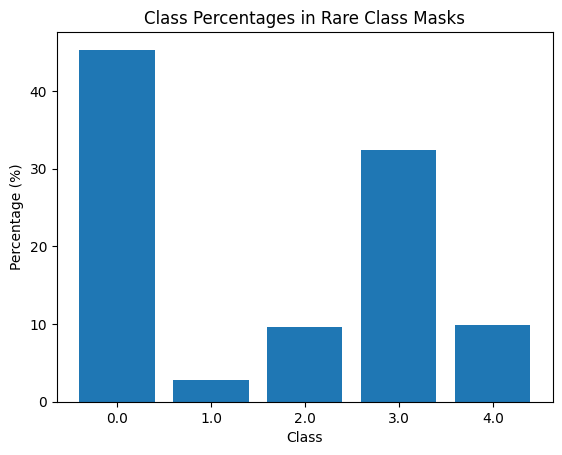

In [18]:
import numpy as np
import matplotlib.pyplot as plt


# Filter only the images with the rare class (class 4)
rare_class = 4
rare_class_indices = [i for i in range(len(y_val)) if rare_class in y_val[i]]

# Extract images and masks containing the rare class
X_val_rare = X_val[rare_class_indices]
y_val_rare = y_val[rare_class_indices]

# Calculate the percentage of each class in the rare class masks
unique_classes, class_counts = np.unique(y_val_rare, return_counts=True)
total_pixels = np.sum(class_counts)
class_percentages = {cls: count / total_pixels * 100 for cls, count in zip(unique_classes, class_counts)}

# Print the percentages
print("Class Percentages in Rare Class Masks:")
for cls, pct in class_percentages.items():
    print(f"Class {cls}: {pct:.2f}%")

# Plot histogram of class percentages
plt.bar(class_percentages.keys(), class_percentages.values(), tick_label=list(class_percentages.keys()))
plt.xlabel("Class")
plt.ylabel("Percentage (%)")
plt.title("Class Percentages in Rare Class Masks")
plt.show()


In [19]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np
X_train_top_20_percent=X_train[top_20_percent_indices]
y_train_top_20_percent=y_train[top_20_percent_indices]
print(len(X_train_top_20_percent))
# Augmentation settings
data_gen_args = dict(
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode="nearest"
)
datagen = ImageDataGenerator(**data_gen_args)

# Augment rare class training images
X_train_aug = []
y_train_aug = []
for x, y in zip(X_train_top_20_percent, y_train_top_20_percent):
    x = np.expand_dims(x, axis=-1) if x.ndim == 2 else x
    for _ in range(5):  # Create 5 augmented samples per image
        augmented = next(datagen.flow(x[np.newaxis, ...], batch_size=1))
        X_train_aug.append(augmented[0])
        y_train_aug.append(y)

X_train_aug = np.array(X_train_aug)
y_train_aug = np.array(y_train_aug)

print(f"Augmented Training Set: {X_train_aug.shape}, {y_train_aug.shape}")


66
Augmented Training Set: (330, 64, 128, 1), (330, 64, 128)


total number of images 7 out of 501 images: percentage 1.3972055888223553 %

Class Percentages in Rare Class Masks (Validation):
Class 0.0: 45.32%
Class 1.0: 2.83%
Class 2.0: 9.58%
Class 3.0: 32.46%
Class 4.0: 9.82%

Rare Class Statistics in Validation Images:
Mean Percentage: 9.82%
Min Percentage: 0.45%
Max Percentage: 26.61%


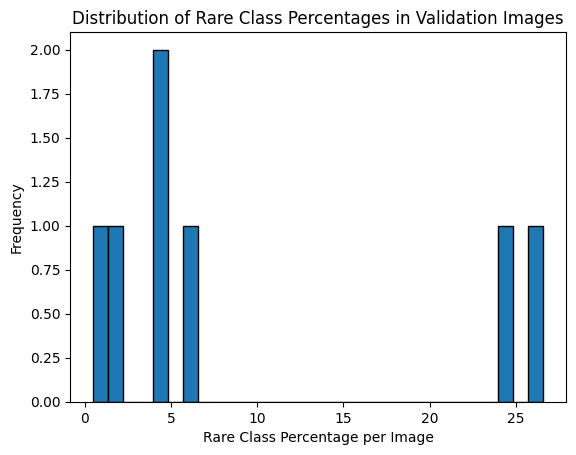

In [20]:
# Filter images with the rare class in the validation set
rare_class_value = 4  # Define the rare class value
rare_class_val_indices = [i for i in range(len(y_val)) if rare_class_value in y_val[i]]
print("total number of images",len(rare_class_val_indices ),"out of",len(y_val),"images: percentage", 100*len(rare_class_val_indices )/len(y_val),"%")
# Extract validation images and masks containing the rare class
X_val_rare = X_val[rare_class_val_indices]
y_val_rare = y_val[rare_class_val_indices]

# Calculate the percentage of each class in the rare class masks for validation
unique_classes_val, class_counts_val = np.unique(y_val_rare, return_counts=True)
total_pixels_val = np.sum(class_counts_val)
class_percentages_val = {cls: count / total_pixels_val * 100 for cls, count in zip(unique_classes_val, class_counts_val)}

# Print validation class percentages
print("\nClass Percentages in Rare Class Masks (Validation):")
for cls, pct in class_percentages_val.items():
    print(f"Class {cls}: {pct:.2f}%")

# Calculate rare class percentage per validation image
rare_class_percentages_per_image_val = [
    (np.sum(y == rare_class_value) / y.size) * 100 for y in y_val_rare
]

# Statistics on rare class percentages in validation images
mean_rare_class_val = np.mean(rare_class_percentages_per_image_val)
min_rare_class_val = np.min(rare_class_percentages_per_image_val)
max_rare_class_val = np.max(rare_class_percentages_per_image_val)

print(f"\nRare Class Statistics in Validation Images:")
print(f"Mean Percentage: {mean_rare_class_val:.2f}%")
print(f"Min Percentage: {min_rare_class_val:.2f}%")
print(f"Max Percentage: {max_rare_class_val:.2f}%")

# Sort validation images by rare class pixel count
sorted_indices_val = np.argsort(rare_class_percentages_per_image_val)[::-1]
X_val_top_20_percent = X_val_rare[sorted_indices_val[:2]]
y_val_top_20_percent = y_val_rare[sorted_indices_val[:2]]

# Plot histogram for validation rare class percentages
plt.hist(rare_class_percentages_per_image_val, bins=30, edgecolor="black")
plt.xlabel("Rare Class Percentage per Image")
plt.ylabel("Frequency")
plt.title("Distribution of Rare Class Percentages in Validation Images")
plt.show()

## Normalization


In [21]:
# Add color channel and rescale pixels between 0 and 1
X_train = X_train[..., np.newaxis] / 255.0
X_test = X_test[..., np.newaxis] / 255.0

input_shape = X_train.shape[1:]
num_classes = len(np.unique(y_train))

print(f"Input shape: {input_shape}")
print(f"Number of classes: {num_classes}")

Input shape: (64, 128, 1)
Number of classes: 5


In [22]:
X_val = X_val[..., np.newaxis] / 255.0

In [23]:
print(f"X_train shape: {X_train.shape}")
print(f"X_val shape: {X_val.shape}")
print(f"y_train shape: {y_train.shape}")

X_train shape: (10050, 64, 128, 1)
X_val shape: (501, 64, 128, 1)
y_train shape: (10050, 64, 128)


In [24]:
# Custom callback for visualization
class VisualizeSegmentationCallback(tf.keras.callbacks.Callback):
    def __init__(self, X_train, y_train, num_images=2):
        super().__init__()
        self.X_train = X_train
        self.y_train = y_train
        self.num_images = num_images
        self.selected_indices = []

        # Identify images containing at least 4 classes
        for i in range(len(y_train)):
            if len(np.unique(y_train[i])) >= 4:  # Check for at least 4 classes
                self.selected_indices.append(i)
            if len(self.selected_indices) == num_images:
                break

    def on_epoch_end(self, epoch, logs=None):
        # Plot predictions for the selected images
        fig, axes = plt.subplots(self.num_images, 3, figsize=(15, self.num_images * 5))

        for idx, i in enumerate(self.selected_indices):
            # Extract image and ground truth
            X_sample = self.X_train[i:i + 1]  # Add batch dimension
            y_sample = self.y_train[i]

            # Predict on the image
            predicted_mask = self.model.predict(X_sample)
            predicted_mask = np.argmax(predicted_mask, axis=-1)[0]  # Convert to class labels

            # Visualize the input, ground truth, and predicted mask
            axes[idx, 0].imshow(X_sample[0].squeeze(), cmap="gray")
            axes[idx, 0].set_title("Input Image")
            axes[idx, 0].axis("off")

            axes[idx, 1].imshow(y_sample, cmap="viridis",vmin=0,vmax=4)
            axes[idx, 1].set_title("Ground Truth Mask")
            axes[idx, 1].axis("off")

            axes[idx, 2].imshow(predicted_mask, cmap="viridis",vmin=0,vmax=4)
            axes[idx, 2].set_title(f"Predicted Mask (Epoch {epoch + 1})")
            axes[idx, 2].axis("off")

        plt.tight_layout()
        plt.show()

## Adding advanced tecnics

In [25]:
# Ensure the input shape for both images and masks is correct
X_train = np.squeeze(X_train)  # Remove any singleton dimensions
y_train = np.squeeze(y_train)  # Remove any singleton dimensions

# Check if the channel dimension exists, otherwise add it
if X_train.ndim == 3:  # If missing the channel dimension, add it
    X_train = X_train[..., np.newaxis]

if y_train.ndim == 3:  # Ensure y_train has the correct shape
    y_train = y_train[..., np.newaxis]

print(f"Shape of X_train after reshaping: {X_train.shape}")
print(f"Shape of y_train after reshaping: {y_train.shape}")

Shape of X_train after reshaping: (10050, 64, 128, 1)
Shape of y_train after reshaping: (10050, 64, 128, 1)


In [26]:
# Ensure the input shape for both images and masks is correct
X_val = np.squeeze(X_val)  # Remove any singleton dimensions
y_val= np.squeeze(y_val)  # Remove any singleton dimensions

# Check if the channel dimension exists, otherwise add it
if X_val.ndim == 3:  # If missing the channel dimension, add it
    X_val = X_val[..., np.newaxis]

if y_val.ndim == 3:  # Ensure y_train has the correct shape
    y_val = y_val[..., np.newaxis]

print(f"Shape of X_train after reshaping: {X_val.shape}")
print(f"Shape of y_train after reshaping: {y_val.shape}")

Shape of X_train after reshaping: (501, 64, 128, 1)
Shape of y_train after reshaping: (501, 64, 128, 1)


In [27]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

# Ensure the input shape for both images and masks is correct
X_train = np.squeeze(X_train)  # Remove singleton dimensions
if X_train.ndim == 3:  # If missing the channel dimension, add it
    X_train = X_train[..., np.newaxis]

y_train = np.squeeze(y_train)  # Ensure that y_train has the correct shape

print(f"Shape of X_train after reshaping: {X_train.shape}")
print(f"Shape of y_train after reshaping: {y_train.shape}")

# Convert y_train to integers for class count
y_train_int = y_train.astype(np.int32)

# Calculate class weights based on pixel proportions
class_pixel_counts = np.bincount(y_train_int.flatten(), minlength=num_classes)  # Count pixels for each class
total_pixels = np.sum(class_pixel_counts)  # Total number of pixels
class_weights = total_pixels / (class_pixel_counts + 1e-6)  # Inverse frequency
class_weights /= np.sum(class_weights)  # Normalize to sum to 1

print(f"Class pixel counts: {class_pixel_counts}")
print(f"Calculated class weights: {class_weights}")

# Updated EarlyStopping with min_delta to ignore minimal improvements
early_stopping = EarlyStopping(
    monitor="val_loss",  # Monitor loss instead of validation loss
    patience=30,
    restore_best_weights=True,
    min_delta=1e-4  # Minimum change to qualify as an improvement
)


model_checkpoint = ModelCheckpoint(
    filepath="best_model.keras",
    monitor="val_loss",  # Monitor loss instead of validation loss
    save_best_only=True,
    mode="min",
    verbose=1
)

reduce_lr = ReduceLROnPlateau(
    monitor="val_loss",  # Monitor loss instead of validation loss
    factor=0.5,
    patience=5,
    verbose=1,
    mode="min",
    min_lr=1e-6
)

# Visualization Callback for Two Images with At Least 4 Classes
visualize_callback = VisualizeSegmentationCallback(X_val, y_val, num_images=2)




Shape of X_train after reshaping: (10050, 64, 128, 1)
Shape of y_train after reshaping: (10050, 64, 128)
Class pixel counts: [24606700 23868330 19788581 13940538   125451]
Calculated class weights: [0.00497054 0.0051243  0.00618076 0.00877359 0.97495081]


In [28]:
# Define custom Mean Intersection Over Union metric
class MeanIntersectionOverUnion(tf.keras.metrics.MeanIoU):
    def __init__(self, num_classes, labels_to_exclude=None, name="mean_iou", dtype=None):
        super(MeanIntersectionOverUnion, self).__init__(num_classes=num_classes, name=name, dtype=dtype)
        if labels_to_exclude is None:
            labels_to_exclude = [0]  # Default to excluding label 0
        self.labels_to_exclude = labels_to_exclude

    def update_state(self, y_true, y_pred, sample_weight=None):
        # Convert predictions to class labels
        y_pred = tf.math.argmax(y_pred, axis=-1)

        # Flatten the tensors
        y_true = tf.reshape(y_true, [-1])
        y_pred = tf.reshape(y_pred, [-1])

        # Apply mask to exclude specified labels
        for label in self.labels_to_exclude:
            mask = tf.not_equal(y_true, label)
            y_true = tf.boolean_mask(y_true, mask)
            y_pred = tf.boolean_mask(y_pred, mask)

        # Update the state
        return super().update_state(y_true, y_pred, sample_weight)

In [29]:
from tensorflow.keras.callbacks import Callback
class SaveBestMeanIoU(Callback):
    def __init__(self, filepath, monitor="val_mean_io_u", mode="max", verbose=1):
        super(SaveBestMeanIoU, self).__init__()
        self.filepath = filepath
        self.monitor = monitor
        self.mode = mode
        self.verbose = verbose
        self.best = -float("inf") if mode == "max" else float("inf")

    def on_epoch_end(self, epoch, logs=None):
        logs = logs or {}
        # Debug: Print available keys in logs
        print(f"Available log keys: {logs.keys()}")
        
        # Use the correct log key
        current = logs.get(self.monitor)
        if current is None:
            if self.verbose > 0:
                print(f"Warning: Monitor '{self.monitor}' is not available in logs.")
            return

        if (self.mode == "max" and current > self.best) or (self.mode == "min" and current < self.best):
            self.best = current
            if self.verbose > 0:
                print(f"Epoch {epoch + 1}: {self.monitor} improved to {current:.4f}, saving model.")
            self.model.save(self.filepath)


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 64, 128,   │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 64, 128,   │        640 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalization │ (None, 64, 128,   │        128 │ conv2d[0][0]      │
│ (LayerNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 64, 128,   │          0 │ layer_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 64, 128,   │     36,928 │ activation[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 64, 128,   │        128 │ conv2d_1[0][0]    │
│ (LayerNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 64, 128,   │          0 │ layer_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 64, 128,   │        128 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 64, 128,   │          0 │ activation_1[0][… │
│                     │ 64)               │            │ conv2d_2[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 32, 64,    │          0 │ add[0][0]         │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 32, 64,    │     73,856 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 32, 64,    │        256 │ conv2d_3[0][0]    │
│ (LayerNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 32, 64,    │          0 │ layer_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 32, 64,    │    147,584 │ activation_2[0][… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 32, 64,    │        256 │ conv2d_4[0][0]    │
│ (LayerNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 32, 64,    │          0 │ layer_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 32, 64,    │      8,320 │ max_pooling2d[0]

 Total params: 7,359,941 (28.08 MB)

 Trainable params: 7,359,941 (28.08 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/1000


I0000 00:00:1733874516.435393      94 service.cc:145] XLA service 0x7ec330002d50 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733874516.435452      94 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1733874516.435458      94 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1733874539.287153      94 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


315/315 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step - accuracy: 0.3385 - loss: 0.8507 - mean_iou: 0.1389Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])
Epoch 1: val_mean_iou improved to 0.2604, saving model.

Epoch 1: val_loss improved from inf to 0.81252, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


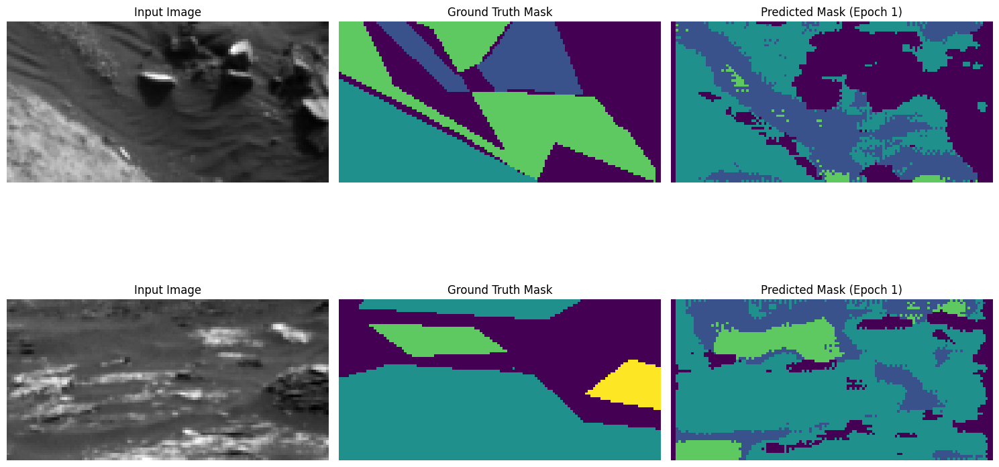

315/315 ━━━━━━━━━━━━━━━━━━━━ 117s 266ms/step - accuracy: 0.3386 - loss: 0.8506 - mean_iou: 0.1390 - val_accuracy: 0.4976 - val_loss: 0.8125 - val_mean_iou: 0.2604 - learning_rate: 1.0000e-04
Epoch 2/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step - accuracy: 0.4766 - loss: 0.8058 - mean_iou: 0.2449Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])
Epoch 2: val_mean_iou improved to 0.3102, saving model.

Epoch 2: val_loss improved from 0.81252 to 0.78924, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


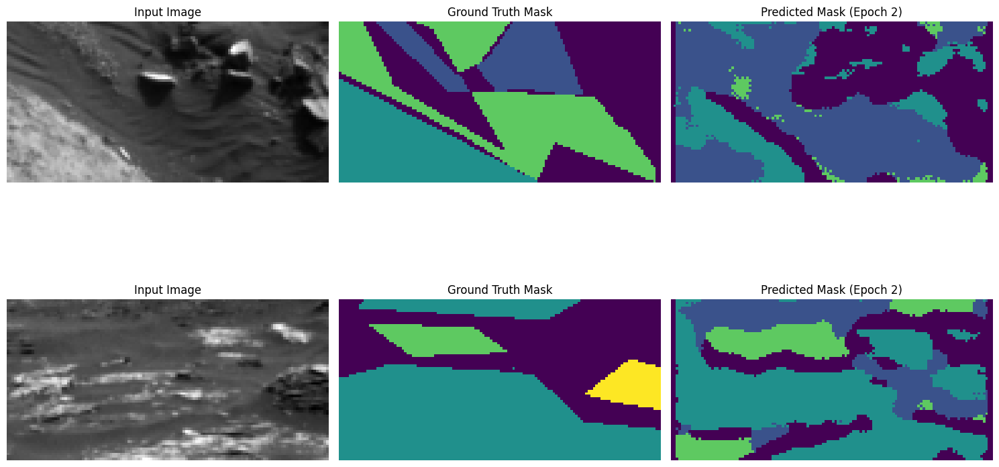

315/315 ━━━━━━━━━━━━━━━━━━━━ 65s 205ms/step - accuracy: 0.4767 - loss: 0.8058 - mean_iou: 0.2450 - val_accuracy: 0.5894 - val_loss: 0.7892 - val_mean_iou: 0.3102 - learning_rate: 1.0000e-04
Epoch 3/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step - accuracy: 0.5373 - loss: 0.7840 - mean_iou: 0.2850Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])
Epoch 3: val_mean_iou improved to 0.3500, saving model.

Epoch 3: val_loss improved from 0.78924 to 0.77394, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


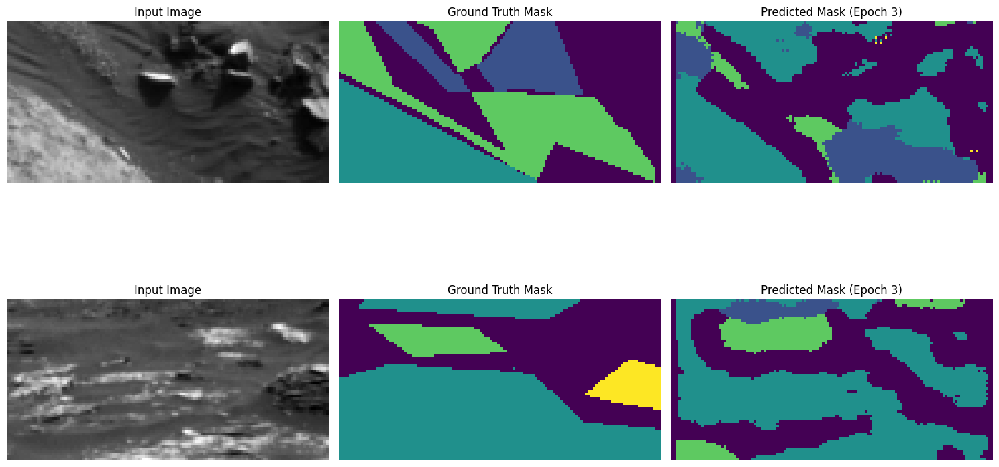

315/315 ━━━━━━━━━━━━━━━━━━━━ 71s 225ms/step - accuracy: 0.5373 - loss: 0.7840 - mean_iou: 0.2851 - val_accuracy: 0.6367 - val_loss: 0.7739 - val_mean_iou: 0.3500 - learning_rate: 1.0000e-04
Epoch 4/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step - accuracy: 0.5696 - loss: 0.7731 - mean_iou: 0.3076Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])
Epoch 4: val_mean_iou improved to 0.3566, saving model.

Epoch 4: val_loss improved from 0.77394 to 0.77306, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


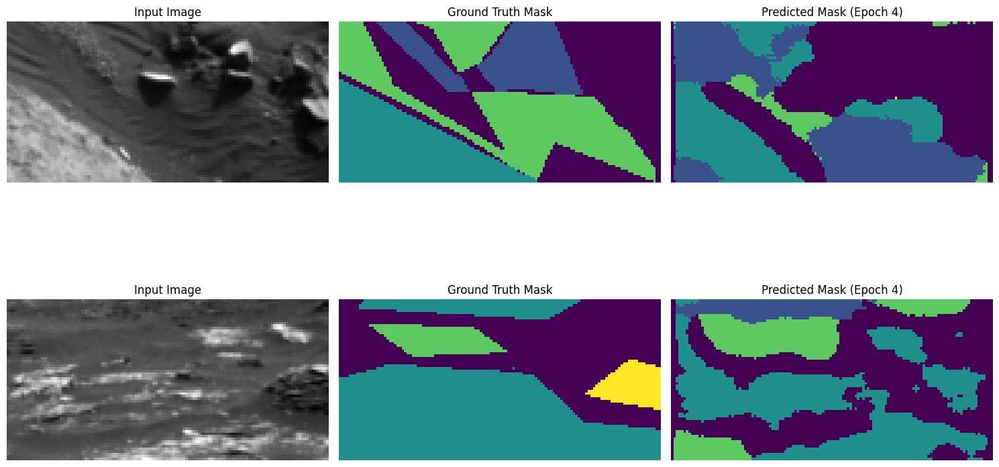

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 223ms/step - accuracy: 0.5696 - loss: 0.7731 - mean_iou: 0.3077 - val_accuracy: 0.6490 - val_loss: 0.7731 - val_mean_iou: 0.3566 - learning_rate: 1.0000e-04
Epoch 5/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - accuracy: 0.5979 - loss: 0.7632 - mean_iou: 0.3302Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])
Epoch 5: val_mean_iou improved to 0.3604, saving model.

Epoch 5: val_loss improved from 0.77306 to 0.77116, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


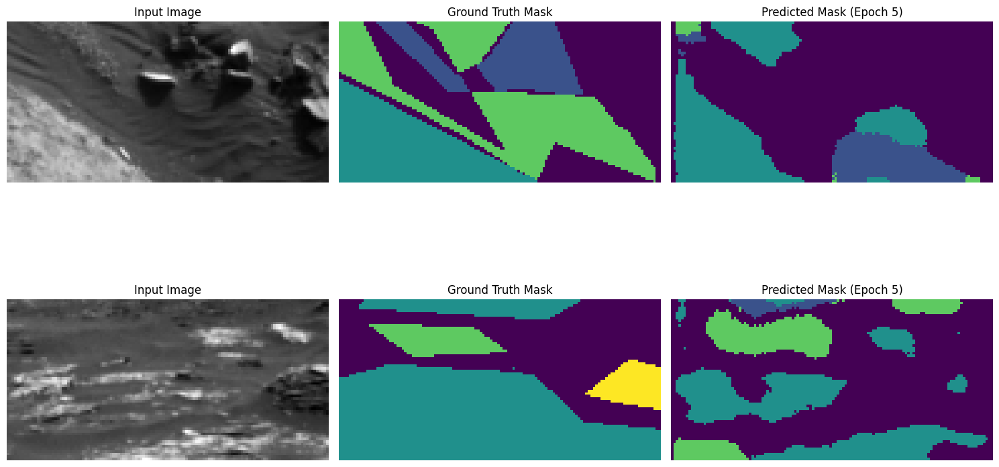

315/315 ━━━━━━━━━━━━━━━━━━━━ 71s 224ms/step - accuracy: 0.5979 - loss: 0.7632 - mean_iou: 0.3303 - val_accuracy: 0.6603 - val_loss: 0.7712 - val_mean_iou: 0.3604 - learning_rate: 1.0000e-04
Epoch 6/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step - accuracy: 0.6138 - loss: 0.7576 - mean_iou: 0.3435Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])
Epoch 6: val_mean_iou improved to 0.3636, saving model.

Epoch 6: val_loss improved from 0.77116 to 0.76949, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


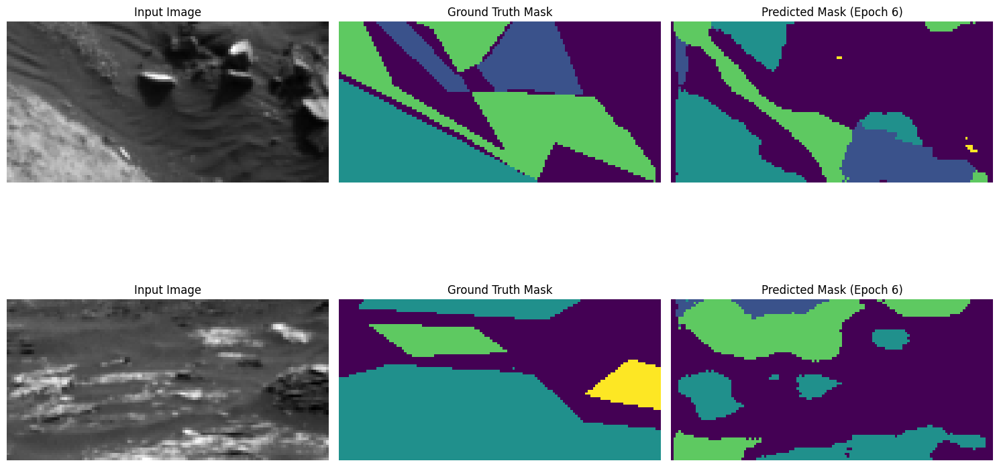

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 223ms/step - accuracy: 0.6138 - loss: 0.7576 - mean_iou: 0.3435 - val_accuracy: 0.6615 - val_loss: 0.7695 - val_mean_iou: 0.3636 - learning_rate: 1.0000e-04
Epoch 7/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step - accuracy: 0.6271 - loss: 0.7527 - mean_iou: 0.3554Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])
Epoch 7: val_mean_iou improved to 0.3869, saving model.

Epoch 7: val_loss improved from 0.76949 to 0.76253, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


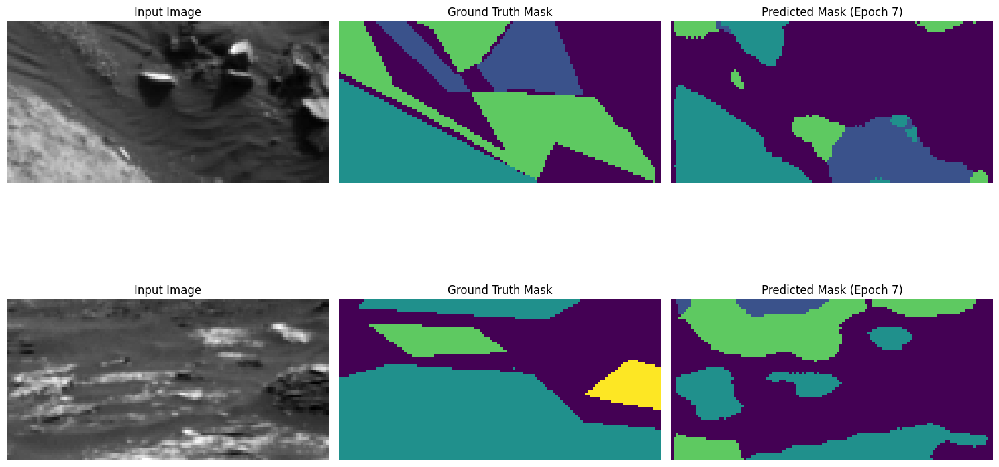

315/315 ━━━━━━━━━━━━━━━━━━━━ 71s 225ms/step - accuracy: 0.6271 - loss: 0.7527 - mean_iou: 0.3554 - val_accuracy: 0.6829 - val_loss: 0.7625 - val_mean_iou: 0.3869 - learning_rate: 1.0000e-04
Epoch 8/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - accuracy: 0.6405 - loss: 0.7478 - mean_iou: 0.3691Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 8: val_loss did not improve from 0.76253
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


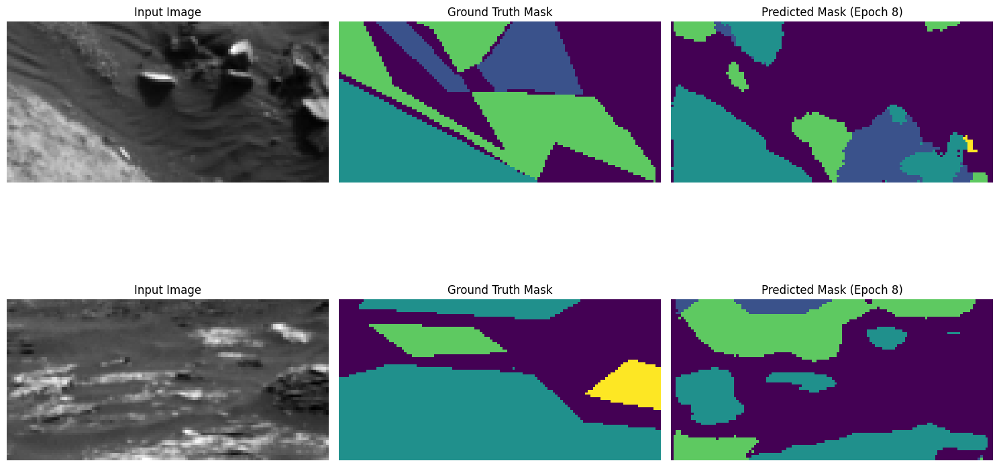

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 221ms/step - accuracy: 0.6406 - loss: 0.7478 - mean_iou: 0.3691 - val_accuracy: 0.6707 - val_loss: 0.7659 - val_mean_iou: 0.3723 - learning_rate: 1.0000e-04
Epoch 9/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - accuracy: 0.6401 - loss: 0.7473 - mean_iou: 0.3674Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 9: val_loss did not improve from 0.76253
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


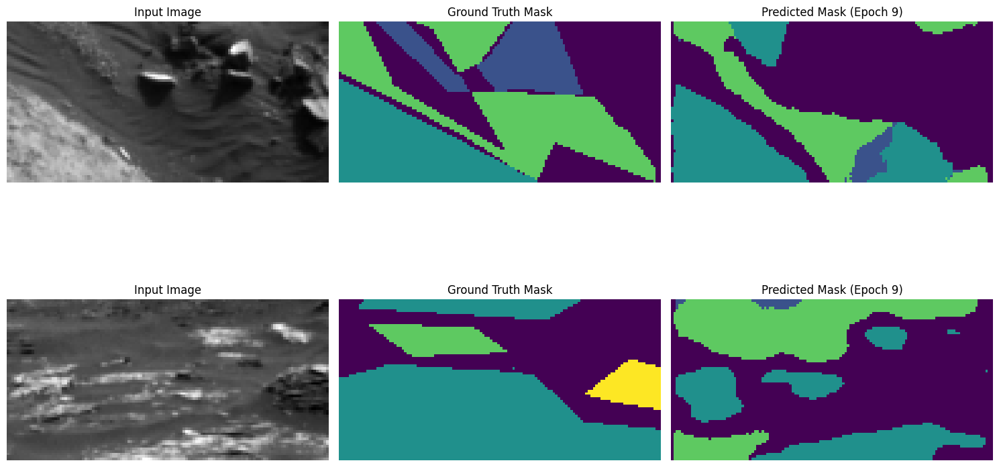

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 221ms/step - accuracy: 0.6401 - loss: 0.7473 - mean_iou: 0.3675 - val_accuracy: 0.6710 - val_loss: 0.7641 - val_mean_iou: 0.3769 - learning_rate: 1.0000e-04
Epoch 10/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step - accuracy: 0.6427 - loss: 0.7467 - mean_iou: 0.3731Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])
Epoch 10: val_mean_iou improved to 0.4036, saving model.

Epoch 10: val_loss improved from 0.76253 to 0.75651, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


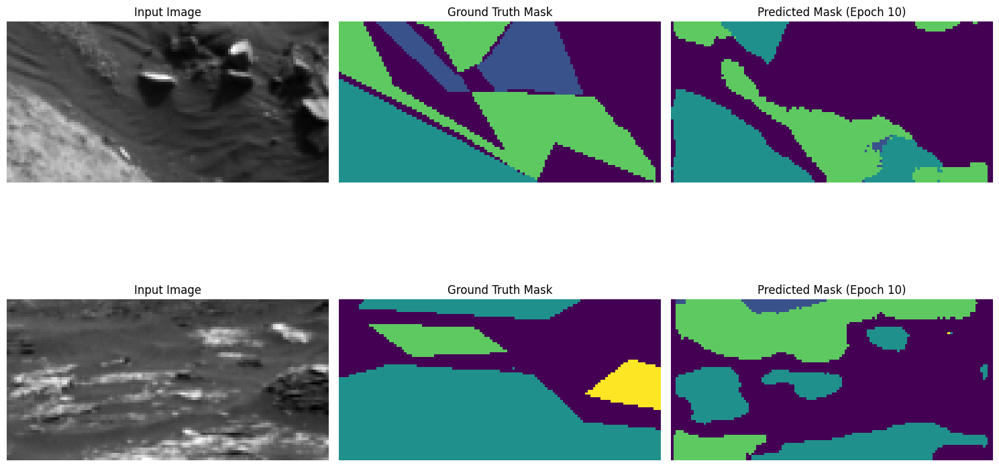

315/315 ━━━━━━━━━━━━━━━━━━━━ 71s 226ms/step - accuracy: 0.6427 - loss: 0.7467 - mean_iou: 0.3732 - val_accuracy: 0.6986 - val_loss: 0.7565 - val_mean_iou: 0.4036 - learning_rate: 1.0000e-04
Epoch 11/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step - accuracy: 0.6602 - loss: 0.7396 - mean_iou: 0.3866Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 11: val_loss did not improve from 0.75651
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


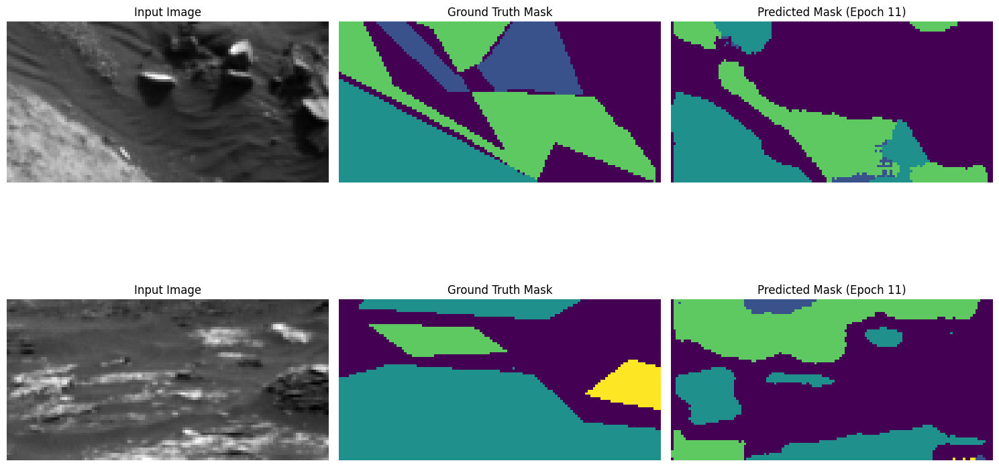

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 222ms/step - accuracy: 0.6602 - loss: 0.7396 - mean_iou: 0.3866 - val_accuracy: 0.6971 - val_loss: 0.7585 - val_mean_iou: 0.3966 - learning_rate: 1.0000e-04
Epoch 12/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - accuracy: 0.6669 - loss: 0.7362 - mean_iou: 0.3942Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])
Epoch 12: val_mean_iou improved to 0.4060, saving model.

Epoch 12: val_loss did not improve from 0.75651
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


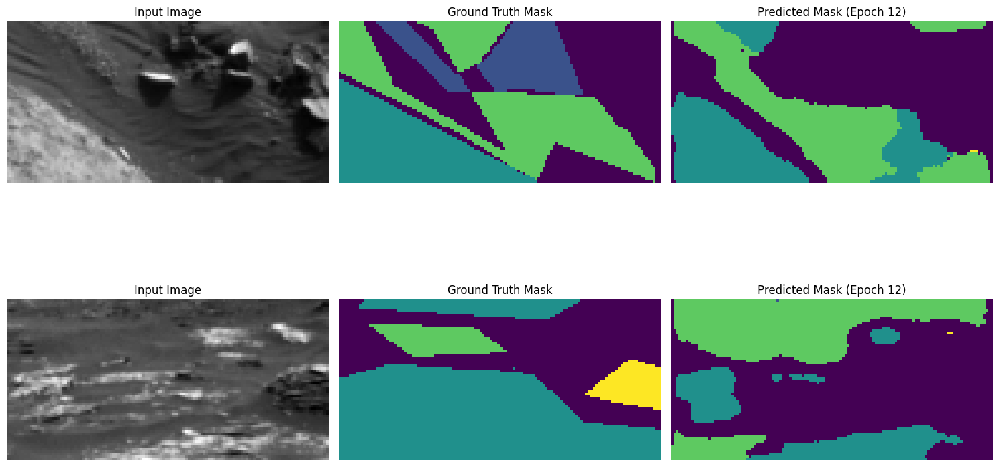

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 222ms/step - accuracy: 0.6669 - loss: 0.7361 - mean_iou: 0.3943 - val_accuracy: 0.6966 - val_loss: 0.7593 - val_mean_iou: 0.4060 - learning_rate: 1.0000e-04
Epoch 13/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step - accuracy: 0.6733 - loss: 0.7334 - mean_iou: 0.4000Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])
Epoch 13: val_mean_iou improved to 0.4293, saving model.

Epoch 13: val_loss improved from 0.75651 to 0.74908, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


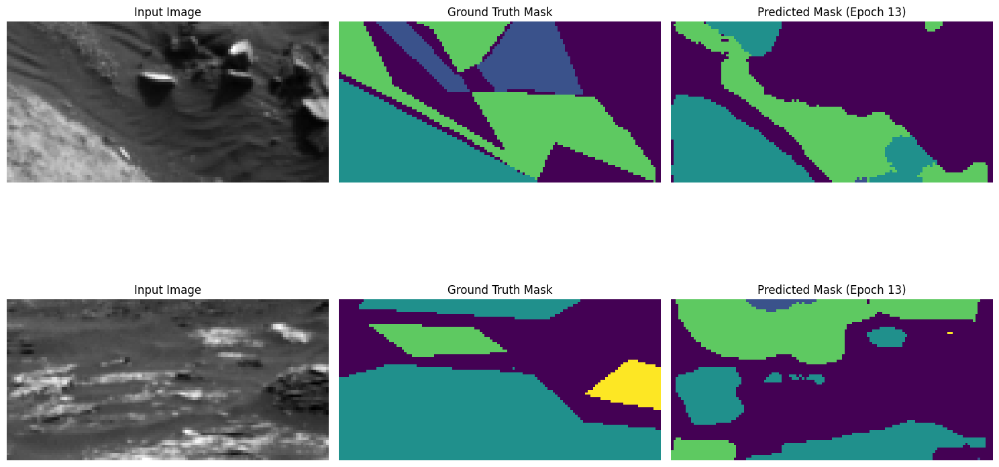

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 223ms/step - accuracy: 0.6734 - loss: 0.7334 - mean_iou: 0.4000 - val_accuracy: 0.7198 - val_loss: 0.7491 - val_mean_iou: 0.4293 - learning_rate: 1.0000e-04
Epoch 14/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - accuracy: 0.6826 - loss: 0.7293 - mean_iou: 0.4105Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])
Epoch 14: val_mean_iou improved to 0.4305, saving model.

Epoch 14: val_loss did not improve from 0.74908
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


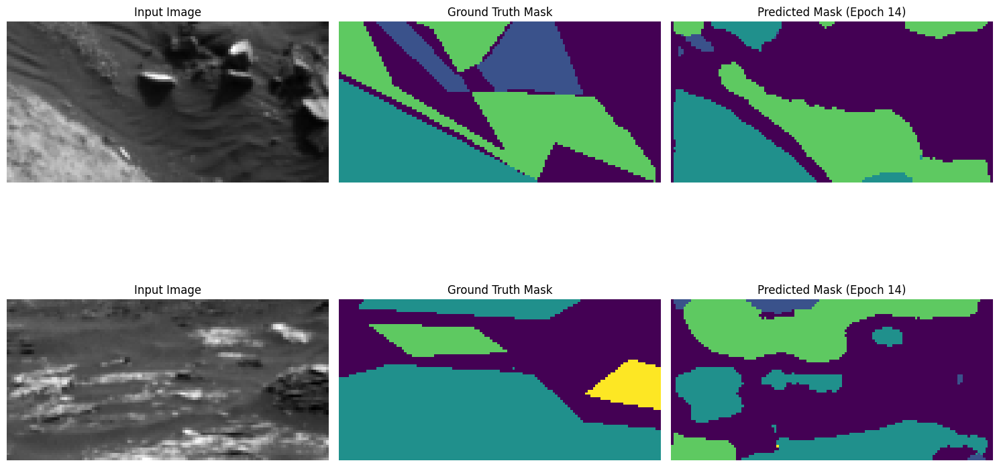

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 222ms/step - accuracy: 0.6826 - loss: 0.7292 - mean_iou: 0.4105 - val_accuracy: 0.7144 - val_loss: 0.7505 - val_mean_iou: 0.4305 - learning_rate: 1.0000e-04
Epoch 15/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step - accuracy: 0.6876 - loss: 0.7269 - mean_iou: 0.4186Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])
Epoch 15: val_mean_iou improved to 0.4380, saving model.

Epoch 15: val_loss did not improve from 0.74908
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


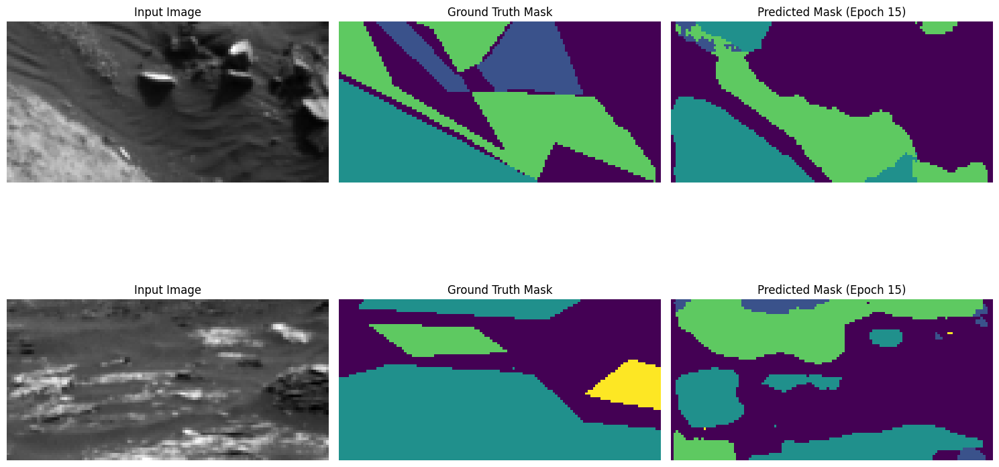

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 221ms/step - accuracy: 0.6876 - loss: 0.7268 - mean_iou: 0.4186 - val_accuracy: 0.7223 - val_loss: 0.7491 - val_mean_iou: 0.4380 - learning_rate: 1.0000e-04
Epoch 16/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - accuracy: 0.6969 - loss: 0.7229 - mean_iou: 0.4310Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 16: val_loss did not improve from 0.74908
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


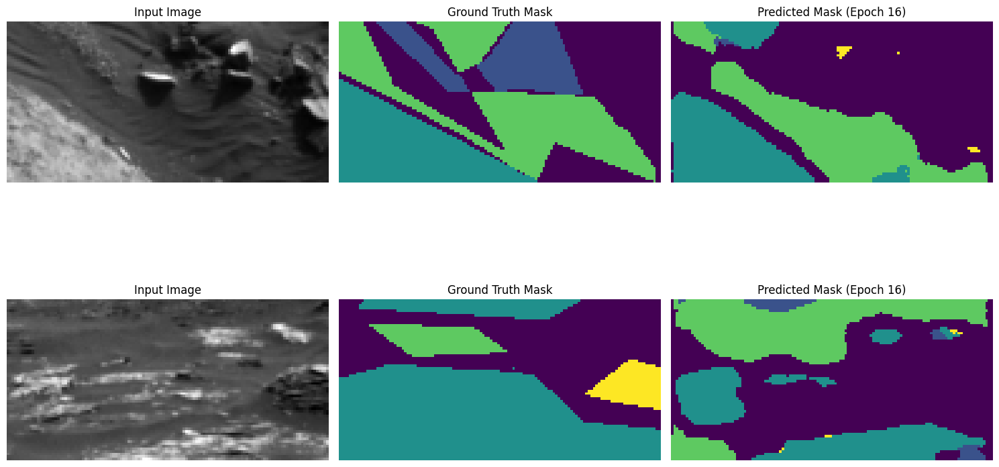

315/315 ━━━━━━━━━━━━━━━━━━━━ 69s 221ms/step - accuracy: 0.6969 - loss: 0.7228 - mean_iou: 0.4310 - val_accuracy: 0.7179 - val_loss: 0.7507 - val_mean_iou: 0.4345 - learning_rate: 1.0000e-04
Epoch 17/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step - accuracy: 0.7008 - loss: 0.7200 - mean_iou: 0.4365Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 17: val_loss improved from 0.74908 to 0.74674, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


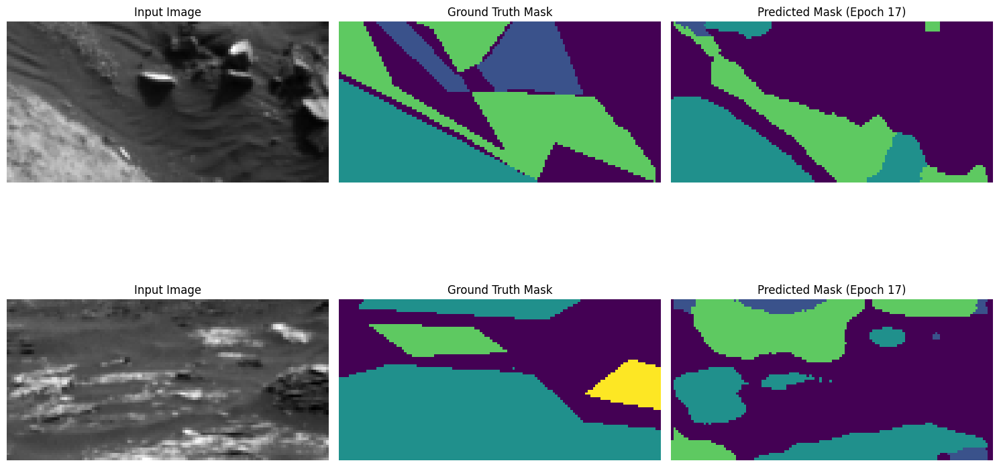

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 223ms/step - accuracy: 0.7008 - loss: 0.7200 - mean_iou: 0.4364 - val_accuracy: 0.7306 - val_loss: 0.7467 - val_mean_iou: 0.4375 - learning_rate: 1.0000e-04
Epoch 18/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - accuracy: 0.7048 - loss: 0.7166 - mean_iou: 0.4419Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 18: val_loss did not improve from 0.74674
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


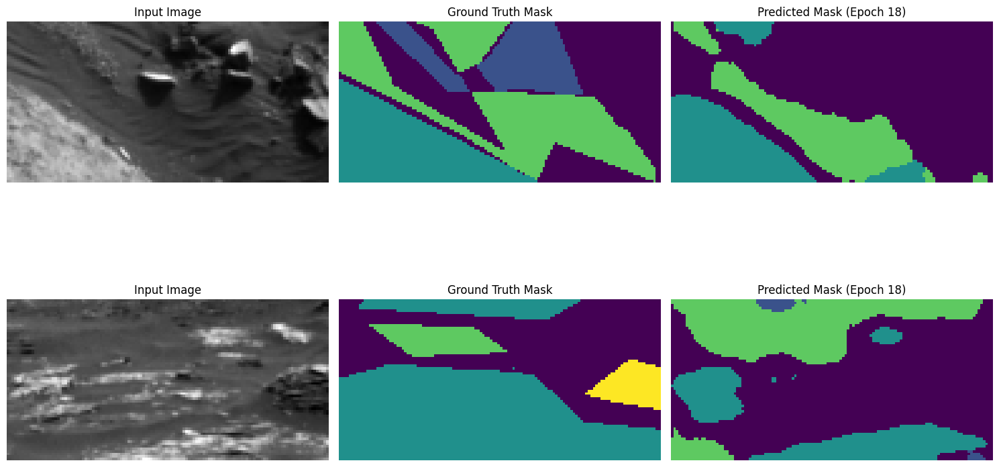

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 221ms/step - accuracy: 0.7048 - loss: 0.7166 - mean_iou: 0.4419 - val_accuracy: 0.7179 - val_loss: 0.7518 - val_mean_iou: 0.4298 - learning_rate: 1.0000e-04
Epoch 19/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - accuracy: 0.7123 - loss: 0.7134 - mean_iou: 0.4513Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])
Epoch 19: val_mean_iou improved to 0.4382, saving model.

Epoch 19: val_loss did not improve from 0.74674
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


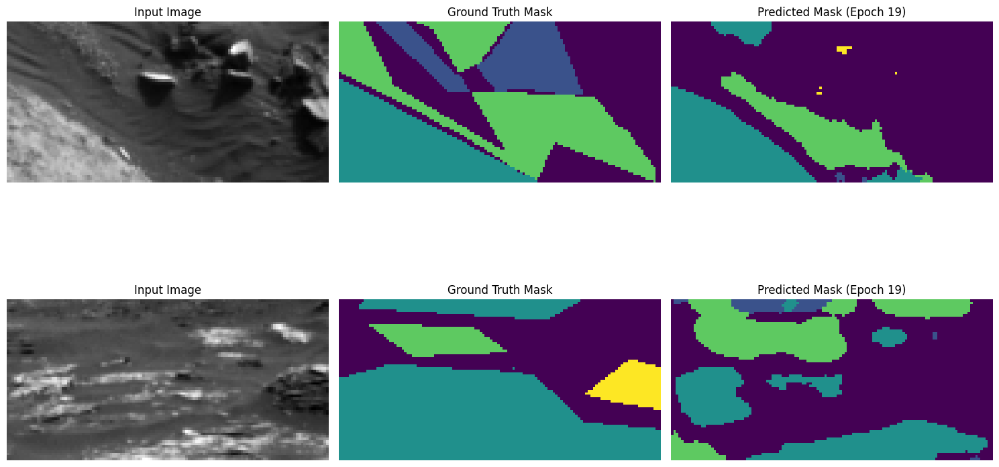

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 222ms/step - accuracy: 0.7123 - loss: 0.7133 - mean_iou: 0.4513 - val_accuracy: 0.7276 - val_loss: 0.7495 - val_mean_iou: 0.4382 - learning_rate: 1.0000e-04
Epoch 20/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step - accuracy: 0.7148 - loss: 0.7113 - mean_iou: 0.4601Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 20: val_loss did not improve from 0.74674
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


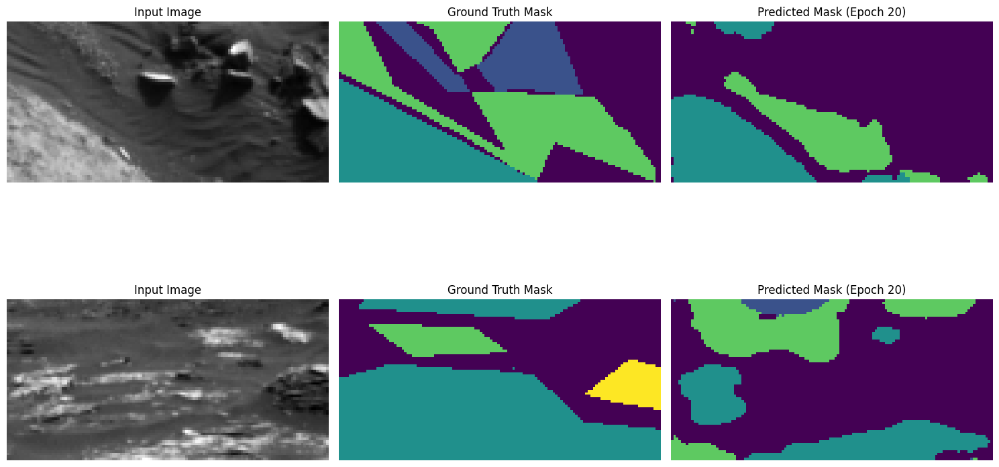

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 221ms/step - accuracy: 0.7149 - loss: 0.7113 - mean_iou: 0.4601 - val_accuracy: 0.7306 - val_loss: 0.7510 - val_mean_iou: 0.4262 - learning_rate: 1.0000e-04
Epoch 21/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - accuracy: 0.7158 - loss: 0.7114 - mean_iou: 0.4547Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 21: val_loss did not improve from 0.74674
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


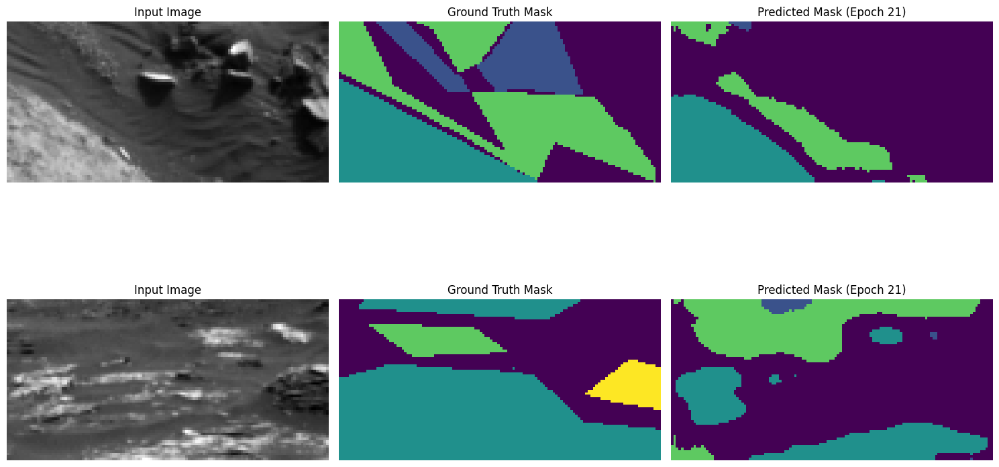

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 221ms/step - accuracy: 0.7158 - loss: 0.7114 - mean_iou: 0.4547 - val_accuracy: 0.7094 - val_loss: 0.7579 - val_mean_iou: 0.4052 - learning_rate: 1.0000e-04
Epoch 22/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step - accuracy: 0.7205 - loss: 0.7079 - mean_iou: 0.4645Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])
Epoch 22: val_mean_iou improved to 0.4384, saving model.

Epoch 22: val_loss did not improve from 0.74674

Epoch 22: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


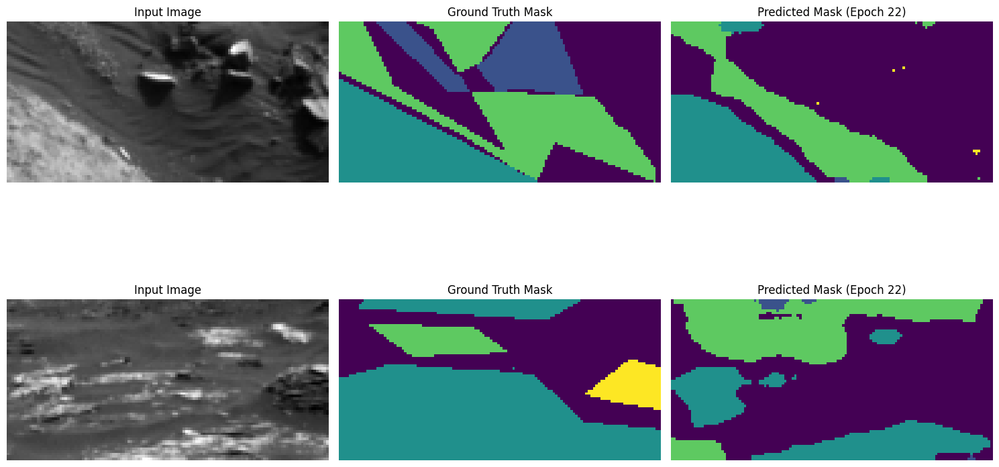

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 223ms/step - accuracy: 0.7206 - loss: 0.7078 - mean_iou: 0.4645 - val_accuracy: 0.7297 - val_loss: 0.7492 - val_mean_iou: 0.4384 - learning_rate: 1.0000e-04
Epoch 23/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step - accuracy: 0.7381 - loss: 0.6991 - mean_iou: 0.4861Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])
Epoch 23: val_mean_iou improved to 0.4477, saving model.

Epoch 23: val_loss improved from 0.74674 to 0.74160, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


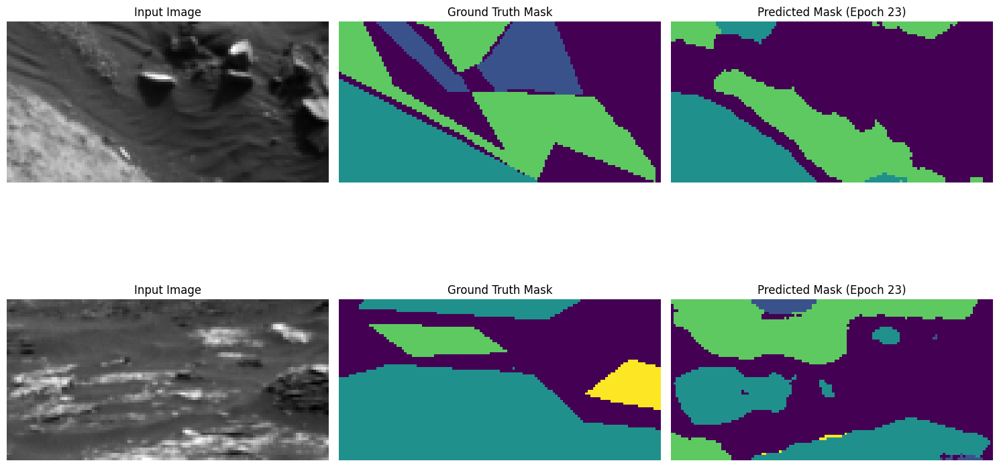

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 223ms/step - accuracy: 0.7382 - loss: 0.6991 - mean_iou: 0.4861 - val_accuracy: 0.7422 - val_loss: 0.7416 - val_mean_iou: 0.4477 - learning_rate: 5.0000e-05
Epoch 24/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - accuracy: 0.7462 - loss: 0.6946 - mean_iou: 0.4981Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])
Epoch 24: val_mean_iou improved to 0.4482, saving model.

Epoch 24: val_loss improved from 0.74160 to 0.74074, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


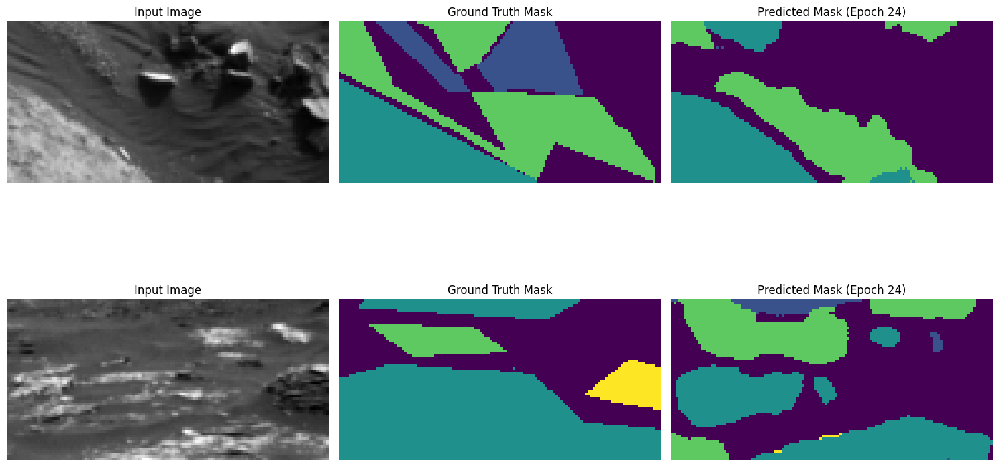

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 224ms/step - accuracy: 0.7462 - loss: 0.6946 - mean_iou: 0.4981 - val_accuracy: 0.7447 - val_loss: 0.7407 - val_mean_iou: 0.4482 - learning_rate: 5.0000e-05
Epoch 25/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - accuracy: 0.7532 - loss: 0.6903 - mean_iou: 0.5091Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])
Epoch 25: val_mean_iou improved to 0.4566, saving model.

Epoch 25: val_loss improved from 0.74074 to 0.73985, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


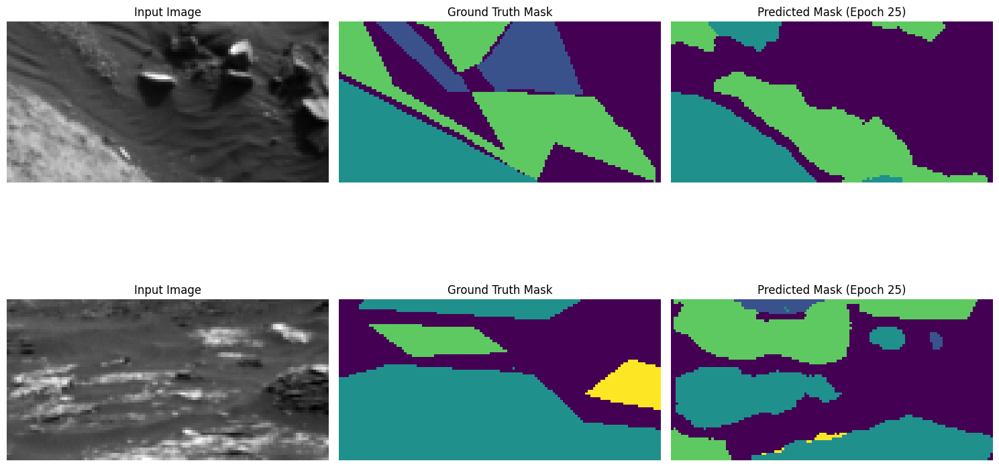

315/315 ━━━━━━━━━━━━━━━━━━━━ 71s 225ms/step - accuracy: 0.7532 - loss: 0.6903 - mean_iou: 0.5091 - val_accuracy: 0.7498 - val_loss: 0.7398 - val_mean_iou: 0.4566 - learning_rate: 5.0000e-05
Epoch 26/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step - accuracy: 0.7566 - loss: 0.6871 - mean_iou: 0.5138Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 26: val_loss did not improve from 0.73985
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


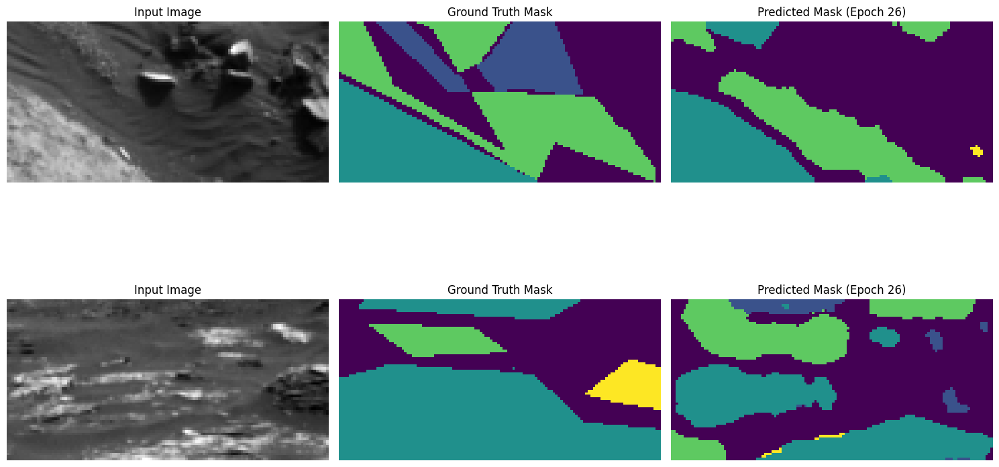

315/315 ━━━━━━━━━━━━━━━━━━━━ 69s 219ms/step - accuracy: 0.7567 - loss: 0.6871 - mean_iou: 0.5138 - val_accuracy: 0.7472 - val_loss: 0.7407 - val_mean_iou: 0.4523 - learning_rate: 5.0000e-05
Epoch 27/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step - accuracy: 0.7589 - loss: 0.6854 - mean_iou: 0.5187Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 27: val_loss did not improve from 0.73985
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


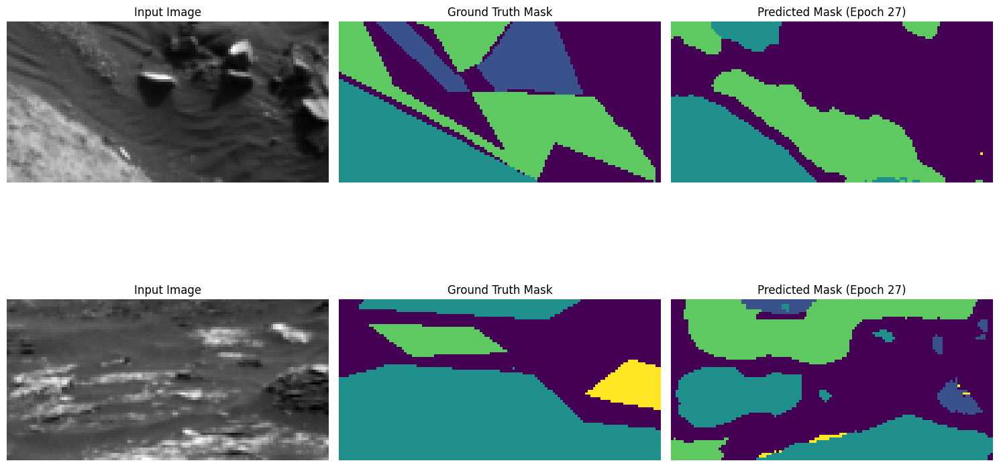

315/315 ━━━━━━━━━━━━━━━━━━━━ 69s 219ms/step - accuracy: 0.7589 - loss: 0.6854 - mean_iou: 0.5187 - val_accuracy: 0.7501 - val_loss: 0.7408 - val_mean_iou: 0.4519 - learning_rate: 5.0000e-05
Epoch 28/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step - accuracy: 0.7628 - loss: 0.6822 - mean_iou: 0.5216Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])
Epoch 28: val_mean_iou improved to 0.4596, saving model.

Epoch 28: val_loss did not improve from 0.73985
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


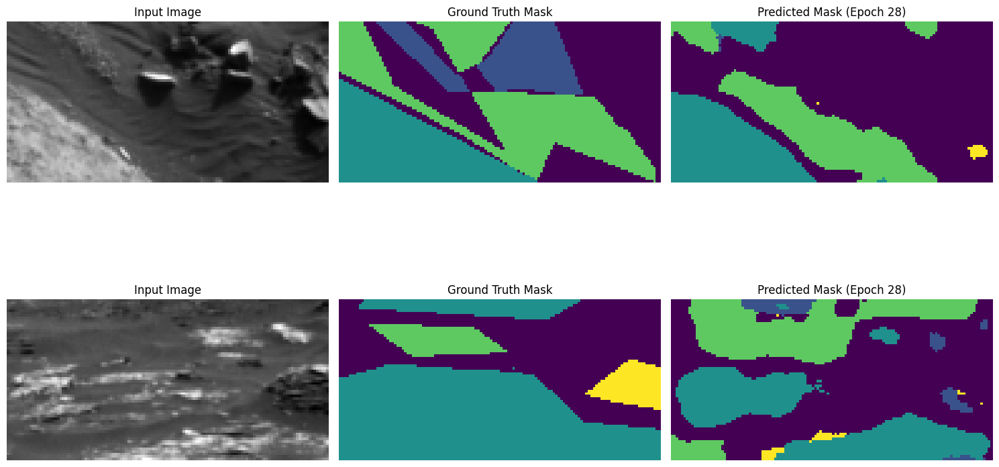

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 221ms/step - accuracy: 0.7628 - loss: 0.6822 - mean_iou: 0.5216 - val_accuracy: 0.7482 - val_loss: 0.7422 - val_mean_iou: 0.4596 - learning_rate: 5.0000e-05
Epoch 29/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - accuracy: 0.7684 - loss: 0.6788 - mean_iou: 0.5360Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 29: val_loss improved from 0.73985 to 0.73981, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


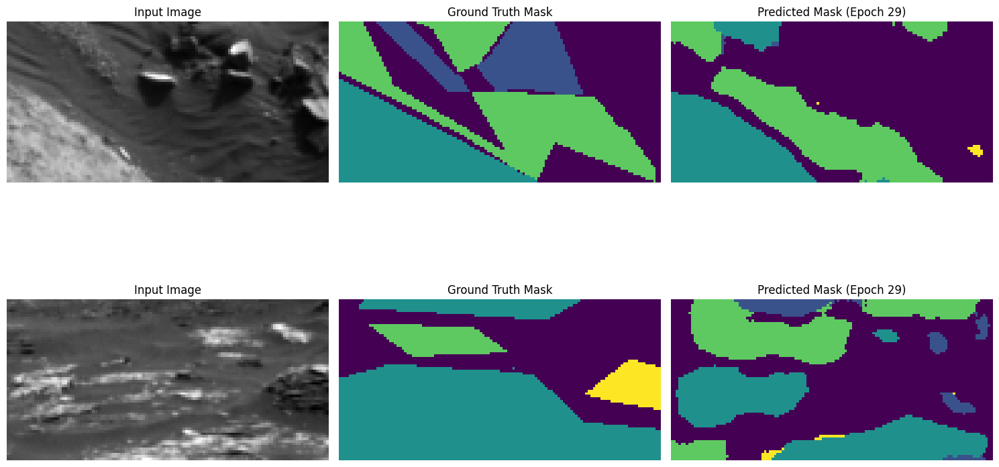

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 223ms/step - accuracy: 0.7684 - loss: 0.6788 - mean_iou: 0.5359 - val_accuracy: 0.7489 - val_loss: 0.7398 - val_mean_iou: 0.4549 - learning_rate: 5.0000e-05
Epoch 30/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - accuracy: 0.7700 - loss: 0.6767 - mean_iou: 0.5325Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 30: val_loss improved from 0.73981 to 0.73505, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


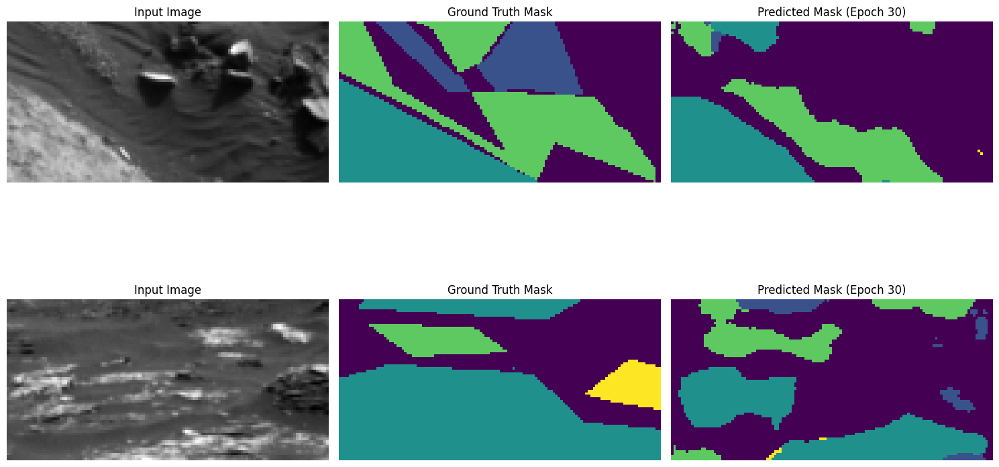

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 223ms/step - accuracy: 0.7700 - loss: 0.6767 - mean_iou: 0.5324 - val_accuracy: 0.7493 - val_loss: 0.7350 - val_mean_iou: 0.4489 - learning_rate: 5.0000e-05
Epoch 31/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step - accuracy: 0.7709 - loss: 0.6708 - mean_iou: 0.5305Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 31: val_loss improved from 0.73505 to 0.73311, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


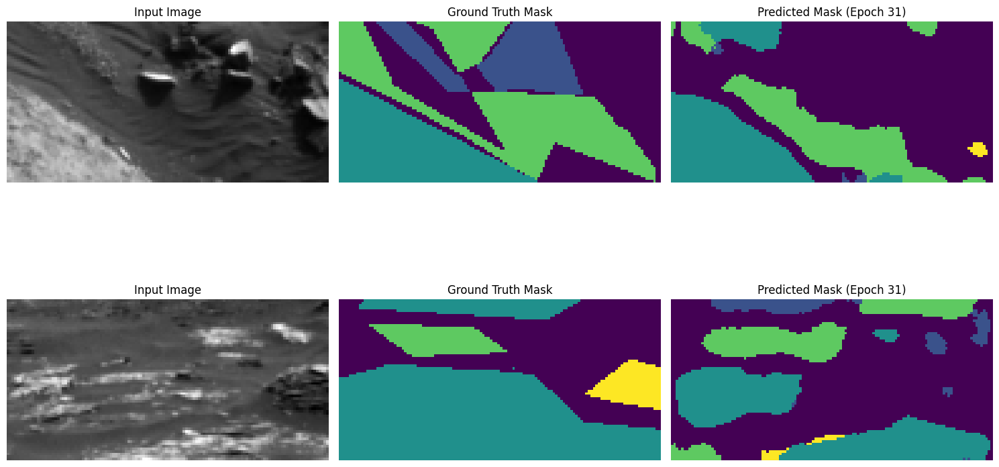

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 223ms/step - accuracy: 0.7709 - loss: 0.6708 - mean_iou: 0.5304 - val_accuracy: 0.7512 - val_loss: 0.7331 - val_mean_iou: 0.4561 - learning_rate: 5.0000e-05
Epoch 32/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - accuracy: 0.7708 - loss: 0.6693 - mean_iou: 0.5367Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 32: val_loss did not improve from 0.73311
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


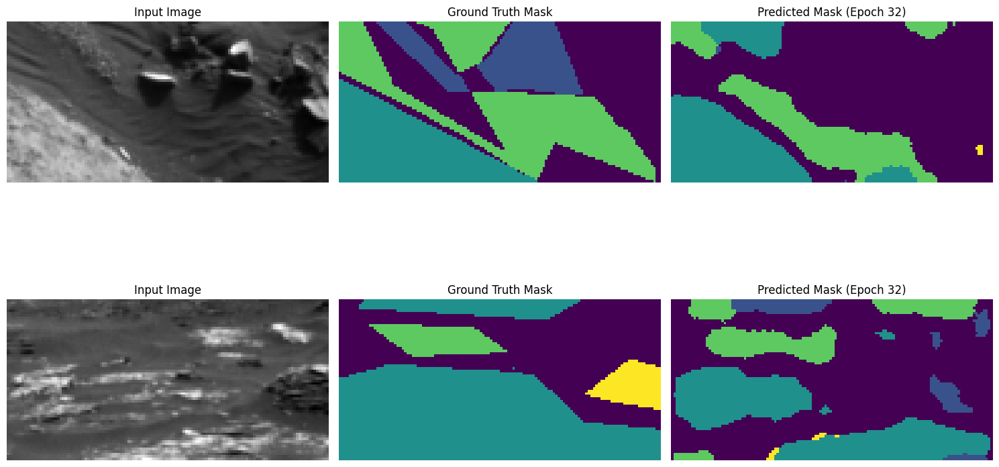

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 221ms/step - accuracy: 0.7708 - loss: 0.6693 - mean_iou: 0.5366 - val_accuracy: 0.7499 - val_loss: 0.7348 - val_mean_iou: 0.4440 - learning_rate: 5.0000e-05
Epoch 33/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step - accuracy: 0.7691 - loss: 0.6703 - mean_iou: 0.5327Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 33: val_loss improved from 0.73311 to 0.73251, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


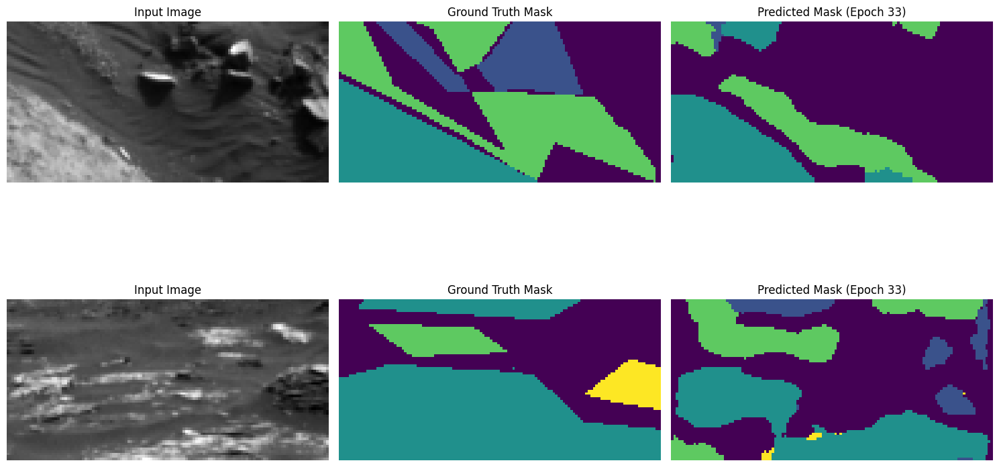

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 221ms/step - accuracy: 0.7691 - loss: 0.6703 - mean_iou: 0.5327 - val_accuracy: 0.7495 - val_loss: 0.7325 - val_mean_iou: 0.4516 - learning_rate: 5.0000e-05
Epoch 34/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step - accuracy: 0.7740 - loss: 0.6658 - mean_iou: 0.5435Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 34: val_loss improved from 0.73251 to 0.73199, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


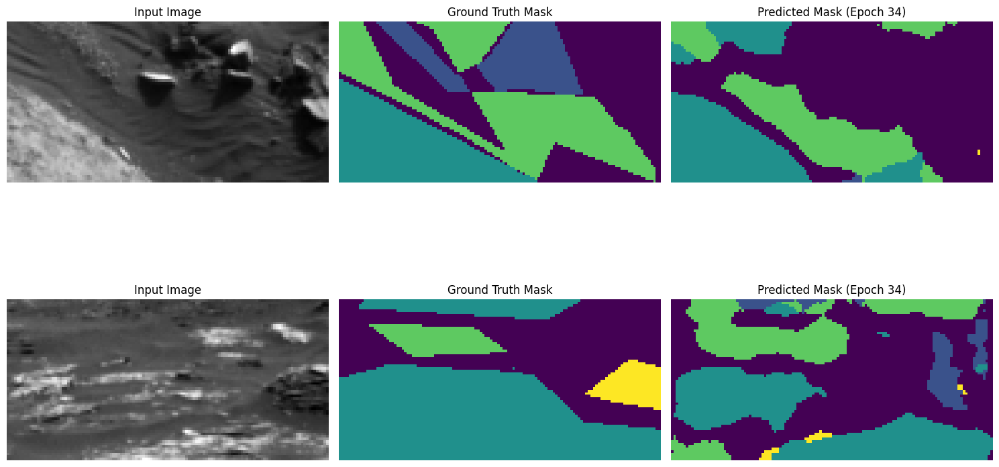

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 222ms/step - accuracy: 0.7740 - loss: 0.6658 - mean_iou: 0.5435 - val_accuracy: 0.7552 - val_loss: 0.7320 - val_mean_iou: 0.4585 - learning_rate: 5.0000e-05
Epoch 35/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - accuracy: 0.7771 - loss: 0.6632 - mean_iou: 0.5468Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])
Epoch 35: val_mean_iou improved to 0.4606, saving model.

Epoch 35: val_loss improved from 0.73199 to 0.72881, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


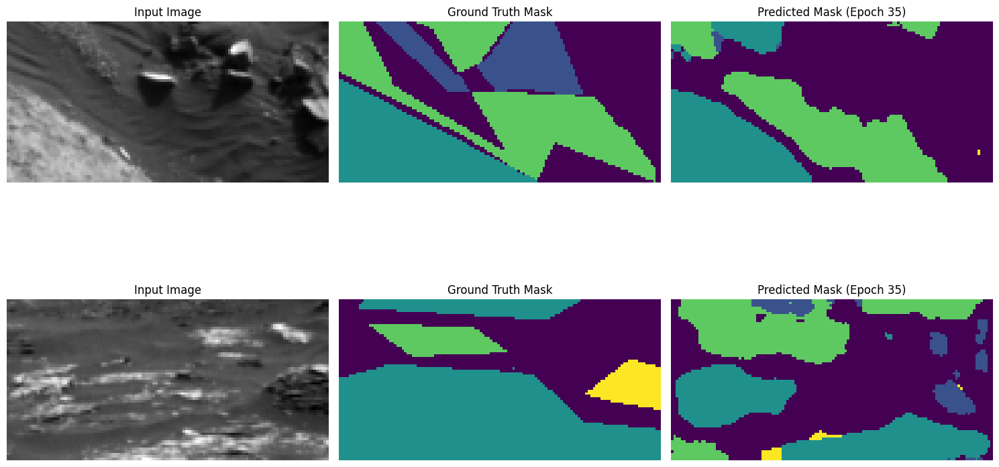

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 224ms/step - accuracy: 0.7771 - loss: 0.6632 - mean_iou: 0.5467 - val_accuracy: 0.7537 - val_loss: 0.7288 - val_mean_iou: 0.4606 - learning_rate: 5.0000e-05
Epoch 36/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - accuracy: 0.7783 - loss: 0.6593 - mean_iou: 0.5468Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 36: val_loss improved from 0.72881 to 0.71989, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


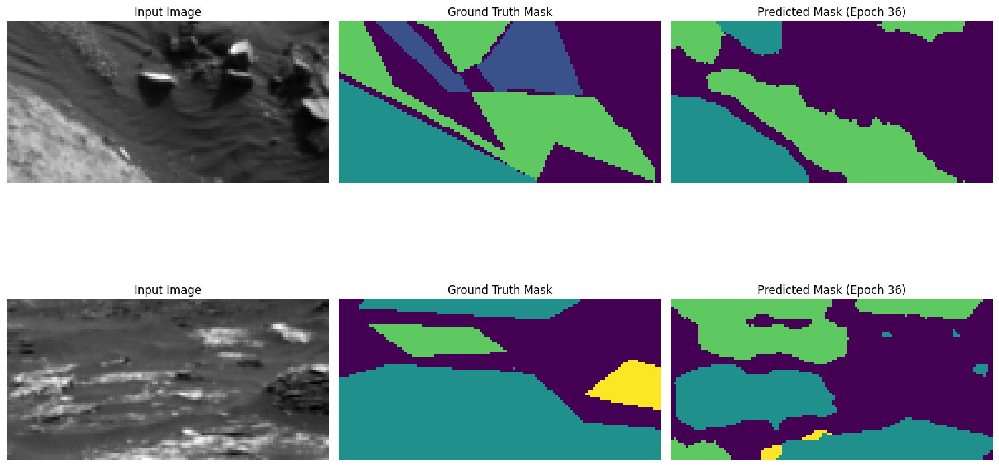

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 223ms/step - accuracy: 0.7783 - loss: 0.6593 - mean_iou: 0.5468 - val_accuracy: 0.7569 - val_loss: 0.7199 - val_mean_iou: 0.4559 - learning_rate: 5.0000e-05
Epoch 37/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step - accuracy: 0.7796 - loss: 0.6541 - mean_iou: 0.5451Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 37: val_loss improved from 0.71989 to 0.71294, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


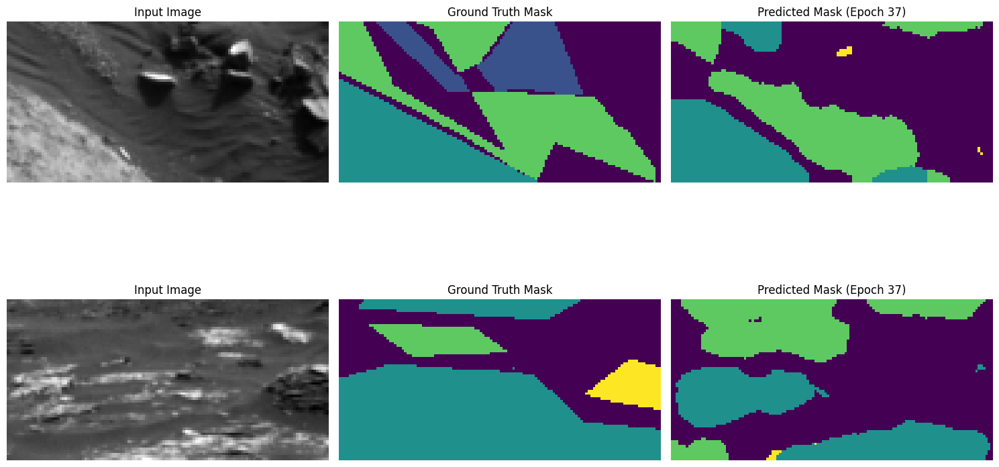

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 221ms/step - accuracy: 0.7797 - loss: 0.6541 - mean_iou: 0.5451 - val_accuracy: 0.7532 - val_loss: 0.7129 - val_mean_iou: 0.4542 - learning_rate: 5.0000e-05
Epoch 38/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - accuracy: 0.7823 - loss: 0.6460 - mean_iou: 0.5515Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 38: val_loss did not improve from 0.71294
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


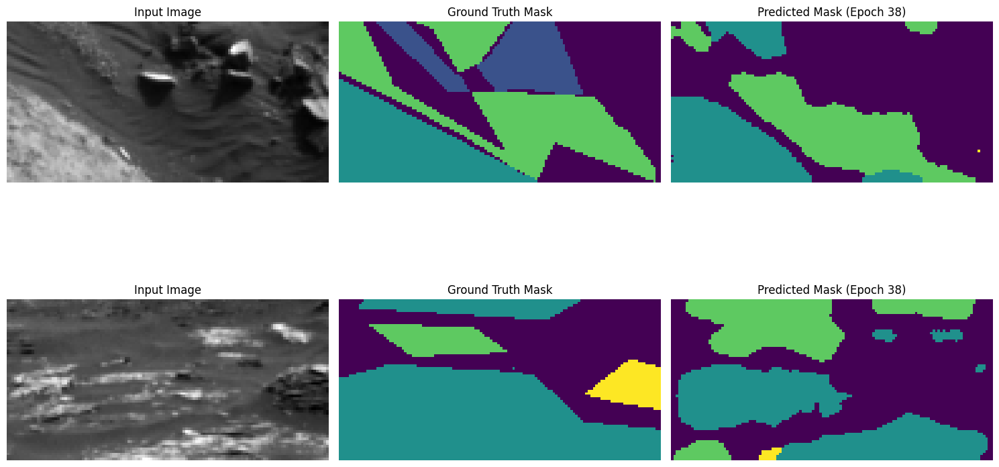

315/315 ━━━━━━━━━━━━━━━━━━━━ 69s 221ms/step - accuracy: 0.7823 - loss: 0.6460 - mean_iou: 0.5515 - val_accuracy: 0.7391 - val_loss: 0.7186 - val_mean_iou: 0.4314 - learning_rate: 5.0000e-05
Epoch 39/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step - accuracy: 0.7778 - loss: 0.6462 - mean_iou: 0.5473Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 39: val_loss improved from 0.71294 to 0.70925, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


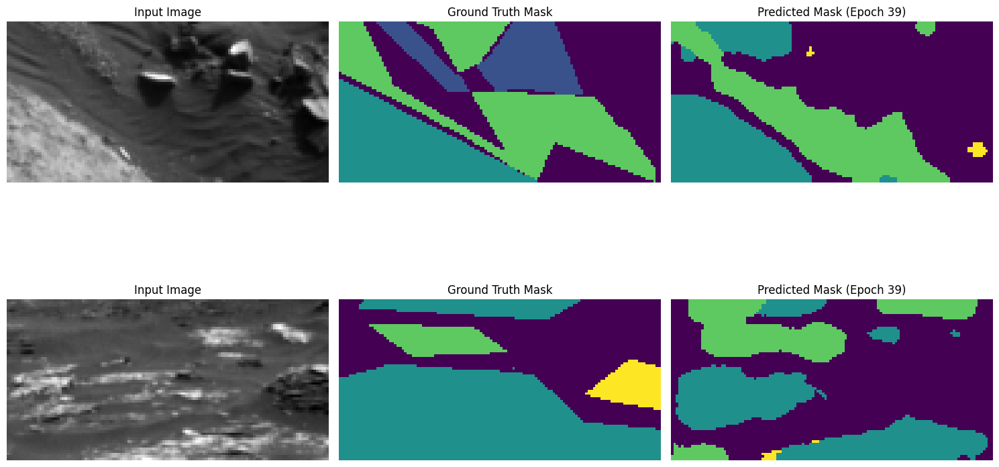

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 224ms/step - accuracy: 0.7779 - loss: 0.6462 - mean_iou: 0.5473 - val_accuracy: 0.7537 - val_loss: 0.7093 - val_mean_iou: 0.4604 - learning_rate: 5.0000e-05
Epoch 40/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - accuracy: 0.7868 - loss: 0.6397 - mean_iou: 0.5624Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 40: val_loss did not improve from 0.70925
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


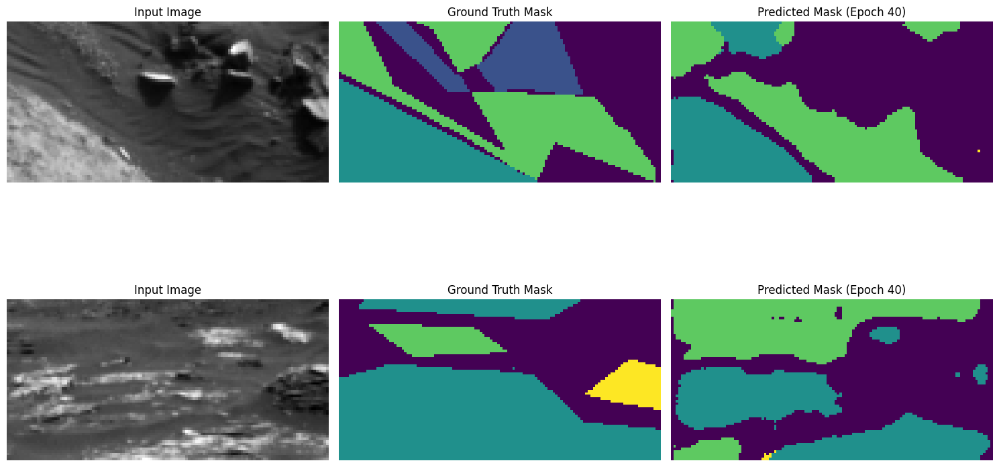

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 221ms/step - accuracy: 0.7868 - loss: 0.6397 - mean_iou: 0.5623 - val_accuracy: 0.7519 - val_loss: 0.7119 - val_mean_iou: 0.4535 - learning_rate: 5.0000e-05
Epoch 41/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - accuracy: 0.7882 - loss: 0.6382 - mean_iou: 0.5590Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])
Epoch 41: val_mean_iou improved to 0.4691, saving model.

Epoch 41: val_loss did not improve from 0.70925
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


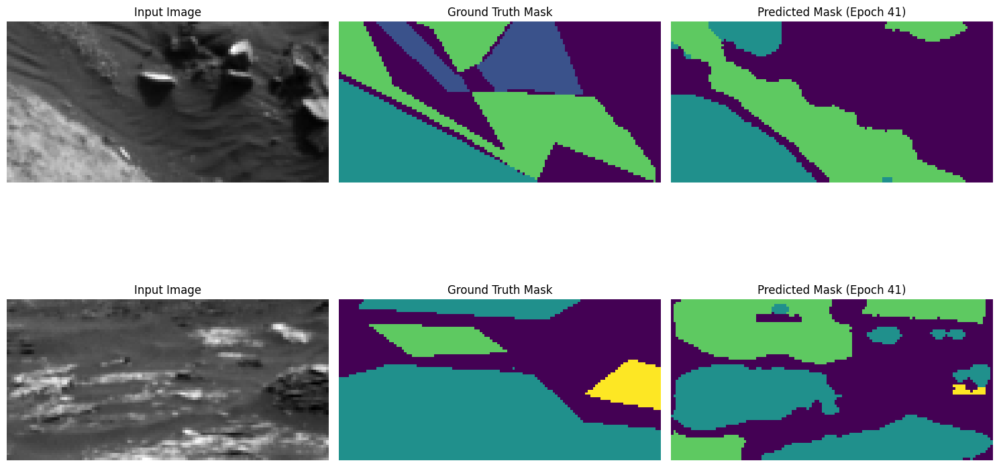

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 222ms/step - accuracy: 0.7883 - loss: 0.6382 - mean_iou: 0.5590 - val_accuracy: 0.7550 - val_loss: 0.7107 - val_mean_iou: 0.4691 - learning_rate: 5.0000e-05
Epoch 42/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - accuracy: 0.7905 - loss: 0.6370 - mean_iou: 0.5736Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 42: val_loss did not improve from 0.70925
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


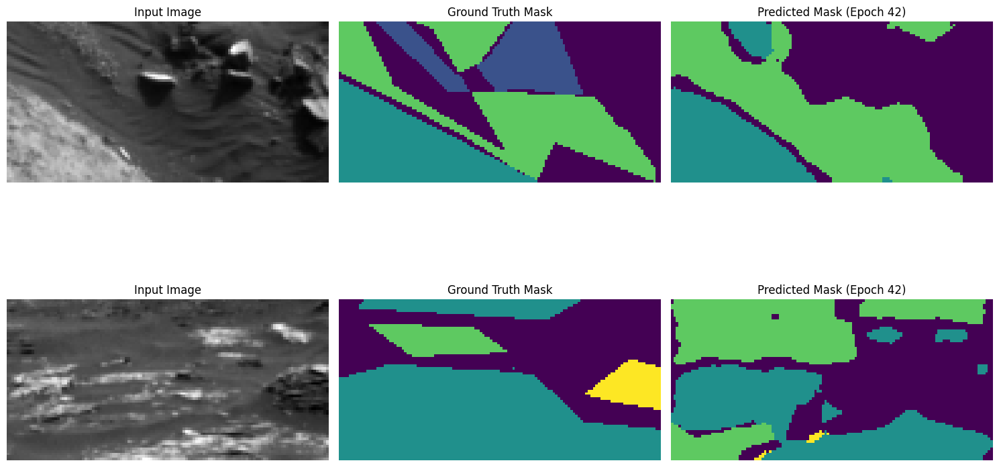

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 223ms/step - accuracy: 0.7905 - loss: 0.6370 - mean_iou: 0.5736 - val_accuracy: 0.7543 - val_loss: 0.7130 - val_mean_iou: 0.4570 - learning_rate: 5.0000e-05
Epoch 43/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - accuracy: 0.7911 - loss: 0.6347 - mean_iou: 0.5707Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 43: val_loss did not improve from 0.70925
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


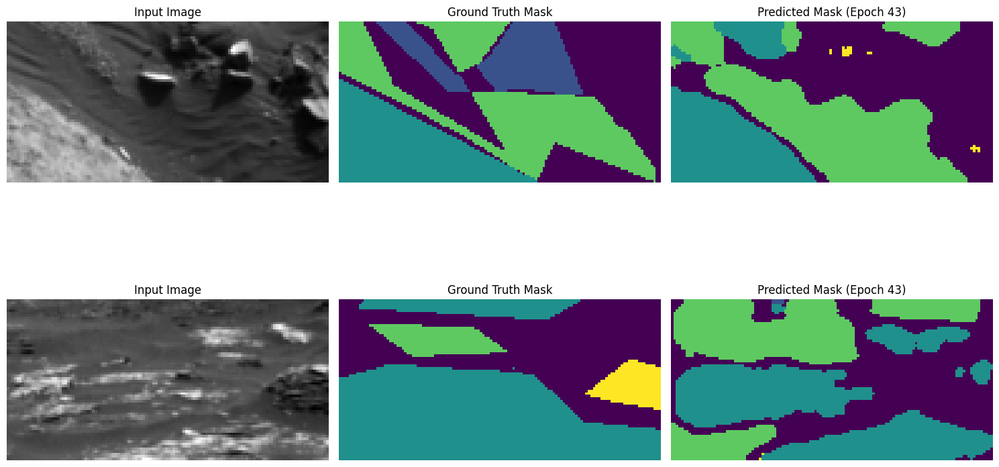

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 222ms/step - accuracy: 0.7911 - loss: 0.6347 - mean_iou: 0.5706 - val_accuracy: 0.7499 - val_loss: 0.7138 - val_mean_iou: 0.4671 - learning_rate: 5.0000e-05
Epoch 44/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - accuracy: 0.7962 - loss: 0.6314 - mean_iou: 0.5753Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 44: val_loss did not improve from 0.70925

Epoch 44: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-05.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


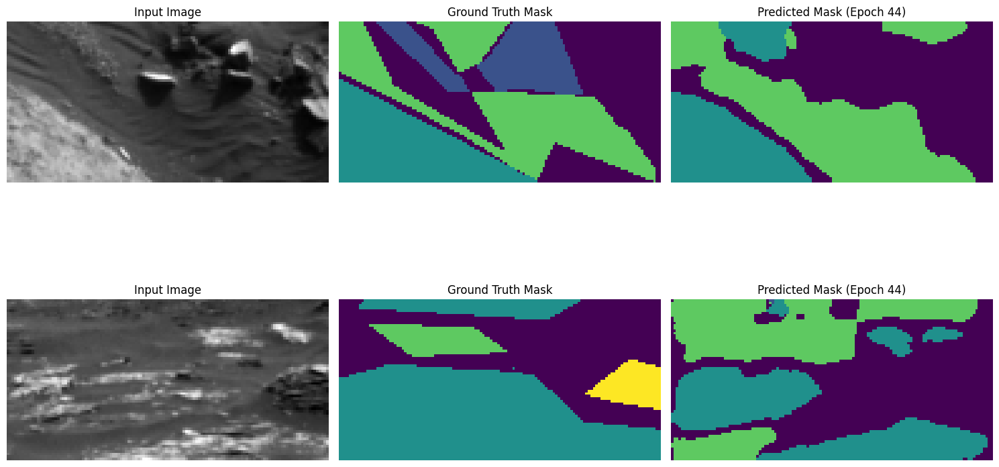

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 221ms/step - accuracy: 0.7962 - loss: 0.6314 - mean_iou: 0.5752 - val_accuracy: 0.7471 - val_loss: 0.7159 - val_mean_iou: 0.4553 - learning_rate: 5.0000e-05
Epoch 45/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step - accuracy: 0.8002 - loss: 0.6298 - mean_iou: 0.5763Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 45: val_loss did not improve from 0.70925
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


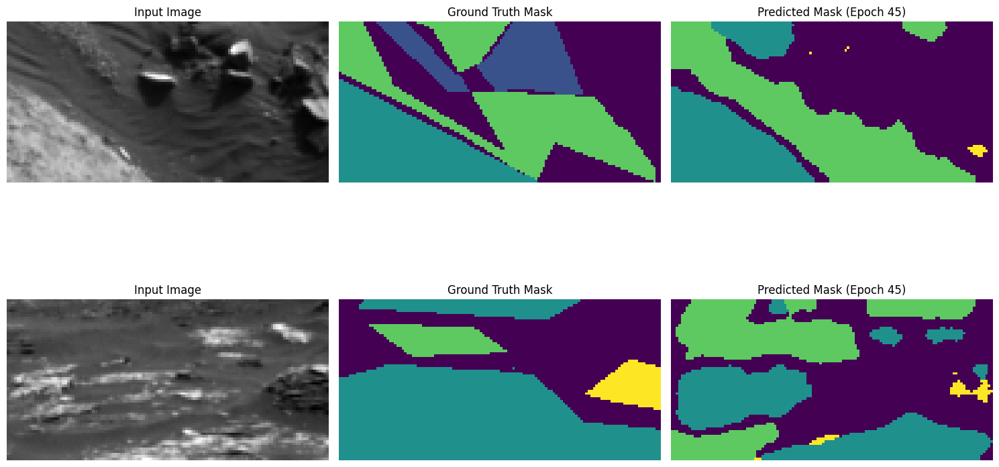

315/315 ━━━━━━━━━━━━━━━━━━━━ 69s 220ms/step - accuracy: 0.8003 - loss: 0.6298 - mean_iou: 0.5763 - val_accuracy: 0.7543 - val_loss: 0.7107 - val_mean_iou: 0.4680 - learning_rate: 2.5000e-05
Epoch 46/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step - accuracy: 0.8089 - loss: 0.6237 - mean_iou: 0.5940Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])
Epoch 46: val_mean_iou improved to 0.4706, saving model.

Epoch 46: val_loss did not improve from 0.70925
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


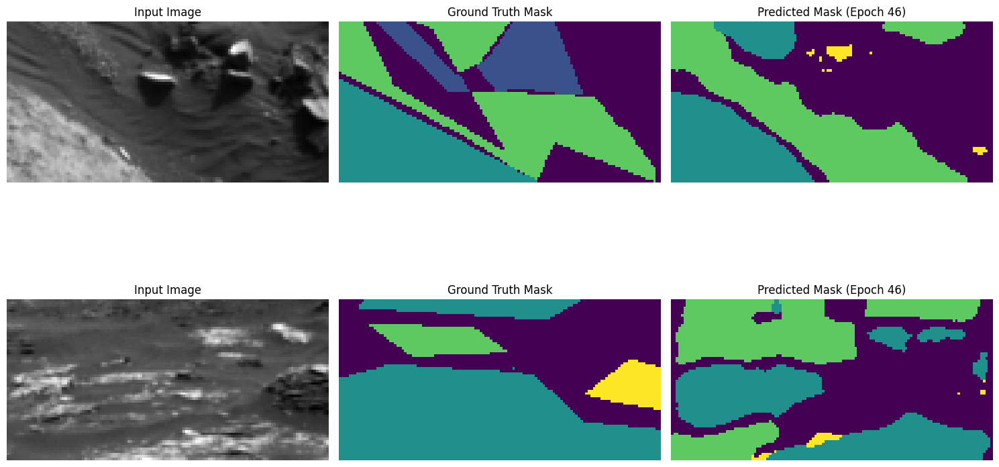

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 221ms/step - accuracy: 0.8089 - loss: 0.6237 - mean_iou: 0.5940 - val_accuracy: 0.7578 - val_loss: 0.7095 - val_mean_iou: 0.4706 - learning_rate: 2.5000e-05
Epoch 47/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - accuracy: 0.8107 - loss: 0.6208 - mean_iou: 0.5958Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])
Epoch 47: val_mean_iou improved to 0.4753, saving model.

Epoch 47: val_loss did not improve from 0.70925
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


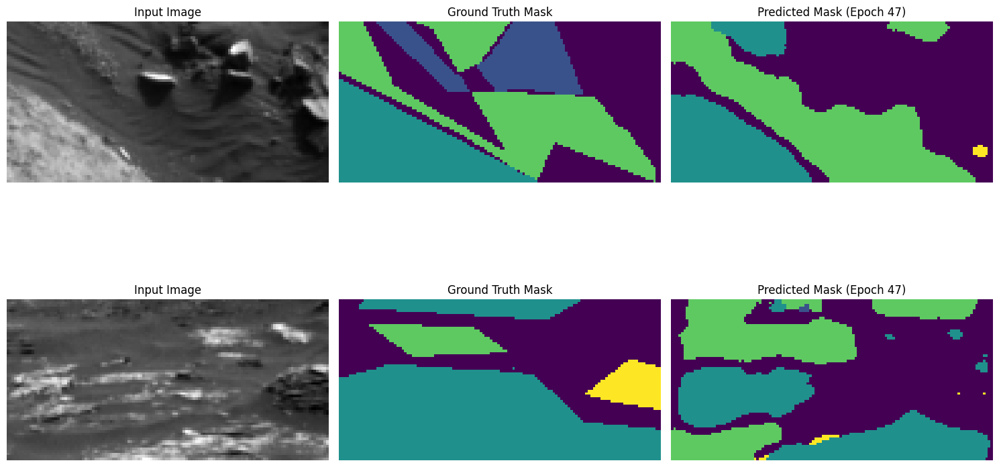

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 222ms/step - accuracy: 0.8107 - loss: 0.6208 - mean_iou: 0.5958 - val_accuracy: 0.7570 - val_loss: 0.7112 - val_mean_iou: 0.4753 - learning_rate: 2.5000e-05
Epoch 48/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step - accuracy: 0.8096 - loss: 0.6210 - mean_iou: 0.5916Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 48: val_loss improved from 0.70925 to 0.70823, saving model to best_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


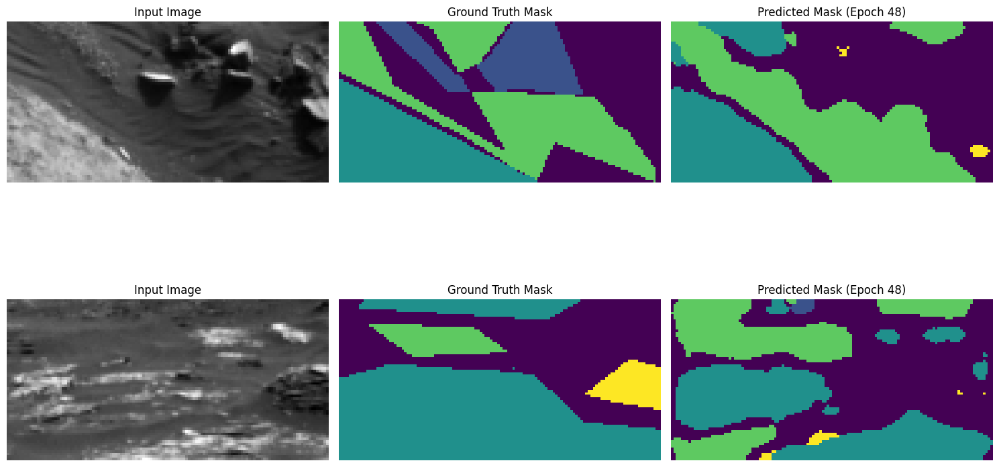

315/315 ━━━━━━━━━━━━━━━━━━━━ 71s 224ms/step - accuracy: 0.8096 - loss: 0.6210 - mean_iou: 0.5916 - val_accuracy: 0.7625 - val_loss: 0.7082 - val_mean_iou: 0.4710 - learning_rate: 2.5000e-05
Epoch 49/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step - accuracy: 0.8145 - loss: 0.6176 - mean_iou: 0.5990Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 49: val_loss did not improve from 0.70823
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


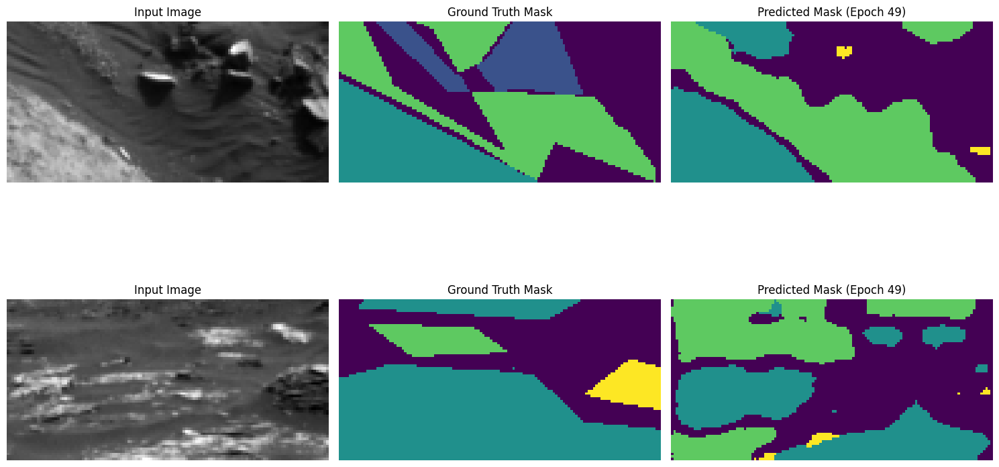

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 222ms/step - accuracy: 0.8146 - loss: 0.6176 - mean_iou: 0.5990 - val_accuracy: 0.7550 - val_loss: 0.7121 - val_mean_iou: 0.4683 - learning_rate: 2.5000e-05
Epoch 50/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step - accuracy: 0.8182 - loss: 0.6150 - mean_iou: 0.6064Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 50: val_loss did not improve from 0.70823
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


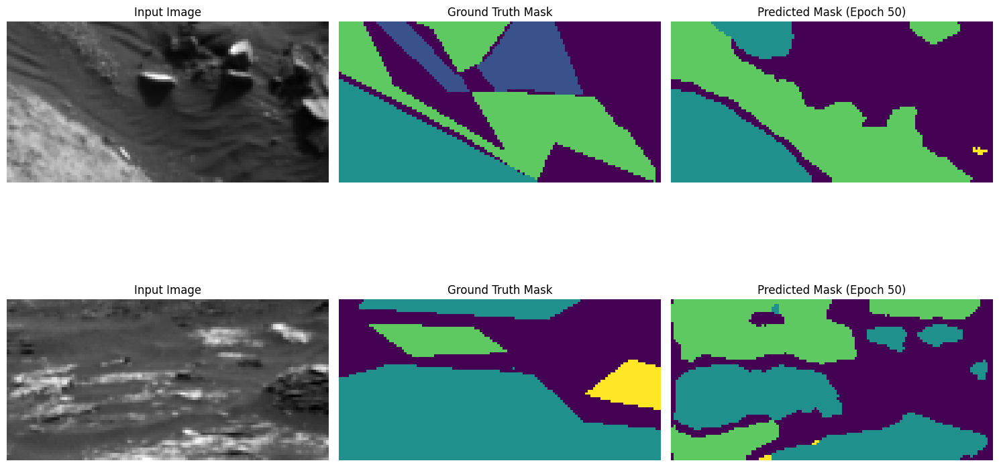

315/315 ━━━━━━━━━━━━━━━━━━━━ 69s 220ms/step - accuracy: 0.8183 - loss: 0.6150 - mean_iou: 0.6064 - val_accuracy: 0.7611 - val_loss: 0.7097 - val_mean_iou: 0.4673 - learning_rate: 2.5000e-05
Epoch 51/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step - accuracy: 0.8180 - loss: 0.6143 - mean_iou: 0.6067Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 51: val_loss did not improve from 0.70823
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


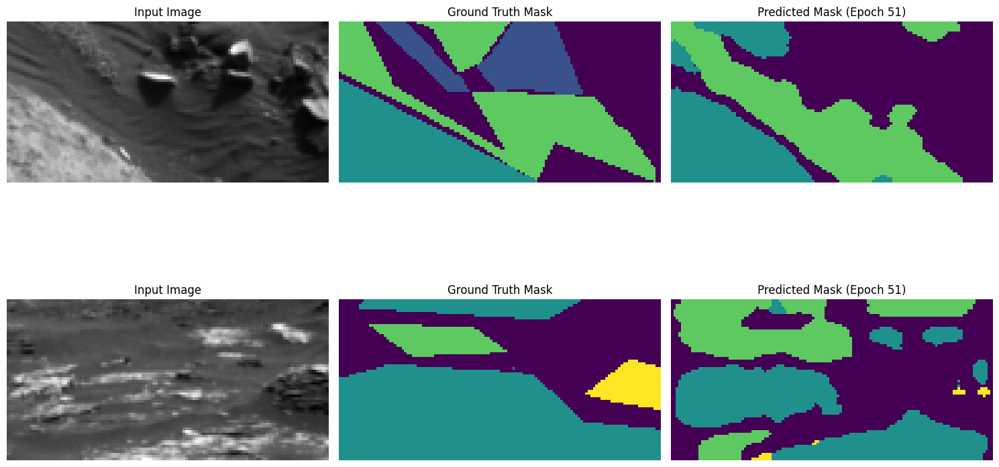

315/315 ━━━━━━━━━━━━━━━━━━━━ 69s 219ms/step - accuracy: 0.8180 - loss: 0.6143 - mean_iou: 0.6067 - val_accuracy: 0.7561 - val_loss: 0.7118 - val_mean_iou: 0.4640 - learning_rate: 2.5000e-05
Epoch 52/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step - accuracy: 0.8200 - loss: 0.6134 - mean_iou: 0.6105Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 52: val_loss did not improve from 0.70823
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


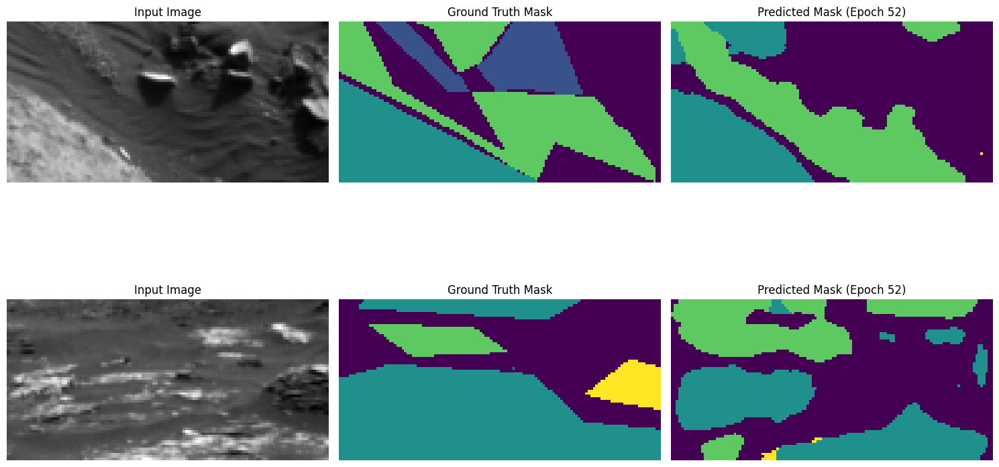

315/315 ━━━━━━━━━━━━━━━━━━━━ 69s 219ms/step - accuracy: 0.8200 - loss: 0.6134 - mean_iou: 0.6104 - val_accuracy: 0.7569 - val_loss: 0.7123 - val_mean_iou: 0.4586 - learning_rate: 2.5000e-05
Epoch 53/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step - accuracy: 0.8207 - loss: 0.6123 - mean_iou: 0.6106Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 53: val_loss did not improve from 0.70823

Epoch 53: ReduceLROnPlateau reducing learning rate to 1.249999968422344e-05.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


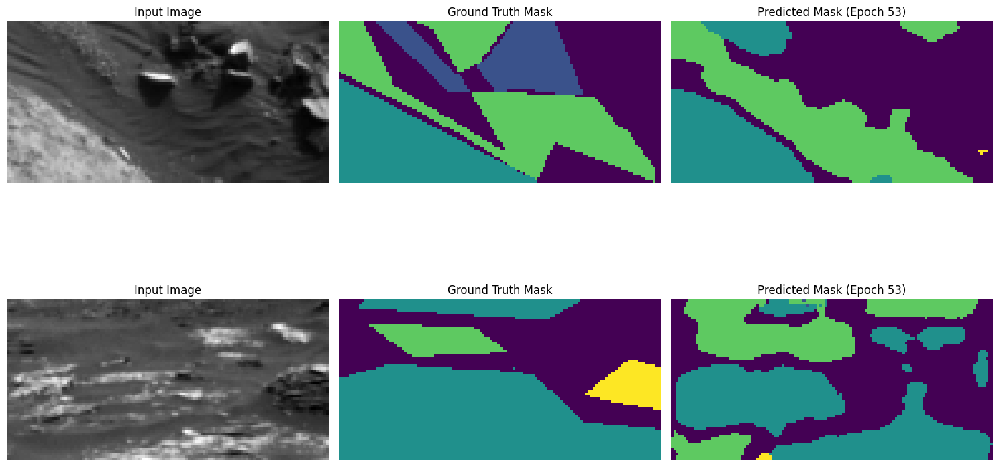

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 222ms/step - accuracy: 0.8207 - loss: 0.6123 - mean_iou: 0.6106 - val_accuracy: 0.7566 - val_loss: 0.7121 - val_mean_iou: 0.4679 - learning_rate: 2.5000e-05
Epoch 54/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - accuracy: 0.8258 - loss: 0.6087 - mean_iou: 0.6212Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 54: val_loss did not improve from 0.70823
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


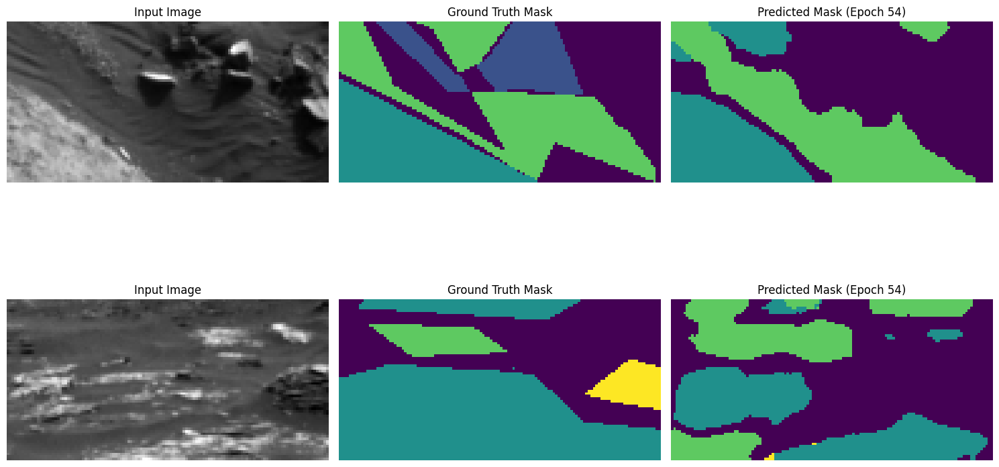

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 221ms/step - accuracy: 0.8258 - loss: 0.6087 - mean_iou: 0.6211 - val_accuracy: 0.7662 - val_loss: 0.7090 - val_mean_iou: 0.4627 - learning_rate: 1.2500e-05
Epoch 55/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - accuracy: 0.8293 - loss: 0.6064 - mean_iou: 0.6203Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 55: val_loss did not improve from 0.70823
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


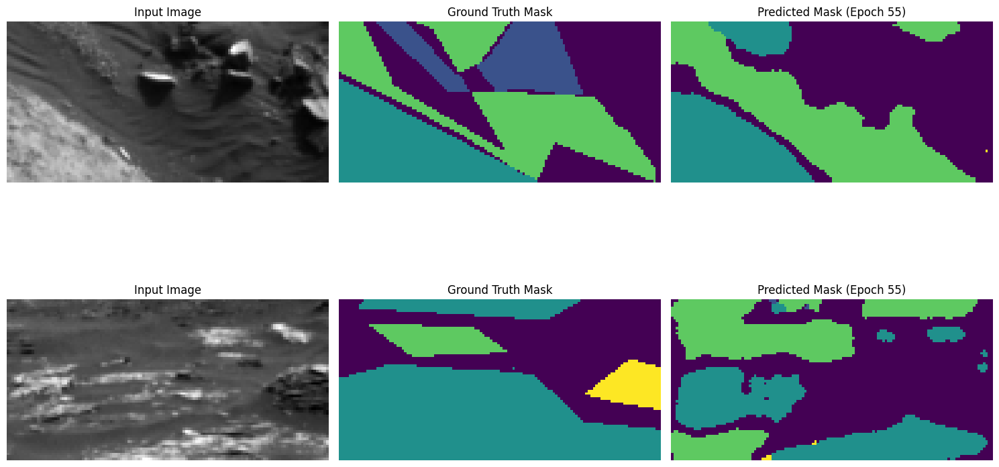

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 222ms/step - accuracy: 0.8293 - loss: 0.6063 - mean_iou: 0.6203 - val_accuracy: 0.7626 - val_loss: 0.7119 - val_mean_iou: 0.4598 - learning_rate: 1.2500e-05
Epoch 56/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step - accuracy: 0.8310 - loss: 0.6051 - mean_iou: 0.6247Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 56: val_loss did not improve from 0.70823
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


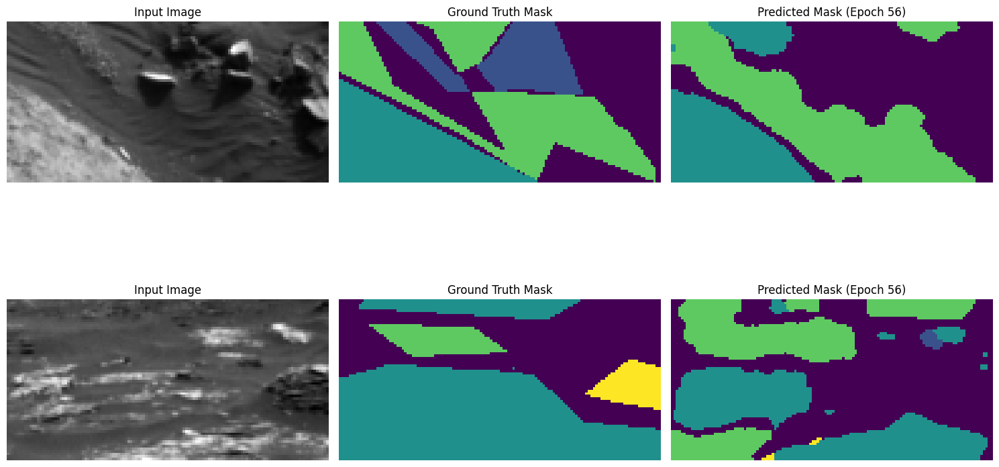

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 222ms/step - accuracy: 0.8310 - loss: 0.6051 - mean_iou: 0.6246 - val_accuracy: 0.7645 - val_loss: 0.7104 - val_mean_iou: 0.4635 - learning_rate: 1.2500e-05
Epoch 57/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - accuracy: 0.8334 - loss: 0.6028 - mean_iou: 0.6280Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 57: val_loss did not improve from 0.70823
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


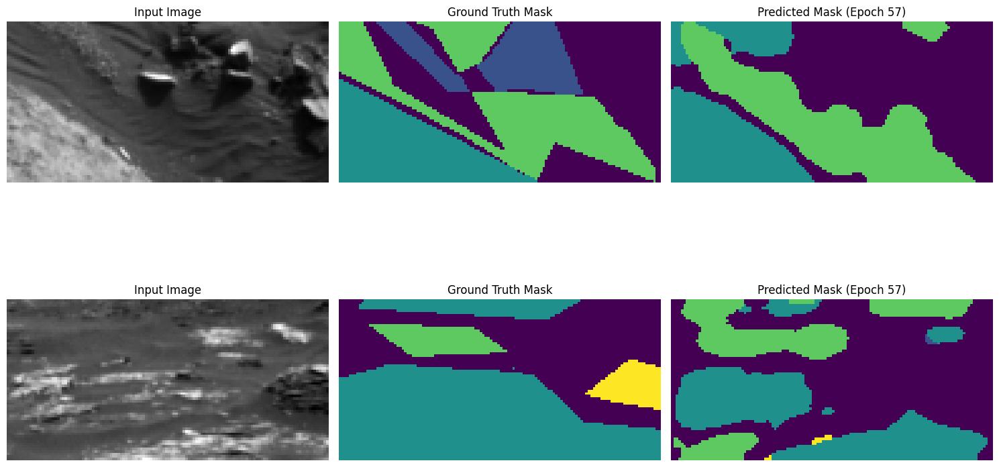

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 221ms/step - accuracy: 0.8334 - loss: 0.6028 - mean_iou: 0.6280 - val_accuracy: 0.7655 - val_loss: 0.7108 - val_mean_iou: 0.4599 - learning_rate: 1.2500e-05
Epoch 58/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - accuracy: 0.8340 - loss: 0.6028 - mean_iou: 0.6264Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 58: val_loss did not improve from 0.70823

Epoch 58: ReduceLROnPlateau reducing learning rate to 6.24999984211172e-06.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


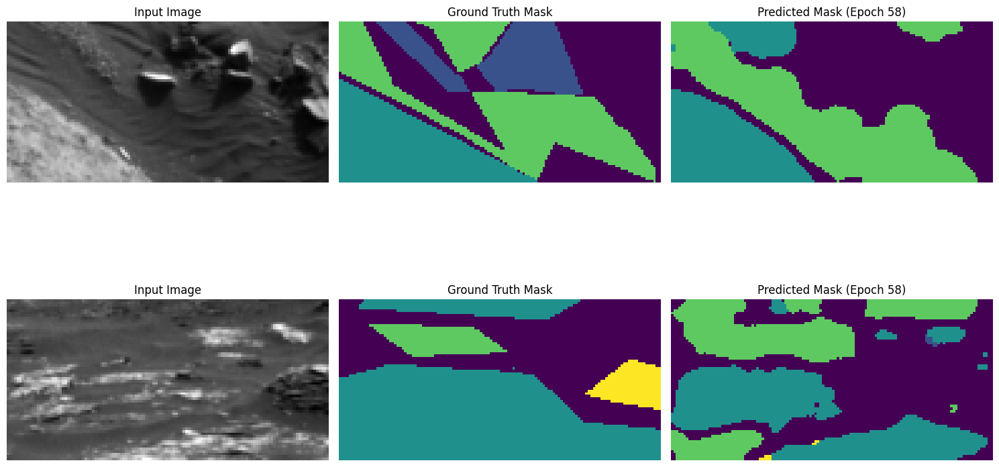

315/315 ━━━━━━━━━━━━━━━━━━━━ 69s 220ms/step - accuracy: 0.8340 - loss: 0.6028 - mean_iou: 0.6263 - val_accuracy: 0.7668 - val_loss: 0.7095 - val_mean_iou: 0.4676 - learning_rate: 1.2500e-05
Epoch 59/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - accuracy: 0.8383 - loss: 0.5998 - mean_iou: 0.6351Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 59: val_loss did not improve from 0.70823
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


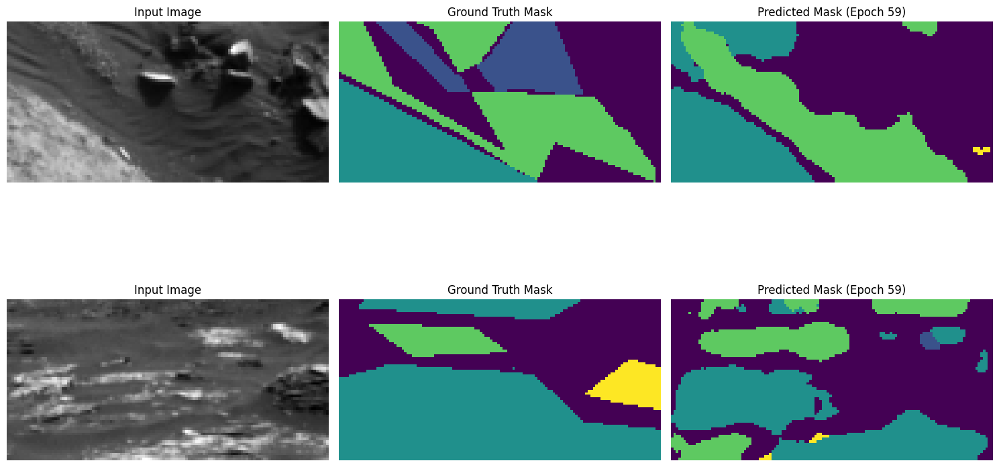

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 221ms/step - accuracy: 0.8383 - loss: 0.5998 - mean_iou: 0.6351 - val_accuracy: 0.7683 - val_loss: 0.7090 - val_mean_iou: 0.4690 - learning_rate: 6.2500e-06
Epoch 60/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step - accuracy: 0.8388 - loss: 0.5992 - mean_iou: 0.6337Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 60: val_loss did not improve from 0.70823
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


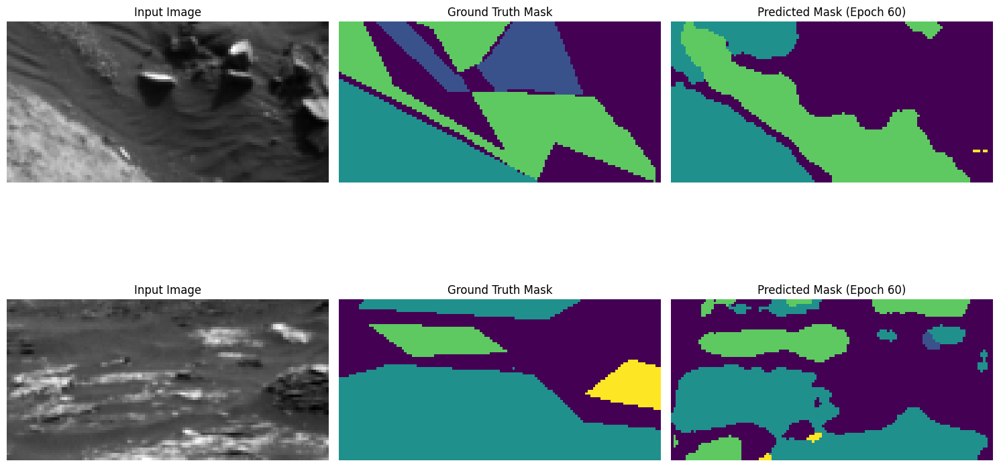

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 222ms/step - accuracy: 0.8388 - loss: 0.5992 - mean_iou: 0.6337 - val_accuracy: 0.7677 - val_loss: 0.7107 - val_mean_iou: 0.4664 - learning_rate: 6.2500e-06
Epoch 61/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - accuracy: 0.8401 - loss: 0.5980 - mean_iou: 0.6339Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 61: val_loss did not improve from 0.70823
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


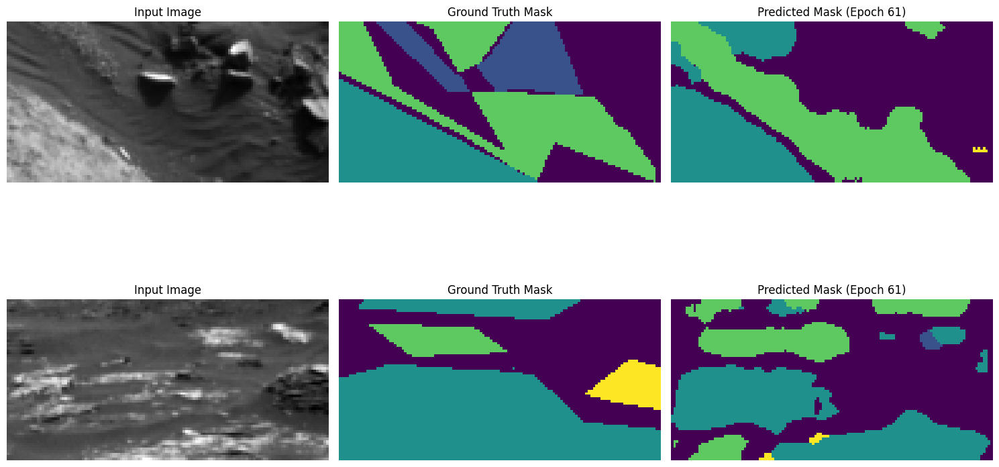

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 221ms/step - accuracy: 0.8401 - loss: 0.5980 - mean_iou: 0.6338 - val_accuracy: 0.7679 - val_loss: 0.7104 - val_mean_iou: 0.4666 - learning_rate: 6.2500e-06
Epoch 62/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - accuracy: 0.8421 - loss: 0.5966 - mean_iou: 0.6381Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 62: val_loss did not improve from 0.70823
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


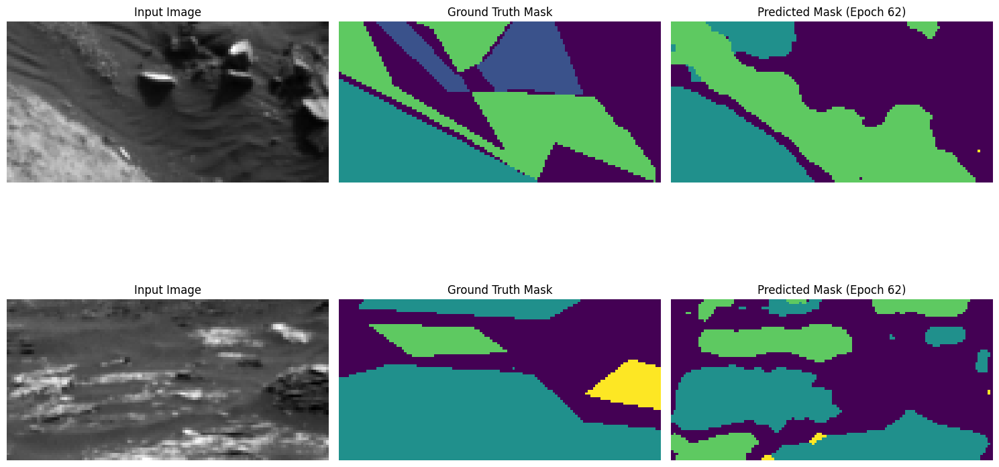

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 221ms/step - accuracy: 0.8421 - loss: 0.5966 - mean_iou: 0.6380 - val_accuracy: 0.7669 - val_loss: 0.7104 - val_mean_iou: 0.4669 - learning_rate: 6.2500e-06
Epoch 63/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - accuracy: 0.8424 - loss: 0.5959 - mean_iou: 0.6385Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 63: val_loss did not improve from 0.70823

Epoch 63: ReduceLROnPlateau reducing learning rate to 3.12499992105586e-06.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


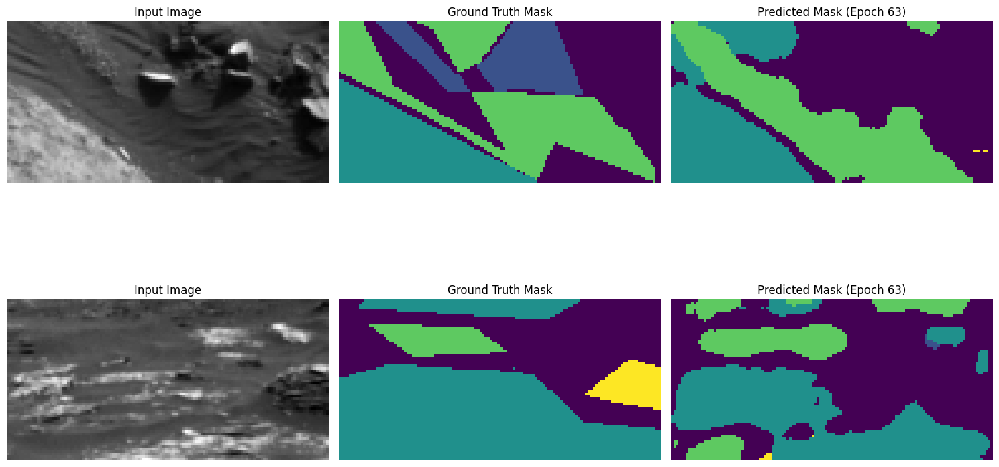

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 221ms/step - accuracy: 0.8424 - loss: 0.5959 - mean_iou: 0.6384 - val_accuracy: 0.7671 - val_loss: 0.7108 - val_mean_iou: 0.4665 - learning_rate: 6.2500e-06
Epoch 64/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - accuracy: 0.8440 - loss: 0.5950 - mean_iou: 0.6411Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 64: val_loss did not improve from 0.70823
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


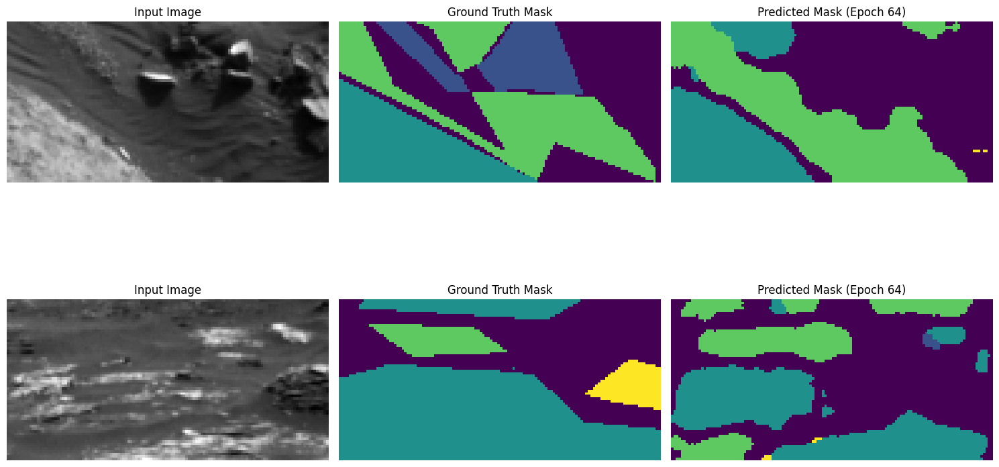

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 222ms/step - accuracy: 0.8440 - loss: 0.5950 - mean_iou: 0.6411 - val_accuracy: 0.7658 - val_loss: 0.7114 - val_mean_iou: 0.4634 - learning_rate: 3.1250e-06
Epoch 65/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - accuracy: 0.8451 - loss: 0.5940 - mean_iou: 0.6416Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 65: val_loss did not improve from 0.70823
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


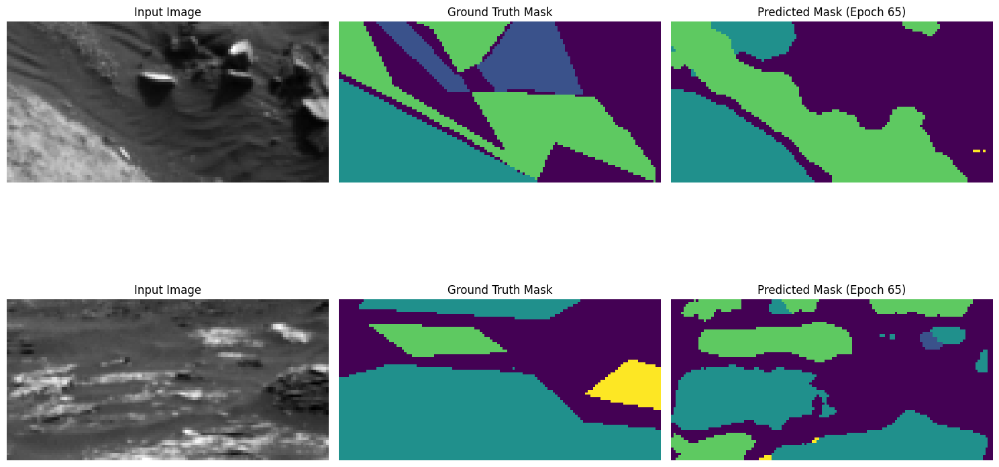

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 221ms/step - accuracy: 0.8451 - loss: 0.5940 - mean_iou: 0.6416 - val_accuracy: 0.7653 - val_loss: 0.7113 - val_mean_iou: 0.4628 - learning_rate: 3.1250e-06
Epoch 66/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - accuracy: 0.8453 - loss: 0.5935 - mean_iou: 0.6416Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 66: val_loss did not improve from 0.70823
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


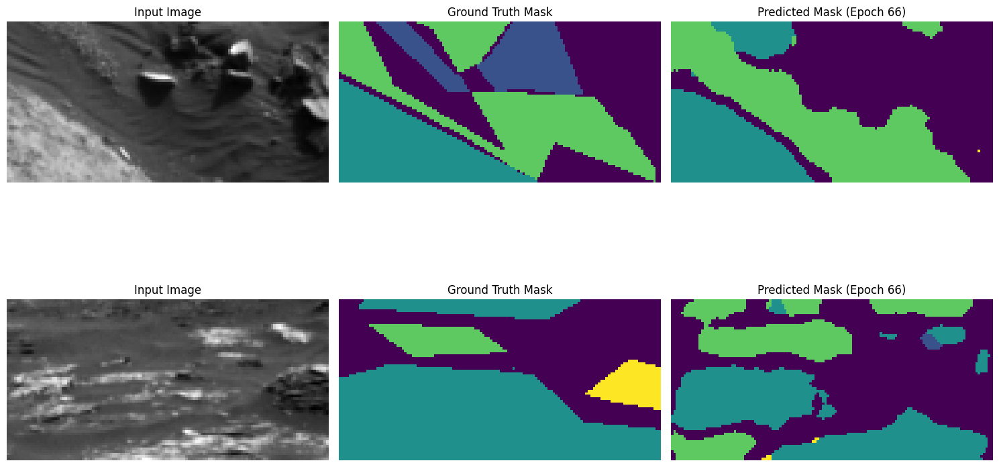

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 221ms/step - accuracy: 0.8453 - loss: 0.5935 - mean_iou: 0.6416 - val_accuracy: 0.7660 - val_loss: 0.7113 - val_mean_iou: 0.4646 - learning_rate: 3.1250e-06
Epoch 67/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step - accuracy: 0.8462 - loss: 0.5928 - mean_iou: 0.6438Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 67: val_loss did not improve from 0.70823
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


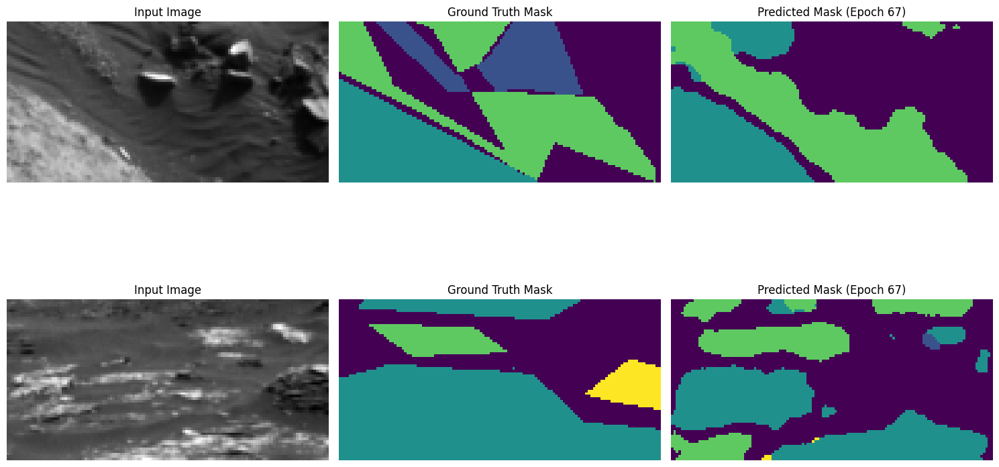

315/315 ━━━━━━━━━━━━━━━━━━━━ 69s 220ms/step - accuracy: 0.8462 - loss: 0.5928 - mean_iou: 0.6438 - val_accuracy: 0.7657 - val_loss: 0.7122 - val_mean_iou: 0.4630 - learning_rate: 3.1250e-06
Epoch 68/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step - accuracy: 0.8468 - loss: 0.5925 - mean_iou: 0.6436Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 68: val_loss did not improve from 0.70823

Epoch 68: ReduceLROnPlateau reducing learning rate to 1.56249996052793e-06.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


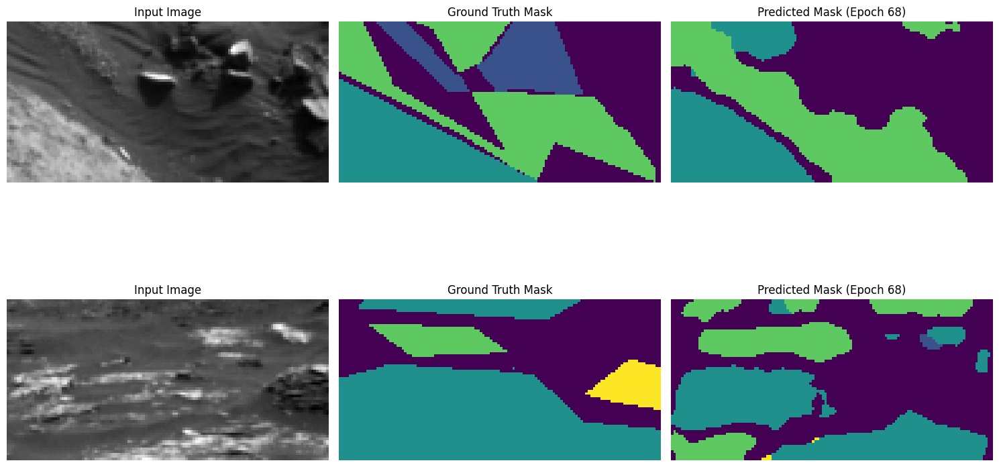

315/315 ━━━━━━━━━━━━━━━━━━━━ 69s 220ms/step - accuracy: 0.8468 - loss: 0.5925 - mean_iou: 0.6436 - val_accuracy: 0.7662 - val_loss: 0.7117 - val_mean_iou: 0.4637 - learning_rate: 3.1250e-06
Epoch 69/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step - accuracy: 0.8475 - loss: 0.5920 - mean_iou: 0.6449Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 69: val_loss did not improve from 0.70823
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


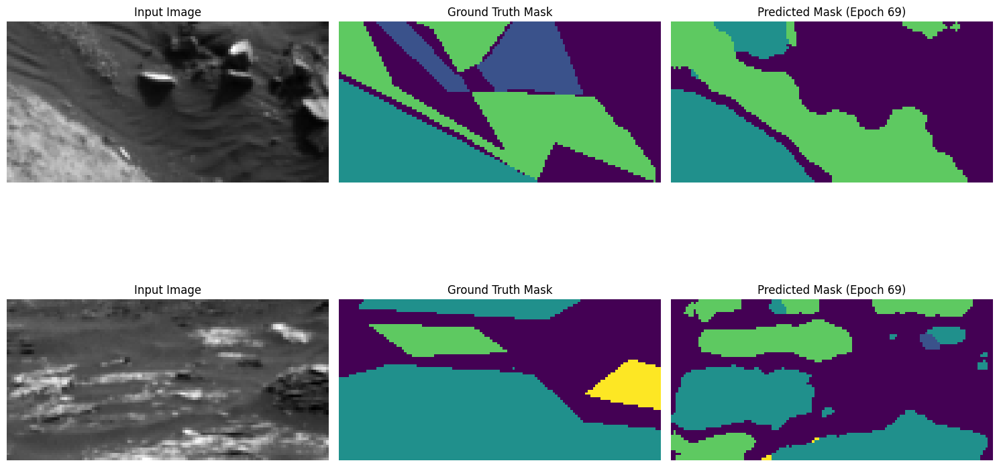

315/315 ━━━━━━━━━━━━━━━━━━━━ 69s 220ms/step - accuracy: 0.8475 - loss: 0.5920 - mean_iou: 0.6449 - val_accuracy: 0.7645 - val_loss: 0.7120 - val_mean_iou: 0.4609 - learning_rate: 1.5625e-06
Epoch 70/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step - accuracy: 0.8481 - loss: 0.5914 - mean_iou: 0.6459Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 70: val_loss did not improve from 0.70823
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


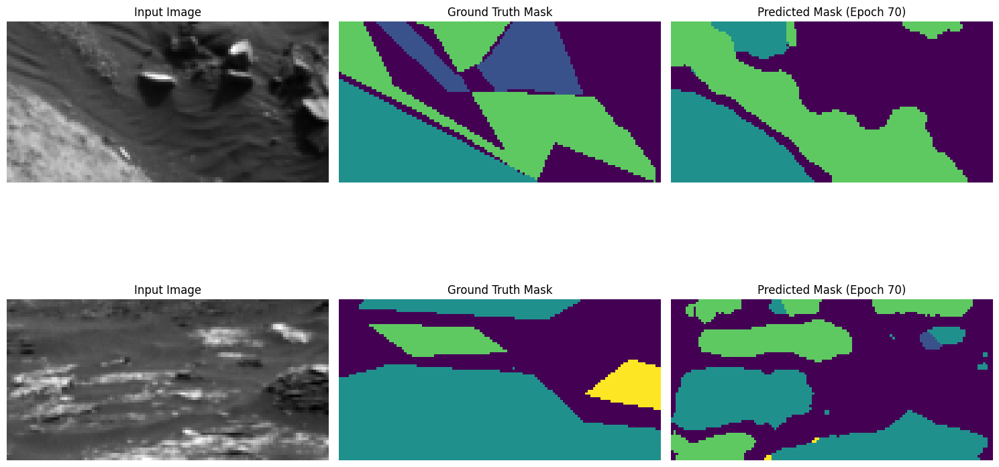

315/315 ━━━━━━━━━━━━━━━━━━━━ 69s 220ms/step - accuracy: 0.8481 - loss: 0.5914 - mean_iou: 0.6458 - val_accuracy: 0.7655 - val_loss: 0.7121 - val_mean_iou: 0.4620 - learning_rate: 1.5625e-06
Epoch 71/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step - accuracy: 0.8485 - loss: 0.5910 - mean_iou: 0.6463Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 71: val_loss did not improve from 0.70823
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


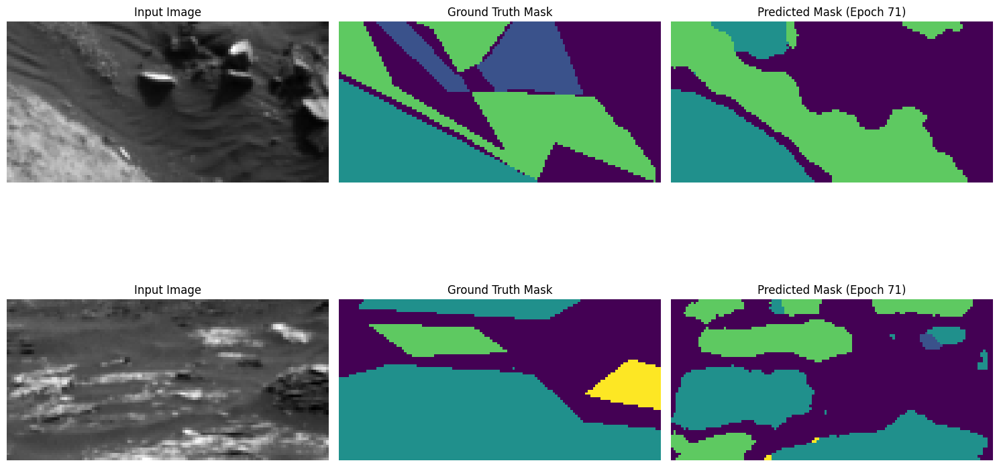

315/315 ━━━━━━━━━━━━━━━━━━━━ 69s 220ms/step - accuracy: 0.8485 - loss: 0.5910 - mean_iou: 0.6463 - val_accuracy: 0.7652 - val_loss: 0.7122 - val_mean_iou: 0.4623 - learning_rate: 1.5625e-06
Epoch 72/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - accuracy: 0.8489 - loss: 0.5907 - mean_iou: 0.6467Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 72: val_loss did not improve from 0.70823
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


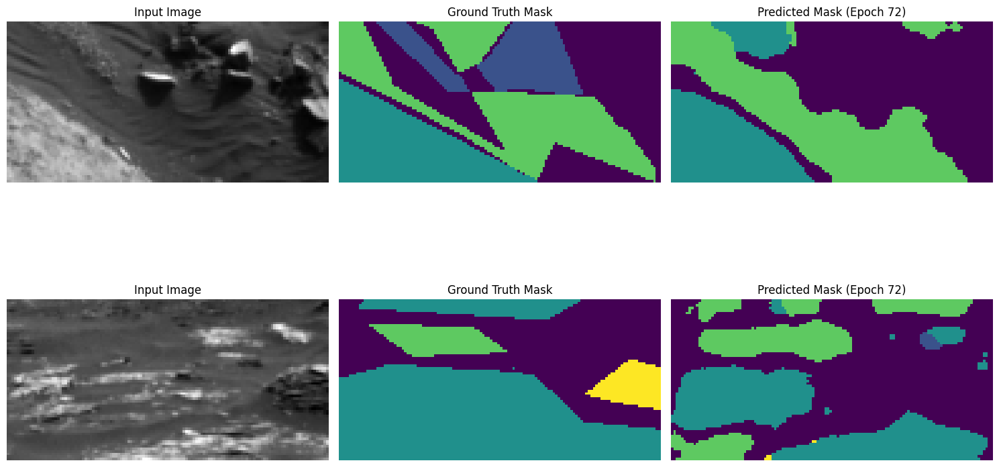

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 221ms/step - accuracy: 0.8489 - loss: 0.5907 - mean_iou: 0.6467 - val_accuracy: 0.7655 - val_loss: 0.7118 - val_mean_iou: 0.4624 - learning_rate: 1.5625e-06
Epoch 73/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - accuracy: 0.8492 - loss: 0.5904 - mean_iou: 0.6475Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 73: val_loss did not improve from 0.70823

Epoch 73: ReduceLROnPlateau reducing learning rate to 1e-06.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


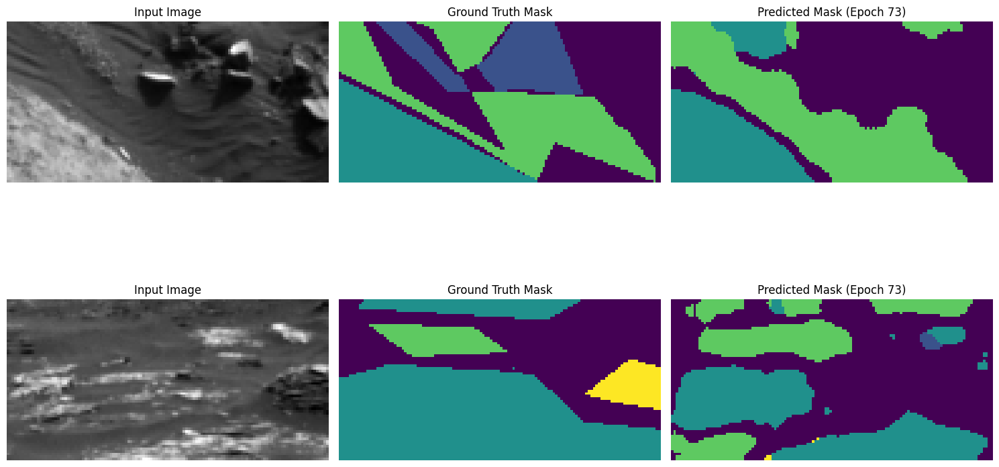

315/315 ━━━━━━━━━━━━━━━━━━━━ 70s 221ms/step - accuracy: 0.8492 - loss: 0.5904 - mean_iou: 0.6474 - val_accuracy: 0.7650 - val_loss: 0.7122 - val_mean_iou: 0.4623 - learning_rate: 1.5625e-06
Epoch 74/1000
314/315 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step - accuracy: 0.8496 - loss: 0.5901 - mean_iou: 0.6478Available log keys: dict_keys(['accuracy', 'loss', 'mean_iou', 'val_accuracy', 'val_loss', 'val_mean_iou'])

Epoch 74: val_loss did not improve from 0.70823
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


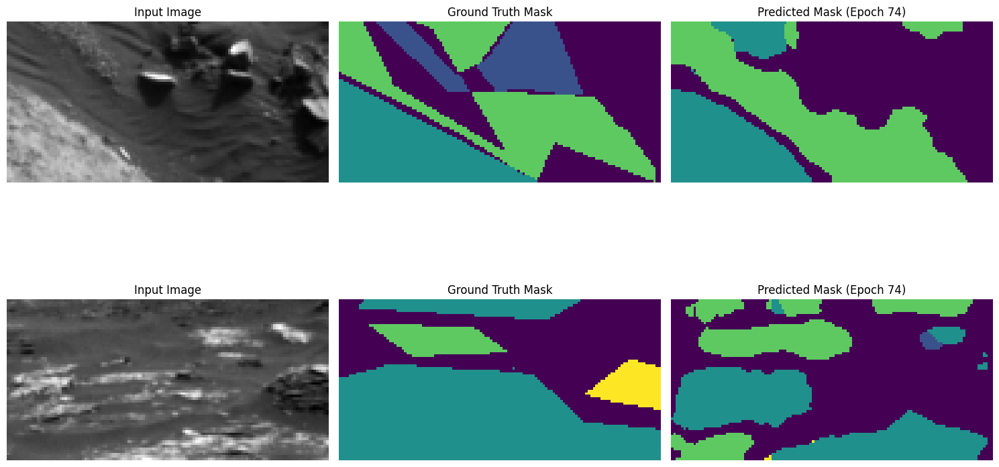

315/315 ━━━━━━━━━━━━━━━━━━━━ 69s 220ms/step - accuracy: 0.8496 - loss: 0.5901 - mean_iou: 0.6478 - val_accuracy: 0.7651 - val_loss: 0.7120 - val_mean_iou: 0.4621 - learning_rate: 1.0000e-06
Epoch 75/1000
281/315 ━━━━━━━━━━━━━━━━━━━━ 7s 215ms/step - accuracy: 0.8498 - loss: 0.5899 - mean_iou: 0.6477


KeyboardInterrupt



In [30]:
import tensorflow as tf
from tensorflow.keras import layers as tfkl

# Residual Block with Normalization
def residual_block(x, filters, norm_type='layer'):
    shortcut = x
    x = tfkl.Conv2D(filters, (3, 3), padding='same')(x)
    x = apply_normalization(x, norm_type)
    x = tfkl.Activation('relu')(x)
    x = tfkl.Conv2D(filters, (3, 3), padding='same')(x)
    x = apply_normalization(x, norm_type)
    x = tfkl.Activation('relu')(x)
    shortcut = tfkl.Conv2D(filters, (1, 1), padding='same')(shortcut)
    return tfkl.add([x, shortcut])

# Skip Connection with Learnable Fusion
def learnable_skip_connection(encoder_features, decoder_features, filters):
    # Concatenate encoder and decoder features
    concat_features = tfkl.Concatenate()([encoder_features, decoder_features])
    # Apply a learnable fusion mechanism
    fusion_gate = tfkl.Conv2D(filters, (1, 1), activation='sigmoid')(concat_features)
    weighted_features = fusion_gate * encoder_features + (1 - fusion_gate) * decoder_features
    return weighted_features
def focal_dice_loss(class_weights, gamma=2.0, alpha=0.25, smooth=1e-6):
    def loss(y_true, y_pred):
        # One-hot encode y_true
        y_true_one_hot = tf.one_hot(tf.cast(y_true, tf.int32), depth=len(class_weights))

        # Sıkıştır (fazladan kanal boyutunu kaldır)
        if len(y_true_one_hot.shape) > len(y_pred.shape):
            y_true_one_hot = tf.squeeze(y_true_one_hot, axis=-2)  # Fazladan boyutu sıkıştır
        
        # y_pred'in değerlerini sınırlı bir aralıkta tut
        y_pred = tf.clip_by_value(y_pred, tf.keras.backend.epsilon(), 1 - tf.keras.backend.epsilon())
        
        # Focal Loss
        ce_loss = -y_true_one_hot * tf.math.log(y_pred)
        focal_loss = alpha * tf.pow(1 - y_pred, gamma) * ce_loss
        focal_loss = tf.reduce_mean(tf.reduce_sum(class_weights * focal_loss, axis=-1))
        
        # Dice Loss
        intersection = tf.reduce_sum(y_true_one_hot * y_pred, axis=(1, 2))
        denominator = tf.reduce_sum(y_true_one_hot + y_pred, axis=(1, 2))
        dice_loss = 1 - (2 * intersection * class_weights + smooth) / (denominator * class_weights + smooth)
        dice_loss = tf.reduce_mean(dice_loss)
        
        # Total Loss
        total_loss = focal_loss + dice_loss
        return total_loss
    return loss

# Adaptive Normalization
def apply_normalization(x, norm_type):
    if norm_type == 'layer':
        return tfkl.LayerNormalization()(x)
    elif norm_type == 'instance':
        return tfkl.InstanceNormalization()(x)
    elif norm_type == 'group':
        # For Group Normalization, use TensorFlow Addons
        from tensorflow_addons.layers import GroupNormalization
        return GroupNormalization(groups=8, axis=-1)(x)
    else:
        raise ValueError(f"Unsupported normalization type: {norm_type}")

# U-Net with Residual Connections, Adaptive Normalization, and Learnable Fusion
def enhanced_unet(input_shape, num_classes, norm_type='layer'):
    inputs = tfkl.Input(input_shape)

    # Encoder
    c1 = residual_block(inputs, 64, norm_type=norm_type)
    p1 = tfkl.MaxPooling2D((2, 2))(c1)

    c2 = residual_block(p1, 128, norm_type=norm_type)
    p2 = tfkl.MaxPooling2D((2, 2))(c2)

    c3 = residual_block(p2, 256, norm_type=norm_type)
    p3 = tfkl.MaxPooling2D((2, 2))(c3)

    c4 = residual_block(p3, 512, norm_type=norm_type)

    # Decoder
    u1 = tfkl.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(c4)
    u1 = learnable_skip_connection(c3, u1, 256)
    d1 = residual_block(u1, 256, norm_type=norm_type)

    u2 = tfkl.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(d1)
    u2 = learnable_skip_connection(c2, u2, 128)
    d2 = residual_block(u2, 128, norm_type=norm_type)

    u3 = tfkl.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(d2)
    u3 = learnable_skip_connection(c1, u3, 64)
    d3 = residual_block(u3, 64, norm_type=norm_type)

    outputs = tfkl.Conv2D(num_classes, (1, 1), activation='softmax')(d3)

    return tf.keras.Model(inputs, outputs)

# Initialize the enhanced U-Net
input_shape = X_train.shape[1:]  # e.g., (64, 128, 1)
num_classes = 5

model = enhanced_unet(input_shape, num_classes, norm_type='layer')
# Calculate class weights based on pixel proportions
class_pixel_counts = np.bincount(y_train_int.flatten(), minlength=num_classes)  # Count pixels for each class
total_pixels = np.sum(class_pixel_counts)  # Total number of pixels
class_weights = total_pixels / (class_pixel_counts + 1e-6)  # Inverse frequency
class_weights /= np.sum(class_weights)  # Normalize to sum to 1
# Compile the model with the new loss function
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss=focal_dice_loss(class_weights),
    metrics=["accuracy", MeanIntersectionOverUnion(num_classes=num_classes, labels_to_exclude=[0])]
)

model.summary()

# Training
save_best_miou = SaveBestMeanIoU(filepath="best_model_mean_iou.h5", monitor="val_mean_iou", mode="max", verbose=1)
history = model.fit(
    X_train,
    y_train,
    validation_data=(X_val, y_val),
    epochs=1000,
    callbacks=[save_best_miou, early_stopping, model_checkpoint, reduce_lr, visualize_callback]
)


In [31]:

print(f"X_train_finetune shape: {X_train.shape}")
print(f"y_train_finetune shape: {y_train.shape}")
print(f"X_val_top_20_percent shape: {X_val.shape}")
print(f"y_val_top_20_percent shape: {y_val.shape}")

X_train_finetune shape: (10050, 64, 128, 1)
y_train_finetune shape: (10050, 64, 128)
X_val_top_20_percent shape: (501, 64, 128, 1)
y_val_top_20_percent shape: (501, 64, 128, 1)


In [32]:
# Load the saved model
best_model = tf.keras.models.load_model("best_model.keras",compile=False)



In [33]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
X_train_finetune=X_train[top_20_percent_indices]
y_train_finetune=y_train[top_20_percent_indices]
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Veri artırma argümanları
data_gen_args = dict(
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode="nearest"
)

# Hem görüntü hem maske için veri artırma
image_datagen = ImageDataGenerator(**data_gen_args)
mask_datagen = ImageDataGenerator(**data_gen_args)

X_train_aug = []
y_train_aug = []

for x, y in zip(X_train_finetune, y_train_finetune):
    x = np.expand_dims(x, axis=-1) if x.ndim == 2 else x  # Kanal boyutunu ekle
    y = np.expand_dims(y, axis=-1) if y.ndim == 2 else y  # Kanal boyutunu ekle

    # Her görüntü ve maske çifti için aynı random seed kullanılır
    seed = np.random.randint(0, 10000)
    
    # Görüntüyü artır
    image_generator = image_datagen.flow(
        x[np.newaxis, ...],  # Batch boyutu ekle
        batch_size=1,
        seed=seed
    )
    
    # Maskeyi artır
    mask_generator = mask_datagen.flow(
        y[np.newaxis, ...],  # Batch boyutu ekle
        batch_size=1,
        seed=seed
    )

    # Örnekler oluştur
    for _ in range(5):  # Her görüntü için 5 artırılmış örnek oluştur
        augmented_x = next(image_generator)[0]  # İlk örneği al
        augmented_y = next(mask_generator)[0]  # İlk örneği al
        
        # Maskeyi bir kez daha yuvarlayarak tam sayı yap
        augmented_y = np.round(augmented_y).astype(int)

        X_train_aug.append(augmented_x)
        y_train_aug.append(augmented_y)

# Ensure y_train_finetune has the correct dimensions
if y_train_finetune.ndim == 3:  # Check if channel dimension is missing
    y_train_finetune = np.expand_dims(y_train_finetune, axis=-1)

# Veri artırmayı orijinal veriyle birleştir
X_train_finetune = np.concatenate([X_train_finetune, X_train_aug], axis=0)
y_train_finetune = np.concatenate([y_train_finetune, y_train_aug], axis=0)

print(f"Fine-tuning dataset size: {X_train_finetune.shape}, {y_train_finetune.shape}")




Fine-tuning dataset size: (396, 64, 128, 1), (396, 64, 128, 1)


In [34]:
model.load_weights("best_model_mean_iou.h5")

In [35]:
print(f"X_train_finetune shape: {X_train_finetune.shape}")
print(f"y_train_finetune shape: {y_train_finetune.shape}")
print(f"X_val_top_20_percent shape: {X_val_top_20_percent.shape}")
print(f"y_val_top_20_percent shape: {y_val_top_20_percent.shape}")

X_train_finetune shape: (396, 64, 128, 1)
y_train_finetune shape: (396, 64, 128, 1)
X_val_top_20_percent shape: (2, 64, 128)
y_val_top_20_percent shape: (2, 64, 128)


In [37]:

if X_val_top_20_percent.ndim == 3:
    X_val_top_20_percent = np.expand_dims(X_val_top_20_percent, axis=-1)



print(f"X_train_finetune shape: {X_train_finetune.shape}")
print(f"y_train_finetune shape: {y_train_finetune.shape}")
print(f"X_val_top_20_percent shape: {X_val_top_20_percent.shape}")
print(f"y_val_top_20_percent shape: {y_val_top_20_percent.shape}")
# Calculate the additional epochs
additional_epochs = 20 # Adjust if initial training stopped earlier


X_train_finetune=X_train[top_20_percent_indices]
y_train_finetune=y_train[top_20_percent_indices]

# Ensure y_train_finetune has the correct dimensions
if y_val_top_20_percent.ndim == 3:  # Check if channel dimension is missing
    y_val_top_20_percent = np.expand_dims(y_val_top_20_percent, axis=-1)


# Fine-tuning
history_finetune = model.fit(
    X_train_finetune,
    y_train_finetune,
    validation_data=(X_val_top_20_percent, y_val_top_20_percent),  # Use top 20% validation data
    initial_epoch=94,  # Start from the epoch where training stopped
    epochs=additional_epochs + 94,  # Extend by additional epochs
    callbacks=[early_stopping, reduce_lr, model_checkpoint]
)


X_train_finetune shape: (66, 64, 128, 1)
y_train_finetune shape: (66, 64, 128)
X_val_top_20_percent shape: (2, 64, 128, 1)
y_val_top_20_percent shape: (2, 64, 128)
Epoch 95/114
2/3 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step - accuracy: 0.8169 - loss: 0.6404 - mean_iou: 0.5329
Epoch 95: val_loss did not improve from 0.70823
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 952ms/step - accuracy: 0.8124 - loss: 0.6422 - mean_iou: 0.5283 - val_accuracy: 0.2400 - val_loss: 1.1827 - val_mean_iou: 0.0648 - learning_rate: 1.0000e-06
Epoch 96/114
2/3 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - accuracy: 0.8174 - loss: 0.6400 - mean_iou: 0.5332
Epoch 96: val_loss did not improve from 0.70823
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step - accuracy: 0.8129 - loss: 0.6418 - mean_iou: 0.5286 - val_accuracy: 0.2400 - val_loss: 1.1827 - val_mean_iou: 0.0648 - learning_rate: 1.0000e-06
Epoch 97/114
2/3 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step - accuracy: 0.8181 - loss: 0.6395 - mean_iou: 0.5336
Epoch 97: val_loss did not improve from 0.70823
3/3 ━━━

In [38]:
rare_class_eval = model.evaluate(X_val_top_20_percent, y_val_top_20_percent)
print(f"Rare Class Validation Evaluation: {rare_class_eval}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - accuracy: 0.2400 - loss: 1.1827 - mean_iou: 0.0648
Rare Class Validation Evaluation: [1.1827040910720825, 0.239990234375, 0.06479184329509735]


In [39]:
# Load the saved model
import numpy as np
from sklearn.metrics import confusion_matrix

# Load the saved best model
#best_model = tf.keras.models.load_model("best_model_mean_iou.h5", custom_objects={"MeanIoU": tf.keras.metrics.MeanIoU})

# Predict on validation data
y_val_pred = model.predict(X_val)
y_val_pred_classes = np.argmax(y_val_pred, axis=-1)  # Convert to class predictions

# Reshape the true labels to match the predictions
y_val_true = y_val.squeeze()  # Remove channel dimension if present

# Initialize variables to store IoU per class
num_classes = 5
ious = []

# Compute IoU for each class
for class_id in range(1,num_classes):
    true_class = (y_val_true == class_id).astype(int)
    pred_class = (y_val_pred_classes == class_id).astype(int)
    intersection = np.sum(true_class * pred_class)
    union = np.sum(true_class + pred_class) - intersection
    iou = intersection / union if union > 0 else 0.0
    ious.append(iou)
    print(f"Class {class_id} IoU: {iou:.4f}")

# Display mean IoU
mean_iou = np.mean([iou for iou in ious])  # Exclude zero IoUs
print(f"Mean IoU (excluding zero IoUs): {mean_iou:.4f}")


16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 117ms/step
Class 1 IoU: 0.7198
Class 2 IoU: 0.5855
Class 3 IoU: 0.6906
Class 4 IoU: 0.0624
Mean IoU (excluding zero IoUs): 0.5146


In [40]:
import numpy as np

def mean_iou(y_true, y_pred, num_classes):
    """
    Calculate Mean Intersection over Union (IoU)
    :param y_true: Ground truth masks (H, W)
    :param y_pred: Predicted masks (H, W)
    :param num_classes: Number of classes
    :return: Mean IoU for all classes
    """
    iou_per_class = []
    for cls in range(num_classes):
        intersection = np.logical_and(y_true == cls, y_pred == cls).sum()
        union = np.logical_or(y_true == cls, y_pred == cls).sum()
        if union == 0:  # Avoid division by zero
            iou_per_class.append(np.nan)  # Mark as NaN if the class is not present
        else:
            iou_per_class.append(intersection / union)
    mean_iou_value = np.nanmean(iou_per_class)  # Mean ignoring NaNs
    return mean_iou_value, iou_per_class


In [41]:
# Full validation dataset predictions
y_val_pred_full = model.predict(X_val)
y_val_pred_full = np.argmax(y_val_pred_full, axis=-1)  # Convert to class indices

# Top 20% rare class validation dataset predictions
y_val_pred_rare = model.predict(X_val_top_20_percent)
y_val_pred_rare = np.argmax(y_val_pred_rare, axis=-1)


16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 730ms/step


In [42]:
# Full validation dataset
mean_iou_full, iou_per_class_full = mean_iou(y_val.flatten(), y_val_pred_full.flatten(), num_classes)
print("Full Validation Mean IoU:", mean_iou_full)
for cls, iou in enumerate(iou_per_class_full):
    print(f"Class {cls} IoU: {iou:.4f}")

# Top 20% rare class validation dataset
mean_iou_rare, iou_per_class_rare = mean_iou(y_val_top_20_percent.flatten(), y_val_pred_rare.flatten(), num_classes)
print("\nTop 20% Rare Class Validation Mean IoU:", mean_iou_rare)
for cls, iou in enumerate(iou_per_class_rare):
    print(f"Class {cls} IoU: {iou:.4f}")


Full Validation Mean IoU: 0.49536361856289374
Class 0 IoU: 0.4185
Class 1 IoU: 0.7198
Class 2 IoU: 0.5855
Class 3 IoU: 0.6906
Class 4 IoU: 0.0624

Top 20% Rare Class Validation Mean IoU: 0.130618572233741
Class 0 IoU: 0.2179
Class 1 IoU: nan
Class 2 IoU: nan
Class 3 IoU: 0.0649
Class 4 IoU: 0.1091


In [43]:
#model=best_model

In [44]:
model_filename = f"model_best_normalized_augmented_hvr_best_invert_noise.keras"
model.save(model_filename)

print(f"Model saved to {model_filename}")

Model saved to model_best_normalized_augmented_hvr_best_invert_noise.keras


## 📊 Prepare Your Submission

In our Kaggle competition, submissions are made as `csv` files. To create a proper `csv` file, you need to flatten your predictions and include an `id` column as the first column of your dataframe. To maintain consistency between your results and our solution, please avoid shuffling the test set. The code below demonstrates how to prepare the `csv` file from your model predictions.



In [45]:
import os
# If model_filename is not defined, load the most recent model from Google Drive
if "model_filename" not in globals() or model_filename is None:
    files = [f for f in os.listdir('.') if os.path.isfile(f) and f.startswith('model_') and f.endswith('.keras')]
    files.sort(key=lambda x: os.path.getmtime(x), reverse=True)
    if files:
        model_filename = files[0]
    else:
        raise FileNotFoundError("No model files found in the current directory.")

In [46]:
print(f"X_test shape before reshaping: {X_test.shape}")

X_test shape before reshaping: (10022, 64, 128, 1)


In [51]:
# Generate predictions
preds = model.predict(X_test)
preds = np.argmax(preds, axis=-1)  # Convert probabilities to class labels
print(f"Predictions shape: {preds.shape}")
preds = model.predict(X_test)
preds = np.argmax(preds, axis=-1)  # Convert probabilities to class labels

# Replace predicted class 0 with class 4
preds[preds == 0] = 4
print(f"Predictions shape: {preds.shape}")

314/314 ━━━━━━━━━━━━━━━━━━━━ 21s 67ms/step
Predictions shape: (10022, 64, 128)
314/314 ━━━━━━━━━━━━━━━━━━━━ 22s 71ms/step
Predictions shape: (10022, 64, 128)


Randomly selected indices for prediction (seed=42): [3543 5731 4801  416 5125 9915  293 5020 1765 4192 2288 1188  107 7583
  856 5090 9784 5192 6935  850]


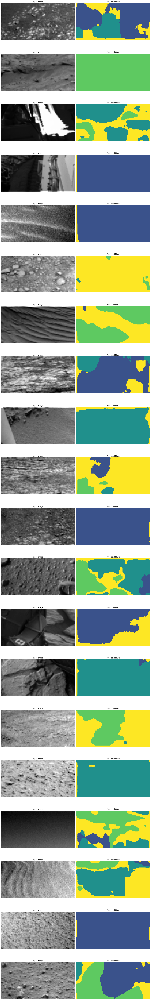

In [52]:
import numpy as np
import matplotlib.pyplot as plt

# Set random seed for reproducibility
np.random.seed(42)
# Randomly select 20 indices for prediction
random_indices = np.random.choice(X_test.shape[0], size=20, replace=False)
print(f"Randomly selected indices for prediction (seed=42): {random_indices}")

# Select 20 random samples and their corresponding masks
X_sample = X_test[random_indices]



predicted_masks = preds

# Visualize the predictions
num_images = len(X_sample)  # Number of images to visualize
fig, axes = plt.subplots(num_images, 2, figsize=(15, num_images * 5))

for i in range(num_images):
    # Original Image
    ax_img = axes[i, 0]
    ax_img.imshow(X_sample[i].squeeze(), cmap="gray")
    ax_img.set_title("Input Image")
    ax_img.axis("off")

    # Predicted Mask
    ax_pred = axes[i, 1]
    ax_pred.imshow(predicted_masks[i], cmap="viridis",vmin=0,vmax=4)
    ax_pred.set_title("Predicted Mask")
    ax_pred.axis("off")

plt.tight_layout()
plt.show()

In [53]:
def y_to_df(y) -> pd.DataFrame:
    """Converts segmentation predictions into a DataFrame format for Kaggle."""
    n_samples = len(y)
    y_flat = y.reshape(n_samples, -1)
    df = pd.DataFrame(y_flat)
    df["id"] = np.arange(n_samples)
    cols = ["id"] + [col for col in df.columns if col != "id"]
    return df[cols]

In [54]:
# Create and download the csv submission file
timestep_str = model_filename.replace("model_", "").replace(".keras", "")
submission_filename = f"submission_{timestep_str}.csv"
submission_df = y_to_df(preds)
submission_df.to_csv(submission_filename, index=False)



In [55]:
rare_class_threshold = 0.5  # Lower for rare class
common_class_threshold = 0.8  # Higher for other classes
    

314/314 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step

Class 0:
  Min Probability: 0.2670
  Max Probability: 1.0000
  Mean Probability: 0.9910
  Std Deviation: 0.0480

Class 1:
  Min Probability: 0.2845
  Max Probability: 1.0000
  Mean Probability: 0.9975
  Std Deviation: 0.0252

Class 2:
  Min Probability: 0.2973
  Max Probability: 1.0000
  Mean Probability: 0.9954
  Std Deviation: 0.0320

Class 3:
  Min Probability: 0.2995
  Max Probability: 1.0000
  Mean Probability: 0.9962
  Std Deviation: 0.0310

Class 4:
  Min Probability: 0.2822
  Max Probability: 1.0000
  Mean Probability: 0.8859
  Std Deviation: 0.1528


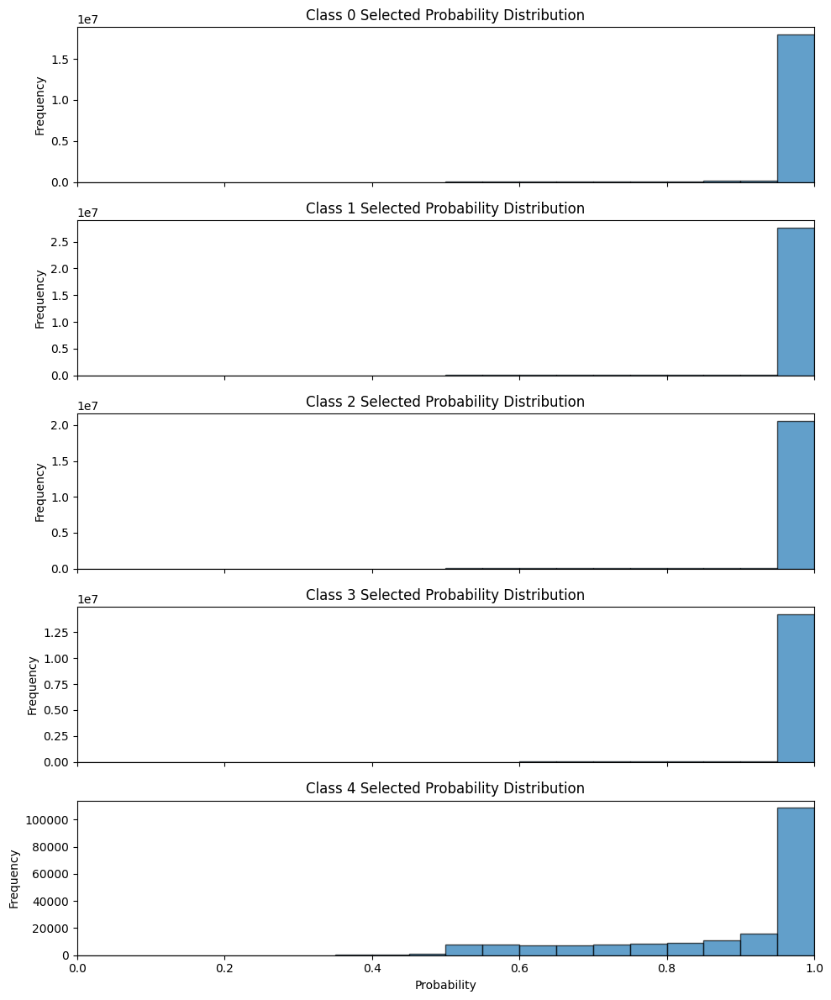

In [57]:
# Step 1: Get model predictions
pred_probs = model.predict(X_test)  # Shape: (num_samples, height, width, num_classes)

# Step 2: Get selected classes and their probabilities
selected_classes = np.argmax(pred_probs, axis=-1)  # Shape: (num_samples, height, width)
selected_probs = np.max(pred_probs, axis=-1)       # Shape: (num_samples, height, width)

# Flatten arrays for easier processing
flat_selected_classes = selected_classes.flatten()
flat_selected_probs = selected_probs.flatten()

# Step 3: Calculate statistics for each class
stats = {}
for class_idx in range(pred_probs.shape[-1]):
    class_mask = flat_selected_classes == class_idx
    class_probs = flat_selected_probs[class_mask]
    if len(class_probs) > 0:
        stats[f'Class {class_idx}'] = {
            'Min Probability': np.min(class_probs),
            'Max Probability': np.max(class_probs),
            'Mean Probability': np.mean(class_probs),
            'Std Deviation': np.std(class_probs)
        }
    else:
        stats[f'Class {class_idx}'] = {
            'Min Probability': None,
            'Max Probability': None,
            'Mean Probability': None,
            'Std Deviation': None
        }

# Print statistics
for class_name, class_stats in stats.items():
    print(f"\n{class_name}:")
    for stat_name, value in class_stats.items():
        if value is not None:
            print(f"  {stat_name}: {value:.4f}")
        else:
            print(f"  {stat_name}: No pixels for this class")

# Step 4: Plot histograms for all classes
import matplotlib.pyplot as plt

num_classes = pred_probs.shape[-1]
fig, axes = plt.subplots(num_classes, 1, figsize=(10, 12), sharex=True)

for class_idx in range(num_classes):
    class_mask = flat_selected_classes == class_idx
    class_probs = flat_selected_probs[class_mask]
    
    if len(class_probs) > 0:
        axes[class_idx].hist(class_probs, bins=20, range=(0, 1), alpha=0.7, edgecolor='black')
        axes[class_idx].set_title(f'Class {class_idx} Selected Probability Distribution')
        axes[class_idx].set_ylabel('Frequency')
        axes[class_idx].set_xlim(0, 1)
    else:
        axes[class_idx].set_title(f'Class {class_idx}: No Pixels')
        axes[class_idx].set_ylabel('Frequency')

# Add shared x-axis label
axes[-1].set_xlabel('Probability')
plt.tight_layout()
plt.show()

# Get class predictions and confidence scores
pseudo_labels = np.argmax(pred_probs, axis=-1)  # Predicted classes
confidence_scores = np.max(pred_probs, axis=-1)  # Confidence of predictions

# Create a mask for high-confidence predictions
high_confidence_mask = np.zeros_like(confidence_scores, dtype=bool)

for class_idx in range(pred_probs.shape[-1]):
    if class_idx == 4:  # Rare class
        high_confidence_mask |= (pseudo_labels == class_idx) & (confidence_scores > rare_class_threshold)
    else:  # Common classes
        high_confidence_mask |= (pseudo_labels == class_idx) & (confidence_scores > common_class_threshold)

# Filter pseudo-labeled data
pseudo_data = X_test[high_confidence_mask]
pseudo_labels_filtered = pseudo_labels[high_confidence_mask]


In [58]:
# Create high-confidence mask for pseudo-labels
high_confidence_mask = (confidence_scores > rare_class_threshold) | (confidence_scores > common_class_threshold)  # Shape: (num_samples, height, width)

# Expand the mask to match the shape of X_test
high_confidence_mask_expanded = high_confidence_mask[..., np.newaxis]  # Shape: (num_samples, height, width, 1)


In [59]:
# Filter X_test using the mask
pseudo_data = X_test * high_confidence_mask_expanded  # Shape: (num_samples, height, width, channels)

# Verify the shape
print("Pseudo data shape:", pseudo_data.shape)
# Apply the mask to pseudo_labels (3D)
pseudo_labels_filtered = pseudo_labels * high_confidence_mask  # Shape: (num_samples, height, width)

# Verify the shape
print("Pseudo labels filtered shape:", pseudo_labels_filtered.shape)


Pseudo data shape: (10022, 64, 128, 1)
Pseudo labels filtered shape: (10022, 64, 128)


In [60]:
X_combined = np.concatenate([X_train, pseudo_data], axis=0)  # Shape: (num_samples_combined, height, width, channels)
y_combined = np.concatenate([y_train, pseudo_labels_filtered], axis=0)  # Shape: (num_samples_combined, height, width)


In [61]:
print("X_train shape:", X_train.shape)
print("pseudo_data shape:", pseudo_data.shape)
print("y_train shape:", y_train.shape)
print("pseudo_labels_filtered shape:", pseudo_labels_filtered.shape)


X_train shape: (10050, 64, 128, 1)
pseudo_data shape: (10022, 64, 128, 1)
y_train shape: (10050, 64, 128)
pseudo_labels_filtered shape: (10022, 64, 128)


In [71]:
import tensorflow as tf

def mean_iou(y_true, y_pred, num_classes):
    # Convert predictions to integer labels
    y_pred = tf.argmax(y_pred, axis=-1)
    y_true = tf.cast(y_true, tf.int32)
    
    # Compute IoU for each class
    iou = []
    for i in range(num_classes):
        intersection = tf.reduce_sum(tf.cast((y_pred == i) & (y_true == i), tf.float32))
        union = tf.reduce_sum(tf.cast((y_pred == i) | (y_true == i), tf.float32))
        iou.append(intersection / (union + tf.keras.backend.epsilon()))
    
    return tf.reduce_mean(iou)

# Wrap it with the required num_classes
num_classes = 5  # Adjust to match your dataset
mean_iou_metric = lambda y_true, y_pred: mean_iou(y_true, y_pred, num_classes)

# Compile the model with the custom metric
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=[mean_iou_metric]
)


In [74]:
history = model.fit(
    X_combined,
    y_combined,
    validation_split=0.2,  # Reserve 20% of data for validation
    epochs=5,            # Adjust as needed
    batch_size=16,        # Adjust based on GPU/CPU resources
    shuffle=True
)



KeyboardInterrupt



In [75]:
# Generate predictions
preds = model.predict(X_test)
preds = np.argmax(preds, axis=-1)  # Convert probabilities to class labels
print(f"Predictions shape: {preds.shape}")

# Replace predicted class 0 with class 4
preds[preds == 0] = 4
print(f"Predictions shape: {preds.shape}")

314/314 ━━━━━━━━━━━━━━━━━━━━ 25s 76ms/step
Predictions shape: (10022, 64, 128)
314/314 ━━━━━━━━━━━━━━━━━━━━ 24s 76ms/step
Predictions shape: (10022, 64, 128)


In [76]:
# Create and download the csv submission file
timestep_str = model_filename.replace("model_", "").replace(".keras", "")
submission_filename = f"submission_pseudo_{timestep_str}.csv"
submission_df = y_to_df(preds)
submission_df.to_csv(submission_filename, index=False)

